In [2]:
# Импорт необходимых библиотек
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import PowerTransformer

In [3]:
# Загружаем данные
data = pd.read_excel('Данные_для_курсовои_Классическое_МО.xlsx')
print("Данные загружены успешно!")

Данные загружены успешно!


In [4]:
data

,Unnamed: 0,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,0,6.239374,175.482382,28.125000,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,...,0,0,0,0,0,0,0,0,3,0
1,1,0.771831,5.402819,7.000000,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,...,0,0,0,0,0,0,0,0,3,0
2,2,223.808778,161.142320,0.720000,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,...,0,0,0,0,0,0,0,0,3,0
3,3,1.705624,107.855654,63.235294,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,...,0,0,0,0,0,0,0,0,4,0
4,4,107.131532,139.270991,1.300000,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,996,31.000104,34.999650,1.129017,12.934891,12.934891,0.048029,-0.476142,0.382752,49.133333,...,0,0,0,0,0,0,0,0,0,0
997,997,31.999934,33.999415,1.062484,13.635345,13.635345,0.030329,-0.699355,0.369425,44.542857,...,0,0,0,0,0,0,0,0,0,0
998,998,30.999883,33.999458,1.096761,13.991690,13.991690,0.026535,-0.650790,0.284923,41.973684,...,1,0,0,0,0,0,0,0,0,0
999,999,31.998959,32.999644,1.031272,13.830180,13.830180,0.146522,-1.408652,0.381559,39.000000,...,0,0,0,0,0,0,0,0,0,0


In [5]:
# удалим порядковый номер
data.drop('Unnamed: 0', axis=1, inplace=True)

In [6]:
# Выведем названия столбцов 
column_names = data.columns.tolist()

print(column_names)

['IC50, mM', 'CC50, mM', 'SI', 'MaxAbsEStateIndex', 'MaxEStateIndex', 'MinAbsEStateIndex', 'MinEStateIndex', 'qed', 'SPS', 'MolWt', 'HeavyAtomMolWt', 'ExactMolWt', 'NumValenceElectrons', 'NumRadicalElectrons', 'MaxPartialCharge', 'MinPartialCharge', 'MaxAbsPartialCharge', 'MinAbsPartialCharge', 'FpDensityMorgan1', 'FpDensityMorgan2', 'FpDensityMorgan3', 'BCUT2D_MWHI', 'BCUT2D_MWLOW', 'BCUT2D_CHGHI', 'BCUT2D_CHGLO', 'BCUT2D_LOGPHI', 'BCUT2D_LOGPLOW', 'BCUT2D_MRHI', 'BCUT2D_MRLOW', 'AvgIpc', 'BalabanJ', 'BertzCT', 'Chi0', 'Chi0n', 'Chi0v', 'Chi1', 'Chi1n', 'Chi1v', 'Chi2n', 'Chi2v', 'Chi3n', 'Chi3v', 'Chi4n', 'Chi4v', 'HallKierAlpha', 'Ipc', 'Kappa1', 'Kappa2', 'Kappa3', 'LabuteASA', 'PEOE_VSA1', 'PEOE_VSA10', 'PEOE_VSA11', 'PEOE_VSA12', 'PEOE_VSA13', 'PEOE_VSA14', 'PEOE_VSA2', 'PEOE_VSA3', 'PEOE_VSA4', 'PEOE_VSA5', 'PEOE_VSA6', 'PEOE_VSA7', 'PEOE_VSA8', 'PEOE_VSA9', 'SMR_VSA1', 'SMR_VSA10', 'SMR_VSA2', 'SMR_VSA3', 'SMR_VSA4', 'SMR_VSA5', 'SMR_VSA6', 'SMR_VSA7', 'SMR_VSA8', 'SMR_VSA9', '

Согласно предствленных названий признаков можно выделить следующую информацию
### Целевые переменные (то, что мы предсказываем):
## IC50, mM (Inhibitory Concentration 50%, мМ): 
Целевая переменная (регрессия/классификация). Полумаксимальная ингибирующая концентрация. Концентрация соединения, при которой наблюдается 50% ингибирование определенного биологического процесса (в данном случае, эффективности против вируса гриппа). Чем ниже IC50, тем более эффективно соединение.
## CC50, mM (Cytotoxic Concentration 50%, мМ): 
Целевая переменная (регрессия/классификация). Полумаксимальная цитотоксическая концентрация. Концентрация соединения, при которой наблюдается 50% цитотоксический эффект (повреждение или гибель) на клеточной культуре. Чем выше CC50, тем менее токсично соединение для клеток.
## SI (Selectivity Index): 
Целевая переменная (регрессия/классификация). Индекс селективности, рассчитываемый как CC50 / IC50. Показывает, насколько соединение избирательно действует на целевой объект (вирус) по сравнению с его токсичностью для здоровых клеток. Чем выше SI, тем лучше селективность и потенциальная терапевтическая ценность.
### Дескрипторы EState (Electrotopological State Descriptors):
Дескрипторы EState описывают электронное и топологическое окружение атомов в молекуле. Они объединяют информацию о типе атома (его "состоянии") и его соседях в молекулярной топологии.

* MaxAbsEStateIndex: Максимальное абсолютное значение EState индекса атома.

* MaxEStateIndex: Максимальное значение EState индекса атома.

* MinAbsEStateIndex: Минимальное абсолютное значение EState индекса атома.

* MinEStateIndex: Минимальное значение EState индекса атома.

EState_VSA1 - EState_VSA11: Это сегменты VSA (от англ. "Volume and Surface Area"), взвешенные по EState. Они суммируют площади поверхности атомов, сгруппированных по диапазонам значений их EState индексов. Помогают понять распределение электронных свойств по поверхности молекулы, что важно для взаимодействия с белками.

### Дескрипторы BCUT2D (Burden-Cas-Randic-Topley Descriptors):
BCUT2D дескрипторы представляют собой спектральные дескрипторы, полученные из матриц смежности молекулы, взвешенных различными атомными свойствами (атомная масса, заряд, логарифм коэффициента распределения и молярная рефракция). Они характеризуют распределение этих свойств в молекуле.

* BCUT2D_MWHI: Высокий параметр BCUT2D, взвешенный по молекулярному весу.
* BCUT2D_MWLOW: Низкий параметр BCUT2D, взвешенный по молекулярному весу.
* BCUT2D_CHGHI: Высокий параметр BCUT2D, взвешенный по заряду атомов.
* BCUT2D_CHGLO: Низкий параметр BCUT2D, взвешенный по заряду атомов.
* BCUT2D_LOGPHI: Высокий параметр BCUT2D, взвешенный по логарифму коэффициента распределения P (липофильность).
* BCUT2D_LOGPLOW: Низкий параметр BCUT2D, взвешенный по логарифму коэффициента распределения P.
* BCUT2D_MRHI: Высокий параметр BCUT2D, взвешенный по молярной рефракции (размер и поляризуемость).
* BCUT2D_MRLOW: Низкий параметр BCUT2D, взвешенный по молярной рефракции.
* Дескрипторы VSA (Volume and Surface Area Descriptors):
* Дескрипторы VSA делят молекулу на фрагменты на основе свойств атомов (электростатический потенциал, липофильность, молярная рефракция) и суммируют площади Ван-дер-Ваальса для атомов в каждом сегменте.

### PEOE_VSA1 - PEOE_VSA14: 
Отражают суммарные площади поверхности атомов, сгруппированных по диапазонам парциальных зарядов (PEOE - Partial Equalization of Orbital Electronegativity). Полезны для понимания электростатических взаимодействий.
### SMR_VSA1 - SMR_VSA10: 
Отражают суммарные площади поверхности атомов, сгруппированных по диапазонам молярной рефракции (SMR). Характеризуют размер и поляризуемость фрагментов.
### SlogP_VSA1 - SlogP_VSA12: 
Отражают суммарные площади поверхности атомов, сгруппированных по диапазонам фрагментарного логарифма коэффициента распределения P (SlogP). Важны для понимания липофильности и взаимодействия с липидными мембранами.
### Топологические дескрипторы (связанные с формой и структурой связей):
Эти дескрипторы описывают связность атомов и форму молекулы.

* qed (Quantitative Estimation of Drug-likeness): Количественная оценка "подобия лекарству". Это показатель, который оценивает, насколько молекула соответствует свойствам известных лекарственных препаратов. Чем выше QED, тем больше вероятность, что соединение является хорошим кандидатом на лекарство. Обычно находится в диапазоне от 0 до 1.
* SPS (Synthetic Accessibility Score): Оценка синтетической доступности. Показывает, насколько легко или сложно синтезировать данное соединение. Чем ниже SPS, тем легче синтезировать.
* AvgIpc (Average Information Content Index): Средний индекс информационного содержания. Описывает разнообразие атомов и связей в молекуле.
* BalabanJ (Balaban J Index): Топологический индекс, основанный на расстояниях между атомами. Характеризует степень разветвленности и циклической структуры молекулы.
* BertzCT (Bertz Complexity Index): Индекс сложности Берца. Измеряет структурную сложность молекулы, учитывая ее разветвленность, цикличность и гетероатомы.
* Chi0 - Chi4v (Molecular Connectivity Indices, Indices of Chi): Группа дескрипторов, основанных на топологических индексах Ки. Они отражают степень разветвленности, циклической структуры и размер молекулы. Существуют версии n (для неводородных атомов) и v (с учетом валентности атомов).
Chi0, Chi1, Chi2n, Chi3n, Chi4n: Общие индексы связности.
Chi0n, Chi1n, Chi2n, Chi3n, Chi4n: Для неводородных атомов.
Chi0v, Chi1v, Chi2v, Chi3v, Chi4v: С учетом валентности атомов.
* HallKierAlpha (Hall Kier Alpha Index): Ещё один топологический индекс, связанный с размером и формой молекулы.
* Ipc (Information Content Index): Индекс информационного содержания.
* Kappa1, Kappa2, Kappa3 (Kappa Shape Indices): Индексы формы Каппа. Описывают степень "сферичности" или компактности молекулы. Kappa1 – для линейной цепи, Kappa2 – для разветвленной цепи, Kappa3 – для цепи с тремя атомами.
* LabuteASA (Labute Approximate Surface Area): Приблизительная площадь поверхности молекулы. Важно для взаимодействия с водой и белками.
* TPSA (Topological Polar Surface Area): Топологическая полярная площадь поверхности. Сумма площадей поверхности всех полярных атомов (кислород, азот и присоединенный к ним водород). Очень важный дескриптор для предсказания проницаемости через мембраны и биодоступности. Чем выше TPSA, тем сложнее молекуле пройти через липидные мембраны.
* MolLogP (Octanol-Water Partition Coefficient): Логарифм коэффициента распределения между октанолом и водой. Ключевой показатель липофильности (жирорастворимости) молекулы. Важен для абсорбции, распределения и выведения препарата. Чем выше MolLogP, тем более липофильна молекула.
* MolMR (Molar Refractivity): Молярная рефракция. Дескриптор, связанный с объемом молекулы и поляризуемостью электронов.
### Дескрипторы, основанные на подсчете атомов и связей (Count Descriptors):
Эти дескрипторы просто считают количество определенных типов атомов, связей или структурных фрагментов.

* FractionCSP3: Доля sp3-гибридизованных углеродных атомов. Характеризует насыщенность и гибкость молекулы. Выше значение - больше гибкости и растворимости.
* HeavyAtomCount: Общее количество "тяжелых" атомов (все атомы, кроме водорода).
* NHOHCount: Количество атомов азота и кислорода, связанных с водородом (N-H и O-H группы). Отражает способность к образованию водородных связей.
* NOCount: Количество атомов азота и кислорода.
* NumValenceElectrons: Общее количество валентных электронов.
* NumRadicalElectrons: Количество неспаренных электронов (для радикалов). В большинстве стабильных молекул будет 0.
* NumAliphaticCarbocycles: Количество алифатических карбоциклов (неароматические кольца из углерода).
* NumAliphaticHeterocycles: Количество алифатических гетероциклов (неароматические кольца с гетероатомами).
* NumAliphaticRings: Общее количество алифатических колец.
* NumAromaticCarbocycles: Количество ароматических карбоциклов (бензольные кольца и т.д.).
* NumAromaticHeterocycles: Количество ароматических гетероциклов (кольца с гетероатомами, такие как пиридин, фуран).
* NumAromaticRings: Общее количество ароматических колец.
* NumHAcceptors: Количество акцепторов водородных связей (атомы N, O, F, способные принимать H-связь).
* NumHDonors: Количество доноров водородных связей (атомы N или O, связанные с H).
* NumHeteroatoms: Общее количество гетероатомов (все атомы, кроме углерода и водорода).
* NumRotatableBonds: Количество вращающихся связей. Характеризует гибкость молекулы. Высокая гибкость может влиять на связывание с белками и проницаемость.
* NumSaturatedCarbocycles: Количество насыщенных карбоциклов.
* NumSaturatedHeterocycles: Количество насыщенных гетероциклов.
* NumSaturatedRings: Общее количество насыщенных колец.
* RingCount: Общее количество колец в молекуле.
* Дескрипторы, основанные на заряде (Partial Charge Descriptors):
* MaxPartialCharge: Максимальный парциальный заряд атома.
* MinPartialCharge: Минимальный парциальный заряд атома.
* MaxAbsPartialCharge: Максимальное абсолютное значение парциального заряда атома.
* MinAbsPartialCharge: Минимальное абсолютное значение парциального заряда атома.
* Парциальные заряды важны для понимания электростатических взаимодействий молекулы с ее окружением (например, с активным центром белка).
### Дескрипторы Fingerprint Density (Morgan Fingerprints):
* FpDensityMorgan1, FpDensityMorgan2, FpDensityMorgan3: Эти дескрипторы основаны на Morgan Fingerprints (также известны как Circular Fingerprints). Они представляют собой численную оценку "плотности" уникальных структурных фрагментов (или "сфер") определенного радиуса в молекуле. FpDensityMorgan1 (радиус 1), FpDensityMorgan2 (радиус 2), FpDensityMorgan3 (радиус 3). Чем выше радиус, тем более сложные и крупные фрагменты учитываются. Полезны для оценки структурного разнообразия.
### Дескрипторы фрагментов (Functional Group Counts - fr_):
Это бинарные или целочисленные дескрипторы, которые указывают на наличие или количество определенных функциональных групп в молекуле. Наличие или отсутствие конкретных групп часто имеет огромное значение для биологической активности и токсичности.

* fr_Al_COO: Количество алифатических карбоксильных групп.
* fr_Al_OH: Количество алифатических спиртовых групп (гидроксилов).
* fr_Al_OH_noTert: Количество алифатических спиртовых групп, исключая третичные.
* fr_ArN: Количество ароматических нитро групп.
* fr_Ar_COO: Количество ароматических карбоксильных групп.
* fr_Ar_N: Количество ароматических аминов/нитро групп.
* fr_Ar_NH: Количество ароматических вторичных аминов.
* fr_Ar_OH: Количество ароматических спиртовых групп (фенолов).
* fr_COO: Количество карбоксильных групп.
* fr_COO2: Количество карбоксильных групп (другой подсчет).
* fr_C_O: Количество C=O групп (карбонилов).
* fr_C_O_noCOO: Количество C=O групп, исключая карбоксильные.
* fr_C_S: Количество C=S групп (тиокарбонилов).
* fr_HOCCN: Количество групп HOCCN (часто в спиртах/аминах).
* fr_Imine: Количество иминов.
* fr_NH0: Количество первичных аминов (NH2).
* fr_NH1: Количество вторичных аминов (NH).
* fr_NH2: Количество третичных аминов (N без H).
* fr_N_O: Количество N-O связей.
* fr_Ndealkylation1: Количество N-деацилируемых групп (обычно для метаболизма).
* fr_Ndealkylation2: Количество N-деацилируемых групп (другой тип).
* fr_Nhpyrrole: Количество пиррольных N-H групп.
* fr_SH: Количество тиоловых (сульфгидрильных) групп.
* fr_aldehyde: Количество альдегидных групп.
* fr_alkyl_carbamate: Количество алкилкарбаматов.
* fr_alkyl_halide: Количество алкилгалогенидов.
* fr_allylic_oxid: Количество аллильных окисляемых групп.
* fr_amide: Количество амидных групп.
* fr_amidine: Количество амидинов.
* fr_aniline: Количество анилинов.
* fr_aryl_methyl: Количество арилметильных групп.
* fr_azide: Количество азидных групп.
* fr_azo: Количество азо-групп.
* fr_barbitur: Количество барбитуратов.
* fr_benzene: Количество бензольных колец.
* fr_benzodiazepine: Количество бензодиазепиновых колец.
* fr_bicyclic: Количество бициклических фрагментов.
* fr_diazo: Количество диазо-групп.
* fr_dihydropyridine: Количество дигидропиридинов.
* fr_epoxide: Количество эпоксидов.
* fr_ester: Количество сложных эфиров.
* fr_ether: Количество простых эфиров.
* fr_furan: Количество фуранов.
* fr_guanido: Количество гуанидиновых групп.
* fr_halogen: Количество галогенов.
* fr_hdrzine: Количество гидразинов.
* fr_hdrzone: Количество гидразонов.
* fr_imidazole: Количество имидазолов.
* fr_imide: Количество имидов.
* fr_isocyan: Количество изоцианатов.
* fr_isothiocyan: Количество изотиоцианатов.
* fr_ketone: Количество кетонов.
* fr_ketone_Topliss: Количество кетонов (по классификации Топлисса).
* fr_lactam: Количество лактамов.
* fr_lactone: Количество лактонов.
* fr_methoxy: Количество метокси-групп.
* fr_morpholine: Количество морфолиновых фрагментов.
* fr_nitrile: Количество нитрилов.
* fr_nitro: Количество нитро-групп.
* fr_nitro_arom: Количество ароматических нитро-групп.
* fr_nitro_arom_nonortho: Количество ароматических нитро-групп, не орто-замещенных.
* fr_nitroso: Количество нитрозо-групп.
* fr_oxazole: Количество оксазолов.
* fr_oxime: Количество оксимов.
* fr_para_hydroxylation: Группа, склонная к пара-гидроксилированию (для метаболизма).
* fr_phenol: Количество фенолов.
* fr_phenol_noOrthoHbond: Количество фенолов без орто-водородной связи.
* fr_phos_acid: Количество фосфорных кислот.
* fr_phos_ester: Количество фосфорных эфиров.
* fr_piperdine: Количество пиперидиновых фрагментов.
* fr_piperzine: Количество пиперазиновых фрагментов.
* fr_priamide: Количество первичных амидов.
* fr_prisulfonamd: Количество первичных сульфонамидов.
* fr_pyridine: Количество пиридиновых фрагментов.
* fr_quatN: Количество четвертичных атомов азота.
* fr_sulfide: Количество сульфидов.
* fr_sulfonamd: Количество сульфонамидов.
* fr_sulfone: Количество сульфонов.
* fr_term_acetylene: Количество терминальных ацетиленов.
* fr_tetrazole: Количество тетразолов.
* fr_thiazole: Количество тиазолов.
* fr_thiocyan: Количество тиоцианатов.
* fr_thiophene: Количество тиофенов.
* fr_unbrch_alkane: Количество неразветвленных алканов.
* fr_urea: Количество мочевинных групп.
### Дескрипторы молекулярного веса и объема:
* MolWt (Molecular Weight): Молекулярный вес. Общая масса всех атомов в молекуле. Важен для биодоступности и распределения.
* HeavyAtomMolWt: Молекулярный вес, учитывающий только тяжелые атомы (без водорода).
* ExactMolWt: Точный молекулярный вес (с учетом изотопов).

In [8]:
# Ознакомимся с данными
def inform_data(data: pd.DataFrame):
    """Предоставляет информацию о DataFrame, включая:
    - Общую информацию (data.info())
    - Первые несколько строк (data.head())
    - Описательную статистику (data.describe())
    - Количество дубликатов
    - Общее количество пропусков по каждому столбцу
    - Детальный анализ каждого столбца:
        - Количество уникальных значений
        - Первые 5 значений
        - Топ-5 наиболее частых значений
        - Топ-5 наиболее редких значений
        - Количество и процент пропусков
        - Тип данных
    """
    if not isinstance(data, pd.DataFrame):
        print("Ошибка: Входной аргумент должен быть pandas DataFrame.")
        return

    if data.empty:
        print("DataFrame пуст.")
        return

    # --- Общая информация о датафрейме ---
    print("===== Общая информация о датасете =====")
    data.info()
    
    print("\n" + "="*50 + "\n")
    
    print("Первые несколько строк датасета:")
    display(data.head())
    
    print("\n" + "="*50 + "\n")
    
    print('Описательная статистика:')
    display(data.describe())

    print("\n" + "="*50 + "\n")
    
    print('Количество пропусков по столбцам:')
    missing_counts = data.isnull().sum()
    if missing_counts.sum() == 0:
        print("Пропусков нет.")
    else:
        for col, count in missing_counts.items():
            print(f'{col}: {count}')
    
    print("\n" + "="*50 + "\n")
    
    num_duplicates = data.duplicated().sum()
    display(f'Количество дубликатов: {num_duplicates}')
    if num_duplicates > 0:
        print("Рекомендуется рассмотреть удаление дубликатов, если они не являются осмысленными.")

    print("\n" + "="*50 + "\n")
    
    # --- Детальный анализ каждого столбца ---
    print("===== Детальный анализ каждого столбца =====")
    for col in data.columns:
        print(f"\n--- Столбец: {col} ---")
        print("----------------------------------------")

        # Количество уникальных значений
        nunique = data[col].nunique()
        print(f"Количество уникальных значений: {nunique}")

        # Первые 5 значений
        print("Первые 5 значений:")
        if not data[col].empty:
            # Проверяем, если тип данных object и содержит списки/другие сложные объекты
            try:
                print(data[col].head().tolist())
            except Exception as e:
                print(f"Не удалось вывести первые 5 значений (ошибка: {e}). Показываем первые 5 строк серии:\n{data[col].head()}")
        else:
            print("Столбец пуст.")

        # 5 наиболее частых значений
        print("\nТоп-5 наиболее частых значений:")
        if not data[col].empty and data[col].count() > 0:
            print(data[col].value_counts().head())
        else:
            print("Столбец пуст или содержит только пропуски.")

        # 5 наиболее редких значений
        print("\nТоп-5 наиболее редких значений:")
        if not data[col].empty and data[col].count() > 0:
            value_counts = data[col].value_counts()
            if len(value_counts) > 5: # Изменено на > 5, чтобы не повторять при малом количестве уникальных
                print(value_counts.tail())
            else:
                print(value_counts) # Если уникальных значений меньше или равно 5, показываем все
        else:
            print("Столбец пуст или содержит только пропуски.")

        # Количество пропусков и процент пропусков
        n_missing = data[col].isnull().sum()
        print(f"\nКоличество пропусков: {n_missing}")

        total_count = len(data[col])
        if total_count > 0:
            percent_missing = (n_missing / total_count) * 100
            print(f"Процент пропусков: {percent_missing:.2f}%")
        else:
            print("Процент пропусков: 0.00% (столбец пуст)")

        # Тип данных столбца
        data_type = data[col].dtype
        print(f"Тип данных: {data_type}")
        print("----------------------------------------\n")

In [9]:
inform_data(data)

===== Общая информация о датасете =====
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1001 entries, 0 to 1000
Columns: 213 entries, IC50, mM to fr_urea
dtypes: float64(107), int64(106)
memory usage: 1.6 MB


Первые несколько строк датасета:


,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,6.239374,175.482382,28.125000,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,...,0,0,0,0,0,0,0,0,3,0
1,0.771831,5.402819,7.000000,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,...,0,0,0,0,0,0,0,0,3,0
2,223.808778,161.142320,0.720000,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,...,0,0,0,0,0,0,0,0,3,0
3,1.705624,107.855654,63.235294,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,...,0,0,0,0,0,0,0,0,4,0
4,107.131532,139.270991,1.300000,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,...,0,0,0,0,0,0,0,0,0,0




Описательная статистика:


,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
count,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,...,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.0,1001.000000,1001.000000,1001.000000
mean,222.805156,589.110728,72.508823,10.831637,10.831637,0.180681,-0.967237,0.580412,29.487989,348.262234,...,0.053946,0.011988,0.008991,0.000999,0.000999,0.051948,0.0,0.069930,0.204795,0.006993
std,402.169734,642.867508,684.482739,3.307505,3.307505,0.168710,1.588036,0.212230,12.742749,126.946370,...,0.259011,0.108886,0.094441,0.031607,0.031607,0.222033,0.0,0.255157,1.215326,0.083373
min,0.003517,0.700808,0.011489,2.321942,2.321942,0.000039,-6.992796,0.059567,9.416667,110.156000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
25%,12.515396,99.999036,1.433333,9.252350,9.252350,0.051073,-1.334487,0.442842,18.486486,264.321000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
50%,46.585183,411.039342,3.846154,12.179236,12.179236,0.124606,-0.419485,0.634981,29.290323,315.457000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
75%,224.975928,894.089176,16.566667,13.167843,13.167843,0.291020,0.061754,0.742483,38.750000,409.283000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
max,4128.529377,4538.976189,15620.600000,15.933463,15.933463,1.374614,1.374614,0.947265,60.272727,904.777000,...,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,20.000000,1.000000




Количество пропусков по столбцам:
IC50, mM: 0
CC50, mM: 0
SI: 0
MaxAbsEStateIndex: 0
MaxEStateIndex: 0
MinAbsEStateIndex: 0
MinEStateIndex: 0
qed: 0
SPS: 0
MolWt: 0
HeavyAtomMolWt: 0
ExactMolWt: 0
NumValenceElectrons: 0
NumRadicalElectrons: 0
MaxPartialCharge: 3
MinPartialCharge: 3
MaxAbsPartialCharge: 3
MinAbsPartialCharge: 3
FpDensityMorgan1: 0
FpDensityMorgan2: 0
FpDensityMorgan3: 0
BCUT2D_MWHI: 3
BCUT2D_MWLOW: 3
BCUT2D_CHGHI: 3
BCUT2D_CHGLO: 3
BCUT2D_LOGPHI: 3
BCUT2D_LOGPLOW: 3
BCUT2D_MRHI: 3
BCUT2D_MRLOW: 3
AvgIpc: 0
BalabanJ: 0
BertzCT: 0
Chi0: 0
Chi0n: 0
Chi0v: 0
Chi1: 0
Chi1n: 0
Chi1v: 0
Chi2n: 0
Chi2v: 0
Chi3n: 0
Chi3v: 0
Chi4n: 0
Chi4v: 0
HallKierAlpha: 0
Ipc: 0
Kappa1: 0
Kappa2: 0
Kappa3: 0
LabuteASA: 0
PEOE_VSA1: 0
PEOE_VSA10: 0
PEOE_VSA11: 0
PEOE_VSA12: 0
PEOE_VSA13: 0
PEOE_VSA14: 0
PEOE_VSA2: 0
PEOE_VSA3: 0
PEOE_VSA4: 0
PEOE_VSA5: 0
PEOE_VSA6: 0
PEOE_VSA7: 0
PEOE_VSA8: 0
PEOE_VSA9: 0
SMR_VSA1: 0
SMR_VSA10: 0
SMR_VSA2: 0
SMR_VSA3: 0
SMR_VSA4: 0
SMR_VSA5: 0
SMR_VSA6: 0
SM

'Количество дубликатов: 32'

Рекомендуется рассмотреть удаление дубликатов, если они не являются осмысленными.


===== Детальный анализ каждого столбца =====

--- Столбец: IC50, mM ---
----------------------------------------
Количество уникальных значений: 953
Первые 5 значений:
[6.239373566893883, 0.7718312468161961, 223.8087777802645, 1.705624296116444, 107.1315318094944]

Топ-5 наиболее частых значений:
IC50, mM
99.999036      4
0.200452       4
99.997451      4
1254.185845    3
98.515697      2
Name: count, dtype: int64

Топ-5 наиболее редких значений:
IC50, mM
4.437964     1
3.169974     1
8.929339     1
27.798768    1
99.999531    1
Name: count, dtype: int64

Количество пропусков: 0
Процент пропусков: 0.00%
Тип данных: float64
----------------------------------------


--- Столбец: CC50, mM ---
----------------------------------------
Количество уникальных значений: 888
Первые 5 значений:
[175.4823815688905, 5.402818727713373, 161.1423200017905, 107.8556540191281, 139.2709913523427]

Топ-5 наиболее частых з

Изучив описательную статистику, мы уже видим большой разброс в данных, особенно это касаеться целевых переменных. Признаки крайне ассиметрины. Необходимо будет преобразовывать

In [11]:
# Найдем строки, содержащие пропуски
rows_with_nan = data[data.isnull().any(axis=1)]

print(f"Количество строк с пропусками: {len(rows_with_nan)}")
print("\nСтроки с пропусками:")
print(rows_with_nan)

# Проверим, в скольких уникальных строках есть пропуски
if len(rows_with_nan) == 3:
    print("\nПропуски находятся ровно в 3 уникальных строках.")
    # Дополнительная проверка, чтобы убедиться, что эти 3 строки - это те самые 3, где есть пропуски во всех 12 столбцах
    # Если количество пропусков для каждой из этих 3 строк равно 12, то это 3 "неполных" препарата
    nan_counts_per_row = rows_with_nan.isnull().sum(axis=1)
    if all(count == 12 for count in nan_counts_per_row):
        print("Каждая из этих 3 строк имеет пропуски во всех 12 указанных столбцах.")
    else:
        print("Пропуски разбросаны по этим 3 строкам, не каждая строка имеет пропуски во всех 12 столбцах.")
else:
    print("\nПропуски разбросаны по более чем 3 строкам, или по-другому.")

Количество строк с пропусками: 3

Строки с пропусками:
       IC50, mM     CC50, mM         SI  MaxAbsEStateIndex  MaxEStateIndex  \
78  1127.094988  1127.094988   1.000000          11.617504       11.617504   
79    25.171788  1878.491646  74.626866          11.617504       11.617504   
80  1199.174968  1199.174968   1.000000          11.600528       11.600528   

    MinAbsEStateIndex  MinEStateIndex       qed        SPS    MolWt  ...  \
78           0.053210       -1.472941  0.344754  12.882353  266.174  ...   
79           0.053210       -1.472941  0.344754  12.882353  266.174  ...   
80           0.228349       -0.861204  0.286242  10.937500  250.175  ...   

    fr_sulfide  fr_sulfonamd  fr_sulfone  fr_term_acetylene  fr_tetrazole  \
78           0             0           0                  0             0   
79           0             0           0                  0             0   
80           1             0           0                  0             0   

    fr_thiazole  f

Препараты 78 и 80: Имеют SI = 1.00, что означает, что их CC50 равно IC50. Это крайне низкий индекс селективности, указывающий на отсутствие избирательности.  Их удаление из анализа не только решит проблему пропусков, но и потенциально очистит данные от малоинтересных с точки зрения химии препаратов примеров.
Препарат 79: Обладает SI = 74.626866 - высокое значение SI, свидетельствующее о высокой селективности и потенциально отличной терапевтической ценности (гораздо менее токсичен для клеток, чем эффективен против вируса), потенциально очень хороший кандидат на лекарство. Заполним пропуски с помощью KNN Imputer.

In [13]:
# Удаляем пропуски
rows_to_drop = [78, 80]
data.drop(index=rows_to_drop, inplace=True)

In [14]:
# Инициализируем и применяем KNN Imputer ко всему DataFrame
# Imputer сам найдет все пропуски и заполнит их, используя остальные данные.
imputer = KNNImputer(n_neighbors=5) # n_neighbors - количество соседей для усреднения

# Поскольку imputer.fit_transform возвращает NumPy массив,
# нужно преобразовать его обратно в DataFrame, сохраняя названия столбцов и индексы.
imputed_data_array = imputer.fit_transform(data)
data_imputed = pd.DataFrame(imputed_data_array,
                            columns=data.columns,
                            index=data.index)

print("\nПропуски в DataFrame после импутации:")
# Проверяем, что пропусков больше нет
print(data_imputed.isnull().sum().sum()) # Сумма всех пропусков по всему DataFrame


Пропуски в DataFrame после импутации:
0


In [15]:
data_imputed[data_imputed.duplicated(keep=False)]# Удалим дубликаты

,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
83,83.619244,2533.916472,30.303030,8.848320,8.848320,0.261583,0.261583,0.722639,44.571429,197.322,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
84,83.619244,2533.916472,30.303030,8.848320,8.848320,0.261583,0.261583,0.722639,44.571429,197.322,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
87,2200.501846,3284.331113,1.492537,11.810278,11.810278,0.006944,-0.006944,0.520631,46.818182,152.237,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
88,2200.501846,3284.331113,1.492537,11.810278,11.810278,0.006944,-0.006944,0.520631,46.818182,152.237,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
94,5.191051,195.662678,37.692308,5.503519,5.503519,0.397743,0.397743,0.715571,35.555556,250.430,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0
95,5.191051,195.662678,37.692308,5.503519,5.503519,0.397743,0.397743,0.715571,35.555556,250.430,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0
102,114.989975,2106.043502,18.315018,4.959653,4.959653,0.391420,0.391420,0.669233,38.000000,237.411,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
103,114.989975,2106.043502,18.315018,4.959653,4.959653,0.391420,0.391420,0.669233,38.000000,237.411,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
106,143.971301,1988.553884,13.812155,4.982986,4.982986,0.397080,0.397080,0.536458,36.555556,251.438,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
107,143.971301,1988.553884,13.812155,4.982986,4.982986,0.397080,0.397080,0.536458,36.555556,251.438,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [16]:
data_imputed.drop_duplicates(inplace=True)

In [17]:
data_imputed[data_imputed.duplicated(keep=False)] # Проверим

,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea


In [18]:
# Разделение признаков и целевых переменных
target_cols = ['IC50, mM', 'CC50, mM', 'SI']
feature_cols = [col for col in data_imputed.columns if col not in target_cols]

# Функция для анализа и визуализации корреляций
def analyze_target_correlation(df, target_col, feature_cols, top_n=10, ascending_order=True):
    """
    Анализирует и визуализирует корреляцию признаков с целевой переменной.
    df: DataFrame с данными.
    target_col: Название целевой переменной.
    feature_cols: Список названий признаков.
    top_n: Количество топ-признаков для отображения.
    ascending_order: True, если более низкие значения целевой переменной лучше (как для IC50),
                     False, если более высокие значения целевой переменной лучше (как для CC50, SI).
    """
    # Расчет корреляции
    correlations = df[feature_cols + [target_col]].corr()[[target_col]]

    # Сортировка по абсолютному значению корреляции для выбора топ-N
    if ascending_order: # Для IC50 (чем ниже, тем лучше, значит, ищем сильные ОТРИЦАТЕЛЬНЫЕ корреляции)
        top_features_corr = correlations.loc[correlations.index != target_col].sort_values(by=target_col, ascending=True).head(top_n)
    else: # Для CC50, SI (чем выше, тем лучше, значит, ищем сильные ПОЛОЖИТЕЛЬНЫЕ корреляции)
        top_features_corr = correlations.loc[correlations.index != target_col].sort_values(by=target_col, ascending=False).head(top_n)

    print(f"\n--- Топ-{top_n} признаков, наиболее коррелирующих с {target_col} ---")
    print(top_features_corr)

    # Визуализация тепловой карты для топ-N признаков
    plt.figure(figsize=(8, len(top_features_corr) * 0.6)) # Динамический размер для лучшей читаемости
    sns.heatmap(top_features_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, cbar=False)
    plt.title(f'Топ-{top_n} корреляций с {target_col} (отсортировано по релевантности)', fontsize=14)
    plt.yticks(rotation=0)
    plt.show()

>>> Анализ корреляций для IC50, mM <<<

--- Топ-30 признаков, наиболее коррелирующих с IC50, mM ---
                         IC50, mM
VSA_EState4             -0.261448
Chi2n                   -0.246692
PEOE_VSA7               -0.242342
Chi2v                   -0.241645
Chi4v                   -0.234425
Chi4n                   -0.232114
Chi3v                   -0.228624
Chi3n                   -0.228277
SlogP_VSA5              -0.224957
Chi1n                   -0.218981
MolLogP                 -0.216512
BCUT2D_LOGPHI           -0.215444
Chi1v                   -0.212030
MolMR                   -0.207846
Chi0n                   -0.206856
Chi0v                   -0.206138
NumAliphaticCarbocycles -0.195072
SMR_VSA4                -0.189441
PEOE_VSA6               -0.187563
LabuteASA               -0.181037
VSA_EState7             -0.175702
EState_VSA8             -0.175592
MinEStateIndex          -0.174254
Kappa1                  -0.173921
NumSaturatedCarbocycles -0.170895
EState_VSA5     

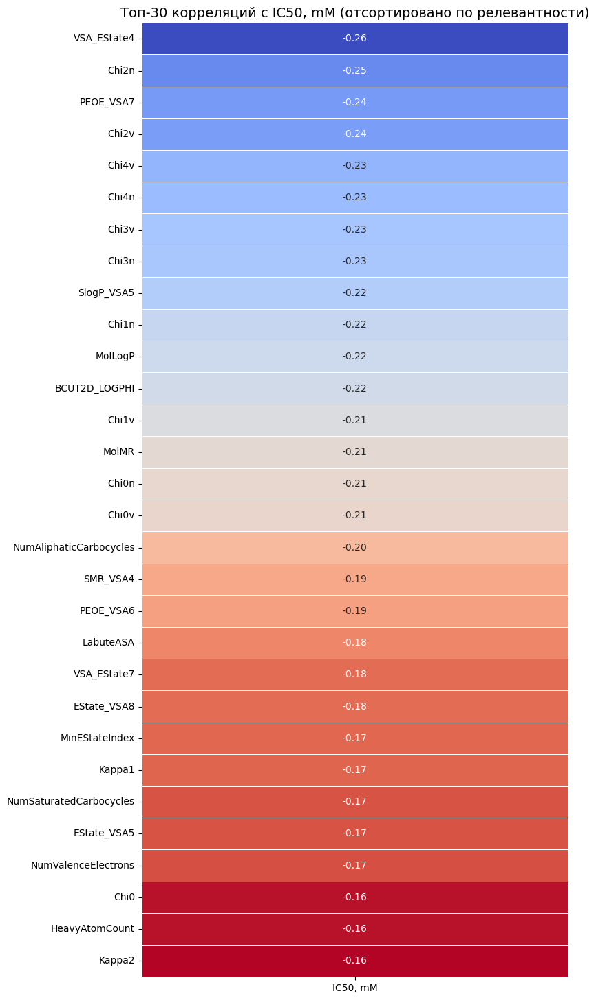

In [19]:
# Выполнение анализа для каждой целевой переменной
print(">>> Анализ корреляций для IC50, mM <<<")
analyze_target_correlation(data_imputed, 'IC50, mM', feature_cols, top_n=30, ascending_order=True) # Топ-30 для примера

Анализ корреляций для IC50, mM
Как мы видим, для топ-30 признаков, наиболее коррелирующих с IC50, mM, мы получили отрицательную корреляцию. Например, для VSA_EState4 коэффициент корреляции составляет -0.261448. Это говорит о следующем: Чем выше значение признака, тем ниже значение IC50, mM. Поскольку низкий IC50 является желаемым результатом (означает высокую эффективность препарата, его нужно меньшее количество), то же самое относится и к другим признакам в нашем списке.

Почему именно эти признаки могут коррелировать с IC50:

Топ-30 признаков, наиболее коррелирующих с IC50, mM:

VSA_EState4 (-0.261448): Один из дескрипторов EState-VSA, который суммирует площадь поверхности атомов, сгруппированных по определённым диапазонам электротопологического состояния. VSA_EState4 обычно связан с площадью поверхности атомов с умеренно высоким положительным зарядом. Высокое значение VSA_EState4 может указывать на наличие в молекуле достаточно больших участков с умеренным положительным зарядом. Такие участки могут быть важны для электростатических взаимодействий с отрицательно заряженными областями на поверхности целевого белка (например, вирусной мишени). Эффективное связывание с мишенью часто зависит от комплементарности заряда.

Chi2n (-0.246692): Молекулярный индекс связности (Molecular Connectivity Index), Chi2n — это индекс второго порядка, учитывающий неводородные атомы. Отражает степень разветвленности и топологической сложности молекулы. Почему влияет на эффективность: Более высокая разветвленность или определённая топологическая сложность (показанная Chi2n) может обеспечивать лучшую "подгонку" молекулы к активному центру белка-мишени, что приводит к более сильному связыванию и, следовательно, к более низкой IC50.

PEOE_VSA7 (-0.242342): Дескриптор PEOE-VSA, суммирующий площадь поверхности атомов, сгруппированных по диапазонам парциальных зарядов, полученных методом PEOE. PEOE_VSA7 обычно связан с площадью поверхности атомов с умеренно отрицательным зарядом. Подобно VSA_EState4, это указывает на важность электростатических взаимодействий. Наличие значительной площади с умеренным отрицательным зарядом может способствовать связыванию с положительно заряженными участками целевого белка.

Chi2v (-0.241645): Ещё один индекс связности второго порядка, но учитывающий валентности атомов. Аналогично Chi2n, может указывать на важность определённой степени разветвленности и сложности структуры для эффективного связывания. Включение валентности атомов делает его более чувствительным к типам атомов и их химическому окружению.

Chi4v (-0.234425): Индекс связности четвёртого порядка с учётом валентности атомов. Отражает более сложные пути в молекуле и её глобальную форму/разветвленность. Предполагает, что не только локальная, но и более глобальная топология и разветвленность молекулы (с учетом валентностей) играют роль в её способности эффективно связываться с мишенью.

Chi4n (-0.232114): Индекс связности четвёртого порядка для неводородных атомов. Аналогично Chi4v, подчёркивает значимость общей формы и разветвленности молекулы, но фокусируется только на тяжелых атомах.

Chi3v (-0.228624): Индекс связности третьего порядка с учётом валентности атомов. Описывает топологию молекулы на промежуточном уровне. Более высокое значение может способствовать лучшей комплементарности формы молекулы с активным центром.

Chi3n (-0.228277): Индекс связности третьего порядка для неводородных атомов. Описывает топологию молекулы на промежуточном уровне. Более высокое значение может способствовать лучшей комплементарности формы молекулы с активным центром.

SlogP_VSA5 (-0.224957): Дескриптор SlogP-VSA, суммирующий площадь поверхности атомов, сгруппированных по диапазонам фрагментарного логарифма коэффициента распределения P (SlogP). SlogP_VSA5 обычно связан с площадью поверхности атомов, имеющих умеренно высокую липофильность. Наличие значительных липофильных участков на поверхности молекулы способствует гидрофобным взаимодействиям с соответствующими гидрофобными карманами в активном центре белка-мишени. Гидрофобные взаимодействия часто являются основным движущим фактором для связывания лекарств.

Chi1n (-0.218981): Индекс связности первого порядка для неводородных атомов. Отражает степень разветвленности основной цепи. Более низкое значение (меньше разветвленности) или определённая степень разветвленности может быть оптимальной для достижения активного центра или его конфигурации.

MolLogP (-0.216512): Логарифм коэффициента распределения октанол-вода. Это один из наиболее фундаментальных показателей липофильности (жирорастворимости) молекулы. Это крайне важный дескриптор. Умеренно высокая липофильность (т.е. более высокое значение MolLogP) необходима для: проникновения через липидные мембраны клеток; гидрофобных взаимодействий с белками-мишенями. Баланс важен: слишком высокая липофильность может привести к плохой растворимости в воде, связыванию с неспецифическими белками и накоплению в жировых тканях.

BCUT2D_LOGPHI (-0.215444): Один из дескрипторов BCUT2D, взвешенный по логарифму коэффициента распределения P (липофильность). BCUT2D_LOGPHI обычно указывает на максимальный или высокий логарифм липофильности в молекуле. Подтверждает важность липофильных участков. Соединение должно быть достаточно липофильным, чтобы проходить через клеточные мембраны и достигать мишени, а также для гидрофобных взаимодействий с мишенью.

Chi1v (-0.212030): Индекс связности первого порядка с учётом валентности атомов. Аналогично Chi1n, но с химическим уточнением.

MolMR (-0.207846): Молярная рефракция. Это аддитивное свойство, которое зависит от объёма молекулы и её поляризуемости (способности электронной оболочки деформироваться под действием электрического поля). Высокая молярная рефракция (связанная с большим объемом и/или высокой поляризуемостью) может указывать на способность молекулы к эффективному заполнению объёма связывающей полости, а также на возможность образования сильных дисперсионных (Ван-дер-Ваальсовых) взаимодействий.

Chi0n (-0.206856): Индекс связности нулевого порядка для неводородных атомов. По сути, это просто количество неводородных атомов. Простое увеличение количества тяжелых атомов (а значит, и размера молекулы) может приводить к увеличению числа возможных контактов с мишенью, если размер связывающей полости это позволяет.

Chi0v (-0.206138): Индекс связности нулевого порядка с учётом валентности атомов. По сути, та же идея, что и Chi0n, но с учетом химической природы атомов.

NumAliphaticCarbocycles (-0.195072): Количество алифатических карбоциклов (неароматических колец, состоящих только из атомов углерода) в молекуле. Наличие алифатических колец может: придавать молекуле определённую жёсткость и фиксированную конформацию, что важно для связывания с активным центром; увеличивать гидрофобность молекулы; заполнять специфические полости в мишени.

SMR_VSA4 (-0.189441): Дескриптор SMR-VSA, суммирующий площадь поверхности атомов, сгруппированных по диапазонам молярной рефракции. SMR_VSA4 связан с площадью поверхности атомов, имеющих умеренно высокую молярную рефракцию. Аналогично MolMR, указывает на то, что определённый объём и поляризуемость фрагментов молекулы способствуют эффективному связыванию.

PEOE_VSA6 (-0.187563): Дескриптор PEOE-VSA, связанный с площадью поверхности атомов с небольшим положительным зарядом. Указывает на важность небольших положительно заряженных участков для взаимодействия.

LabuteASA (-0.181037): Приблизительная площадь поверхности молекулы по Лабюту. Большая площадь поверхности (но не слишком большая) может означать больше возможностей для контакта с мишенью. Оптимальная площадь поверхности важна для правильного взаимодействия с растворителем и мишенью.

VSA_EState7 (-0.175702): Ещё один дескриптор EState-VSA, связанный с площадью поверхности атомов с отрицательным зарядом. Подтверждает важность электростатических взаимодействий, где отрицательно заряженные участки молекулы взаимодействуют с положительно заряженными областями мишени.

EState_VSA8 (-0.175592): Дескриптор EState-VSA, связанный с площадью поверхности атомов с небольшим отрицательным зарядом. Ещё раз подтверждает важность распределения зарядов по поверхности молекулы.

MinEStateIndex (-0.174254): Минимальное значение электротопологического состояния атома в молекуле. Это обычно соответствует атомам с самым высоким отрицательным зарядом или высокой электронной плотностью. Наличие атома с очень низкой (сильно отрицательной) электротопологической энергией может создавать локальный центр высокой электронной плотности, который важен для специфических взаимодействий, например, с электрофильными центрами на мишени.

Kappa1 (-0.173921): Индекс формы Каппа 1. Отражает степень разветвленности и "линейности" молекулы. Указывает, что определённый баланс между линейностью и разветвленностью (или предпочтение более линейной формы) может быть выгоден для связывания.

NumSaturatedCarbocycles (-0.170895): Количество насыщенных карбоциклов (циклические углеводородные кольца без двойных связей). Насыщенные кольца могут придавать молекуле гибкость и определённую конформационную подвижность, а также увеличивать липофильность. Это может быть важно для "подгонки" в активный центр.

EState_VSA5 (-0.170753): Дескриптор EState-VSA, связанный с площадью поверхности атомов с умеренно положительным зарядом. Повторно указывает на важность электростатических взаимодействий через положительно заряженные участки.

NumValenceElectrons (-0.170145): Общее количество валентных электронов в молекуле. Большее количество валентных электронов обычно коррелирует с большим размером молекулы и большей сложностью, что может обеспечивать большее количество контактов и более сильное связывание. Также может быть связано с возможностью образования различных типов связей.

Chi0 (-0.161927): Индекс связности нулевого порядка. По сути, это просто количество неводородных атомов. Простое увеличение количества тяжелых атомов (а значит, и размера молекулы) может приводить к увеличению числа возможных контактов с мишенью, если размер связывающей полости это позволяет.

HeavyAtomCount (-0.161749): Количество тяжелых атомов в молекуле (все атомы, кроме водорода). Очень сильно коррелирует с размером молекулы. Как и Chi0, указывает на то, что общий размер и масса молекулы важны для ее взаимодействия с биологической мишенью.

Kappa2 (-0.160408): Индекс формы Каппа 2. Отражает степень разветвленности по отношению к размеру молекулы. Как и другие индексы Каппа, указывает на важность определённой "формы" или компактности молекулы для эффективного связывания.

Исходя из этого можно сделать следующие общие выводы, которые потенциально влияют на эффективность препарата:

Распределение зарядов и электростатические взаимодействия: Наличие как положительных, так и отрицательных зарядов, а также определённых диапазонов электротопологического состояния по поверхности молекулы (VSA_EState, PEOE_VSA, EState_VSA) является ключевым для специфических электростатических взаимодействий с комплементарными областями на целевой мишени.
Липофильность и гидрофобные взаимодействия: Дескрипторы, связанные с липофильностью (MolLogP, BCUT2D_LOGPHI, SlogP_VSA), подтверждают её критическую важность. Это необходимо как для проникновения в клетки и достижения мишени, так и для образования прочных гидрофобных связей с активным центром белка-мишени.
Размер, форма и сложность молекулы: Дескрипторы связности (Chi-индексы), индексы формы (Kappa-индексы), а также количество тяжелых атомов и валентных электронов — все указывают на то, что определённый размер, объём, степень разветвленности, топологическая сложность и общая форма молекулы являются ключевыми для её способности "подходить" к активному центру мишени и эффективно заполнять его.
Особенности циклической структуры: Наличие алифатических и насыщенных карбоциклов указывает на то, что определённые типы колец в структуре могут способствовать активности, влияя на жёсткость, форму и гидрофобность молекулы.
Поляризуемость и объем: Молярная рефракция (MolMR, SMR_VSA) указывает на важность объема и поляризуемости молекулы, что влияет на дисперсионные взаимодействия.
Площадь поверхности: Общая площадь поверхности молекулы (LabuteASA) также является важным фактором для эффективного контакта с мишенью.


>>> Анализ корреляций для CC50, mM <<<

--- Топ-30 признаков, наиболее коррелирующих с CC50, mM ---
                          CC50, mM
FpDensityMorgan1          0.289945
FpDensityMorgan2          0.250503
HallKierAlpha             0.219990
BCUT2D_CHGLO              0.196448
BalabanJ                  0.188974
fr_Ar_NH                  0.159269
fr_Nhpyrrole              0.159269
MinPartialCharge          0.155711
FractionCSP3              0.155284
BCUT2D_LOGPLOW            0.149669
fr_Imine                  0.141890
FpDensityMorgan3          0.132472
SPS                       0.120461
qed                       0.112462
fr_nitro                  0.108720
BCUT2D_MWLOW              0.106030
VSA_EState5               0.085797
fr_urea                   0.085115
fr_Ndealkylation1         0.083319
MinAbsEStateIndex         0.077155
fr_quatN                  0.074990
fr_C_S                    0.069141
fr_furan                  0.063875
fr_priamide               0.063407
fr_Ar_N                 

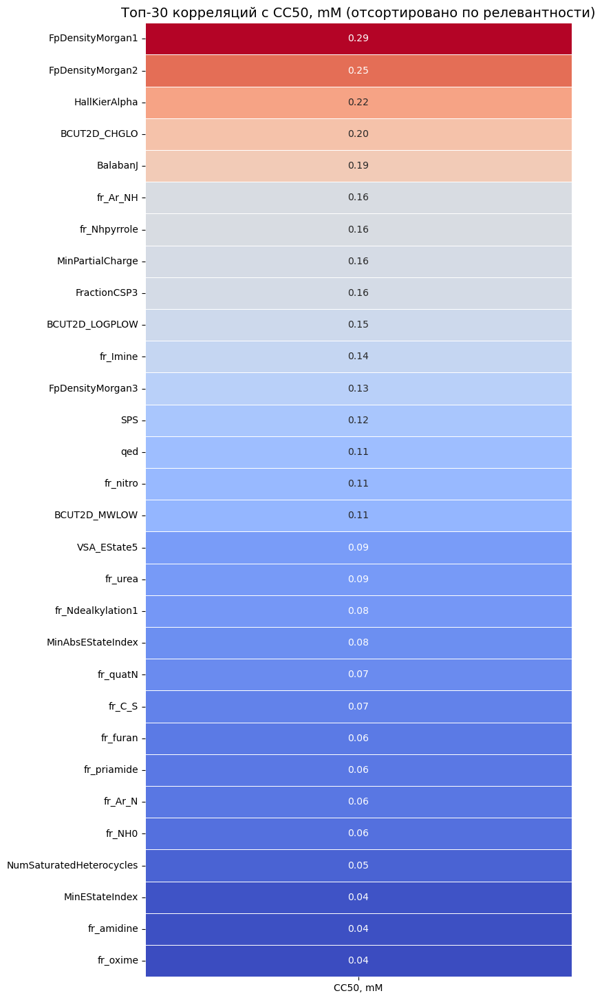

In [21]:
print("\n>>> Анализ корреляций для CC50, mM <<<")
analyze_target_correlation(data_imputed, 'CC50, mM', feature_cols, top_n=30, ascending_order=False)

Анализ корреляций для CC50, mM
CC50, mM (Cytotoxic Concentration 50%): Это полумаксимальная цитотоксическая концентрация. Она показывает концентрацию соединения, при которой наблюдается 50% цитотоксический эффект (повреждение или гибель) на клеточной культуре. Для лекарственного препарата, чем выше значение CC50, тем менее токсично соединение для клеток. То есть, требуется большая концентрация, чтобы вызвать вред. Поэтому, положительное значение корреляции означает, что чем выше значение признака, тем выше CC50, а это означает меньшую токсичность (желаемый результат).

Топ-30 признаков, наиболее коррелирующих с CC50, mM:

FpDensityMorgan1 (0.289945): Плотность отпечатка Морган (Morgan Fingerprint) с радиусом 1. Morgan Fingerprints (также известные как Circular Fingerprints) — это тип молекулярных отпечатков, которые кодируют структурные фрагменты молекулы в виде бинарного вектора или, в данном случае, численной "плотности" этих фрагментов. Радиус 1 означает, что учитываются небольшие фрагменты, атомы и их непосредственное окружение. Более высокая "плотность" небольших, распространенных структурных фрагментов (которая может быть связана с меньшей структурной уникальностью или экзотичностью) может указывать на то, что молекула содержит больше "общих" структур, которые хорошо переносятся клетками или менее склонны к неспецифическому взаимодействию с клеточными компонентами, вызывая цитотоксичность.

FpDensityMorgan2 (0.250503): Плотность отпечатка Морган с радиусом 2. Учитывает немного более крупные фрагменты (атомы и их соседи до 2 связей). Аналогично FpDensityMorgan1, но на чуть более крупном уровне структурной сложности. Указывает на то, что распространенность определенных, нетоксичных фрагментов способствует снижению цитотоксичности.

HallKierAlpha (0.219990): Индекс формы Холла-Кира (Hall Kier Alpha Index). Это топологический индекс, который отражает размер и степень разветвленности молекулы. Определенная "форма" или степень разветвленности (возможно, более компактная или менее "липкая" форма) может способствовать снижению неспецифических взаимодействий с клеточными структурами, тем самым уменьшая цитотоксичность.

BCUT2D_CHGLO (0.196448): Один из дескрипторов BCUT2D, взвешенный по заряду атомов. BCUT2D_CHGLO обычно отражает минимальный или низкий заряд (наиболее отрицательный заряд) в молекуле. Может указывать на то, что наличие сильно отрицательно заряженных участков в молекуле (или их отсутствие) коррелирует с более высокой CC50. Например, чрезмерно реактивные или сильно заряженные группы могут быть источником токсичности. Если самые отрицательные заряды не слишком экстремальны, это может быть хорошо.

BalabanJ (0.188974): Индекс Балабана J (Balaban J Index). Это топологический индекс, основанный на расстояниях между атомами в молекуле, который хорошо отражает степень разветвленности и цикличности молекулы, а также её "компактность". Более высокие значения BalabanJ часто соответствуют менее разветвленным, более компактным молекулам. Менее разветвленные, более компактные молекулы могут быть менее склонны к образованию агрегатов или неспецифическому связыванию, что снижает их цитотоксичность.

fr_Ar_NH (0.159269): Счетчик фрагментов: Количество ароматических вторичных аминов (групп -NH-, связанных с ароматическим кольцом). Наличие таких групп может влиять на растворимость, метаболизм и связывание с белками, что может уменьшать нежелательные клеточные эффекты.

fr_Nhpyrrole (0.159269): Счетчик фрагментов: Количество N-H групп в пиррольных кольцах (например, в пирроле, индоле). Пиррольные N-H группы часто являются донорами водородных связей и могут быть частью биологически активных молекул. Их наличие (или отсутствие) может влиять на метаболизм и клиренс, что в свою очередь влияет на токсичность. Если эти группы делают молекулу более "узнаваемой" для систем детоксикации или менее склонной к образованию реактивных метаболитов, это может повышать CC50.

MinPartialCharge (0.155711): Минимальный парциальный заряд атома в молекуле (т.е. самый отрицательный заряд). Схоже с BCUT2D_CHGLO. Если самый отрицательный заряд атома не является слишком экстремальным или находится в определенном диапазоне, это может снижать вероятность неспецифических электростатических взаимодействий, которые приводят к клеточному повреждению.

FractionCSP3 (0.155284): Доля sp3-гибридизованных углеродных атомов в молекуле. Высокое значение указывает на более "насыщенную" структуру, меньше двойных/тройных связей и ароматических систем. Молекулы с высокой долей FractionCSP3 часто более гибкие, имеют лучшую растворимость в воде и могут быть менее реактивными, чем сильно ароматические или ненасыщенные соединения. Это может приводить к снижению токсичности. Это также важный признак "подобия лекарству".

BCUT2D_LOGPLOW (0.149669): Один из дескрипторов BCUT2D, взвешенный по логарифму коэффициента распределения P (липофильность). BCUT2D_LOGPLOW обычно отражает минимальный или низкий логарифм липофильности в молекуле. Если молекула имеет слишком липофильные участки, она может слишком сильно взаимодействовать с клеточными мембранами, нарушая их функции или накапливаясь в них, вызывая токсичность. Более низкая липофильность в определенных областях (или ее отсутствие) может снижать этот риск.

fr_Imine (0.141890): Счетчик фрагментов: Количество иминных групп (C=N). Имины могут быть реактивными функциональными группами. Их наличие (или, в данном случае, возможно, определенное их количество или контекст) может влиять на стабильность, метаболизм или взаимодействие с биологическими мишенями. Если их присутствие связано с повышенной CC50, это может означать, что в данном контексте они не являются источником сильной токсичности.

FpDensityMorgan3 (0.132472): Плотность отпечатка Морган с радиусом 3. Учитывает более крупные структурные фрагменты. Подтверждает тенденцию: определенная плотность, не уникальность, или распространенность более крупных, хорошо переносимых структурных блоков может коррелировать с низкой цитотоксичностью.

SPS (0.120461): Оценка синтетической доступности (Synthetic Accessibility Score). Измеряет, насколько легко или сложно синтезировать данное соединение. Более низкий SPS означает легче синтезировать. Положительная корреляция с CC50 означает, что более легко синтезируемые соединения имеют тенденцию быть менее токсичными. Это может быть связано с тем, что очень сложные для синтеза молекулы часто содержат экзотические или реактивные функциональные группы, которые могут быть источником токсичности. Также, простота синтеза является желаемым свойством для потенциального лекарства.

qed (0.112462): Количественная оценка "подобия лекарству" (Quantitative Estimation of Drug-likeness). Это показатель, который оценивает, насколько молекула соответствует свойствам известных лекарственных препаратов (таких как размер, липофильность, гибкость, наличие определенных функциональных групп). Чем выше QED, тем больше вероятность, что соединение является хорошим кандидатом на лекарство. Это очень логично. Молекулы, которые больше похожи на уже существующие лекарства, статистически с большей вероятностью будут иметь хороший профиль безопасности.

fr_nitro (0.108720): Счетчик фрагментов: Количество нитро-групп (-NO2). Нитро-группы могут быть источником токсичности или метаболической активации. Положительная корреляция может означать, что в данной выборке эти группы не являются сильным источником токсичности, или их наличие в определенных контекстах даже способствует безопасности. Это может зависеть от конкретных структур.

BCUT2D_MWLOW (0.106030): Один из дескрипторов BCUT2D, взвешенный по молекулярному весу. BCUT2D_MWLOW обычно отражает минимальный или низкий молекулярный вес в молекуле (или в ее фрагментах). Возможно, указывает на то, что наличие более мелких, легких фрагментов или отсутствие слишком тяжелых, объемных частей коррелирует с меньшей токсичностью. Очень большие молекулы могут вызывать проблемы с агрегацией или неспецифическим связыванием.

VSA_EState5 (0.085797): Дескриптор EState-VSA, связанный с площадью поверхности атомов с умеренно высоким отрицательным зарядом. Подобно BCUT2D_CHGLO и MinPartialCharge, указывает на то, что определенные диапазоны отрицательных зарядов (возможно, не слишком экстремальные) способствуют снижению токсичности, возможно, путем уменьшения неспецифических электростатических взаимодействий.

fr_urea (0.085115): Счетчик фрагментов: Количество мочевинных групп (N-CO-N). Мочевинные группы являются распространенными и часто встречаются в фармацевтике. Их наличие может способствовать хорошей растворимости и метаболической стабильности или определенному типу взаимодействия, который не является токсичным.

fr_Ndealkylation1 (0.083319): Счетчик фрагментов: Группа, склонная к N-деацилированию (метаболическому процессу, когда алкильная группа отщепляется от атома азота). Если молекула содержит такую группу, которая легко метаболизируется, это может способствовать быстрому выведению соединения из организма, тем самым снижая его накопление и потенциальную токсичность.

MinAbsEStateIndex (0.077155): Минимальное абсолютное значение EState индекса атома. Это может указывать на атомы с очень маленьким (близким к нулю) или небольшим EState значением. Возможно, указывает на то, что отсутствие очень "реактивных" или "активных" атомов с экстремальными EState значениями коррелирует с меньшей цитотоксичностью.

fr_quatN (0.074990): Счетчик фрагментов: Количество четвертичных атомов азота (N, связанный с 4 другими атомами). Четвертичные азоты всегда заряжены, что сильно влияет на проницаемость через мембраны и распределение. Если их присутствие связано с более высокой CC50, это может указывать на то, что такие молекулы не накапливаются в клетках, что снижает их цитотоксичность.

fr_C_S (0.069141): Счетчик фрагментов: Количество тиокарбонильных групп (C=S). Тиокарбонильные группы могут быть более реактивными, чем обычные карбонилы. Положительная корреляция может означать, что их присутствие в определенных контекстах не является источником токсичности, или даже связано с метаболической стабильностью.

fr_furan (0.063875): Счетчик фрагментов: Количество фурановых колец (пятичленный гетероцикл с одним атомом кислорода). Фурановые кольца являются распространенными в природе и часто встречаются в лекарствах. Их наличие может способствовать хорошей биосовместимости и нетоксичности.

fr_priamide (0.063407): Счетчик фрагментов: Количество первичных амидных групп (-CONH2). Первичные амиды могут быть метаболически стабильными или, наоборот, легко метаболизируемыми. Их влияние на токсичность может быть связано с их ролью в метаболическом пути или их способностью к образованию водородных связей.

fr_Ar_N (0.061983): Счетчик фрагментов: Количество ароматических аминов/нитро-групп. Аналогично другим азотсодержащим фрагментам, их присутствие или отсутствие может влиять на стабильность, метаболизм и взаимодействия.

fr_NH0 (0.058178): Счетчик фрагментов: Количество первичных аминов (NH2). Первичные амины являются важными функциональными группами, которые могут быть подвержены метаболизму (например, окислительному дезаминированию). Их наличие может влиять на скорость выведения и, как следствие, на продолжительность воздействия и токсичность.

NumSaturatedHeterocycles (0.050122): Количество насыщенных гетероциклических колец (неароматические кольца, содержащие атомы, отличные от углерода, например, N, O, S). Насыщенные гетероциклы часто встречаются в лекарствах, они могут придавать молекуле гибкость, улучшать растворимость и быть метаболически стабильными, что может снижать токсичность.

MinEStateIndex (0.042044): Минимальное значение электротопологического состояния атома в молекуле. Это обычно соответствует атомам с самым высоким отрицательным зарядом или высокой электронной плотностью. Наличие атома с очень низкой (сильно отрицательной) электротопологической энергией может создавать локальный центр высокой электронной плотности, который важен для специфических взаимодействий, например, с электрофильными центрами на мишени.

fr_amidine (0.039555): Счетчик фрагментов: Количество амидиновых групп.

fr_oxime (0.037156): Счетчик фрагментов: Количество оксимных групп.

Общие выводы по корреляциям для CC50, mM:

Исходя из этого можно сделать следующие общие выводы, которые потенциально влияют на профиль безопасности препарата (чем выше CC50, тем лучше):

Молекулярная "общность" и плотность фрагментов: Молекулы, которые состоят из более "общих" или часто встречающихся фрагментов (FpDensityMorgan) имеют тенденцию быть менее токсичными. Это может быть связано с тем, что такие структуры лучше узнаются и обрабатываются биологическими системами, или они менее склонны к неспецифическим, разрушительным взаимодействиям.
Форма и размер: Индексы формы (HallKierAlpha, BalabanJ) и дескрипторы, связанные с минимальным молекулярным весом (BCUT2D_MWLOW), предполагают, что более компактные, менее разветвленные или просто не слишком тяжелые молекулы имеют лучший профиль безопасности.
Умеренность зарядов и липофильности: Дескрипторы, связанные с зарядами (BCUT2D_CHGLO, MinPartialCharge, VSA_EState) и минимальной липофильностью (BCUT2D_LOGPLOW), указывают на то, что слишком экстремальные значения зарядов или слишком высокая липофильность в определенных областях молекулы могут быть связаны с токсичностью. Умеренность или отсутствие таких экстремумов, вероятно, способствует безопасности.
Лекарствоподобность и синтетическая доступность: Показатели QED и SPS положительно коррелируют с CC50, что подтверждает: молекулы, которые соответствуют "правилам лекарства" и легко производятся, как правило, более безопасны. Это очень ценное наблюдение для ранних стадий разработки.
Гибкость и насыщенность: Высокая доля sp3-гибридизованных углеродов (FractionCSP3) и наличие насыщенных гетероциклов (NumSaturatedHeterocycles) указывают на то, что более насыщенные и гибкие молекулы могут быть менее токсичными, возможно, из-за лучшей растворимости и меньшей реактивности.
Присутствие или отсутствие определенных функциональных групп: Различные фрагментные дескрипторы (fr_...) играют роль, влияя на метаболизм, распределение и специфические/нетоксические взаимодействия. Например, наличие групп, способствующих метаболическому клиренсу (fr_Ndealkylation1) или же отсутствие чрезмерно реактивных фрагментов.

Фактически, анализируя признаки, мы уже видим некоторые потенциальные "противоречия" или, точнее, необходимость поиска компромисса между свойствами, способствующими высокой эффективности (низкий IC50) и высокой безопасностью (высокий CC50).

1. Разветвленность / Сложность / Объем:
Для эффективности (IC50): Чем более разветвленная и сложная структура (высокие Chi-индексы, MolMR, LabuteASA), тем ниже IC50 (т.е. лучше эффективность). Это логично, поскольку более сложная молекула может обеспечивать больше точек контакта и лучшую комплементарность с активным центром мишени.

Для безопасности (CC50): С другой стороны, для повышения CC50 (т.е. меньшей токсичности) наблюдается положительная корреляция с дескрипторами плотности фрагментов (FpDensityMorgan1, FpDensityMorgan2, FpDensityMorgan3) и индексами компактности (BalabanJ, HallKierAlpha). Это указывает на то, что более "общие", менее уникальные и, возможно, более компактные структуры имеют тенденцию к более высокой CC50. Очень разветвленные и объемные молекулы могут легче неспецифически связываться с клеточными компонентами или вызывать агрегацию, что приводит к цитотоксичности.

Вывод: Здесь придется искать компромисс. Молекулы, оптимизированные для высокой специфичности и плотного связывания (что часто требует определенной сложности и объема), рискуют стать более цитотоксичными из-за неспецифических взаимодействий. Оптимальное решение, вероятно, лежит в умеренной сложности и размере.

2. Липофильность:
Для эффективности (IC50): Умеренно высокая липофильность (MolLogP, BCUT2D_LOGPHI, SlogP_VSA5) коррелирует с более низкой IC50. Это важно для проникновения через мембраны и гидрофобных взаимодействий с мишенью.

Для безопасности (CC50): BCUT2D_LOGPLOW (связанный с низкой липофильностью, т.е. более полярными участками) положительно коррелирует с CC50. Это указывает на то, что чрезмерная липофильность (или наличие слишком липофильных участков) может быть вредной, так как очень жирорастворимые молекулы могут нарушать функции клеточных мембран, накапливаться в липидных структурах и вызывать неспецифическую токсичность.

Вывод: Идеальное лекарство должно иметь оптимальную липофильность – достаточно высокую для эффективного проникновения и связывания с мишенью, но не настолько высокую, чтобы стать слишком токсичным или вызвать нежелательное накопление в тканях.

3. Гибкость / Насыщенность (sp3 гибридизация):
Для эффективности (IC50): NumRotatableBonds (количество вращающихся связей) отрицательно коррелирует с IC50. Это означает, что увеличение гибкости может улучшать эффективность, что связано с тем, что гибкая молекула лучше "подстраивается" под форму активного центра мишени (индуцированное соответствие).

Для безопасности (CC50): FractionCSP3 (доля sp3-гибридизованных углеродов) и NumSaturatedHeterocycles (количество насыщенных гетероциклов) положительно коррелируют с CC50. Высокая доля sp3-углеродов часто означает более насыщенную, гибкую и менее ароматическую структуру, что ассоциируется с лучшей растворимостью в воде и меньшей реактивностью/токсичностью.

Вывод: Это не столько противоречие, сколько дополнение. Для эффективности важна рабочая гибкость для подстройки к мишени. Для безопасности важна общая гибкость и насыщенность структуры, которые уменьшают реактивность и улучшают свойства, связанные с метаболизмом, выведением и распределением. Оптимальный баланс гибкости, вероятно, заключается в наличии достаточного количества вращающихся связей для связывания, но при этом сохранении общей насыщенности структуры, чтобы не быть слишком реактивной или неспецифической.

4. Распределение зарядов:
Для эффективности (IC50): Различные EState_VSA и PEOE_VSA дескрипторы, связанные с наличием как положительных, так и отрицательных зарядов на поверхности молекулы (VSA_EState4, PEOE_VSA7, VSA_EState7, EState_VSA8, EState_VSA5), способствуют снижению IC50. Это указывает на важность электростатических взаимодействий для специфического связывания с мишенью.

Для безопасности (CC50): BCUT2D_CHGLO и MinPartialCharge (связанные с минимальным, т.е. самым отрицательным зарядом) положительно коррелируют с CC50. VSA_EState5 (умеренно высокий отрицательный заряд) также положительно коррелирует с CC50. Это может означать, что слишком сильные, экстремальные или реактивные заряды (или их неравномерное распределение) могут быть источником цитотоксичности. Умеренность зарядов, вероятно, способствует безопасности.

Вывод: Нужен компромисс. Молекуле нужны заряды для специфического и сильного связывания с мишенью, но эти заряды не должны быть настолько экстремальными или расположены таким образом, чтобы вызывать неспецифические, вредные электростатические взаимодействия с клеточными компонентами, приводящие к токсичности.


>>> Анализ корреляций для SI <<<

--- Топ-30 признаков, наиболее коррелирующих с SI ---
                           SI
fr_NH2               0.170320
BalabanJ             0.170234
fr_Al_COO            0.104141
fr_COO2              0.102756
fr_COO               0.102756
VSA_EState4          0.090937
FpDensityMorgan1     0.087922
NHOHCount            0.079801
EState_VSA2          0.071251
SMR_VSA5             0.066329
FractionCSP3         0.066066
fr_NH1               0.065934
fr_C_O               0.062899
SlogP_VSA3           0.058704
MinAbsPartialCharge  0.053336
Kappa3               0.052780
FpDensityMorgan2     0.050830
fr_amide             0.050638
NumHDonors           0.050095
NumRotatableBonds    0.048797
fr_ester             0.047620
MaxAbsPartialCharge  0.047393
HallKierAlpha        0.046882
MaxPartialCharge     0.043490
fr_C_O_noCOO         0.043194
qed                  0.041348
EState_VSA9          0.038492
SlogP_VSA1           0.037845
TPSA                 0.035033
PEOE_VSA1  

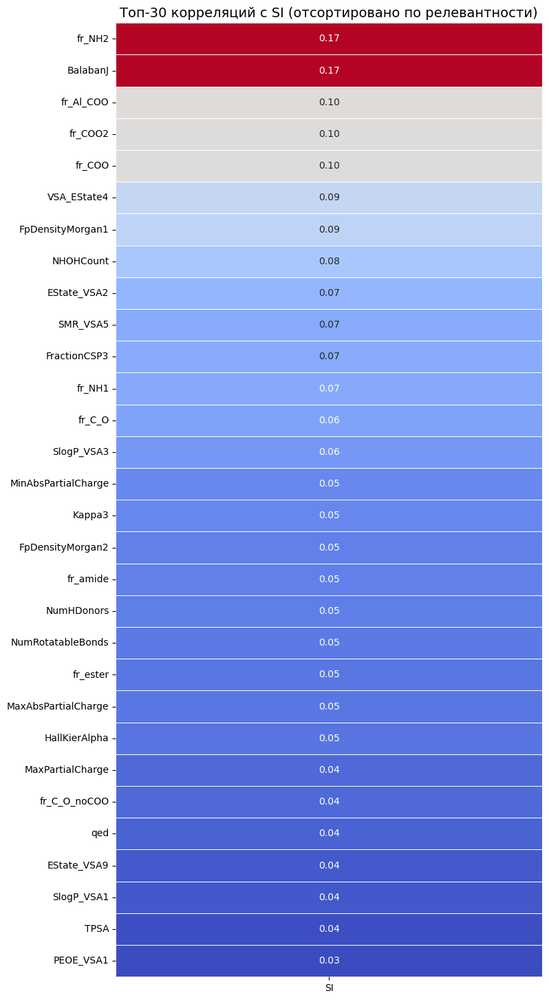

In [24]:
print("\n>>> Анализ корреляций для SI <<<")
analyze_target_correlation(data_imputed, 'SI', feature_cols, top_n=30, ascending_order=False)

Анализ корреляций для SI
SI (Selectivity Index): Это отношение CC50 к IC50 (CC50 / IC50). Для лекарственного препарата, чем выше значение SI, тем лучше селективность и тем более перспективно соединение. Высокий SI означает, что для подавления вируса требуется гораздо меньшая концентрация, чем для нанесения вреда клеткам. Для SI мы ищем положительные корреляции. Положительное значение корреляции означает, что чем выше значение признака, тем выше SI, что является желаемым результатом. Стоит отметить что корелиции в своем роде вышли очень низкие, что говорит, о том, что в данных не прослеживаеться прямая линейная связь между признаками и индексом селективности.

Топ-30 признаков, наиболее коррелирующих с SI (Положительная корреляция: чем выше признак, тем выше SI, т.е. лучше селективность):

fr_NH2 (0.170320): Счетчик фрагментов: Количество первичных аминогрупп (-NH2). Первичные амины являются важными функциональными группами, способными к донорству водородных связей и участию в метаболических процессах. Их наличие может влиять на распределение молекулы, ее метаболизм и специфическое связывание. Возможно, определенное количество или расположение первичных аминов способствует улучшению баланса между проникновением, связыванием с мишенью и избеганием нецелевых взаимодействий.

BalabanJ (0.170234): Индекс Балабана J. Топологический индекс, отражающий разветвленность, цикличность и "компактность" молекулы. Более высокие значения часто указывают на менее разветвленные, более компактные молекулы. Более компактные и менее разветвленные молекулы могут иметь лучшую селективность, так как они могут быть менее склонны к неспецифическому связыванию с различными белками в клетке (что могло бы увеличить токсичность). Это соответствует идее, что умеренный размер и форма могут быть оптимальными для баланса активности и безопасности.

fr_Al_COO (0.104141): Счетчик фрагментов: Количество алифатических карбоксилатов (R-COO- где R - алифатическая группа). Карбоксилатные группы являются анионными (отрицательно заряженными) и могут участвовать в ионных и водородных связях. Их наличие может влиять на гидрофильность, взаимодействие с ионными каналами или специфическое связывание с положительно заряженными областями мишеней/ферментов, влияя на их распределение и метаболизм.

fr_COO2 (0.102756): Счетчик фрагментов: Вероятно, количество карбоксилатных групп, связанных с двумя атомами (две связи от -COO-). Аналогично fr_Al_COO, указывает на важность карбоксилатных групп.

fr_COO (0.102756): Счетчик фрагментов: Общее количество карбоксилатных групп (-COO-). Подтверждает значимость карбоксилатных групп для достижения высокой селективности.

VSA_EState4 (0.090937): Сумма площади поверхности атомов с умеренно высоким положительным зарядом. Этот признак ранее имел отрицательную корреляцию с IC50 (лучше для эффективности). Теперь он имеет положительную корреляцию с SI. Это указывает, что наличие таких положительно заряженных участков способствует как эффективности, так и благоприятному соотношению CC50/IC50. Это может быть связано с тем, что эти участки обеспечивают специфическое связывание с мишенью, которое не является столь же токсичным для клеточных компонентов.

FpDensityMorgan1 (0.087922): Плотность отпечатка Морган с радиусом 1 (плотность небольших структурных фрагментов). Если молекула содержит больше "общих", часто встречающихся фрагментов (как мы обсуждали для CC50), это может способствовать снижению токсичности, что, в свою очередь, увеличивает SI. Также, это может указывать на то, что для достижения селективности не всегда нужны крайне уникальные или сложные фрагменты.

NHOHCount (0.079801): Количество атомов азота и кислорода, которые могут быть донорами водородных связей (т.е., имеют водород, связанный с ними). Доноры водородных связей критически важны для формирования специфических и сильных взаимодействий с белками-мишенями. Оптимальное количество таких групп может способствовать сильному связыванию с мишенью без избыточного неспецифического связывания, что приводит к лучшей селективности.

EState_VSA2 (0.071251): Дескриптор EState-VSA, связанный с площадью поверхности атомов с низким положительным зарядом. Указывает на то, что наличие участков с небольшим положительным зарядом способствует хорошей селективности.

SMR_VSA5 (0.066329): Сумма площади поверхности атомов с высокой молярной рефракцией (объемом и поляризуемостью). Этот признак также был отрицательно коррелирован с IC50. Его положительная корреляция с SI означает, что наличие объемных и/или сильно поляризуемых фрагментов помогает не только связываться с мишенью, но и делать это селективно.

FractionCSP3 (0.066066): Доля sp3-гибридизованных углеродных атомов. Этот признак ранее сильно коррелировал с безопасностью (положительная корреляция с CC50). Его положительная корреляция с SI указывает, что более насыщенные и гибкие молекулы имеют тенденцию быть более селективными. Это согласуется с идеей, что такая структура может снижать неспецифические взаимодействия, ведущие к токсичности, при этом сохраняя способность к специфическому связыванию.

fr_NH1 (0.065934): Счетчик фрагментов: Количество вторичных аминогрупп (-NH-). Аналогично fr_NH2, вторичные амины важны для водородных связей и метаболизма. Их наличие может быть важным для тонкой настройки баланса между активностью и токсичностью.

fr_C_O (0.062899): Количество спиртовых (C-OH) или простых эфирных (C-O-C) групп (но не карбоксильных или карбонильных). Эти группы могут быть донорами/акцепторами водородных связей, влияя на растворимость и взаимодействие с белками.

SlogP_VSA3 (0.058704): Дескриптор SlogP-VSA, связанный с площадью поверхности атомов с низкой/умеренной липофильностью. Если участки с более низкой липофильностью способствуют селективности, это может быть связано с уменьшением неспецифических гидрофобных взаимодействий, которые могут способствовать токсичности.

MinAbsPartialCharge (0.053336): Минимальное абсолютное значение парциального заряда атома. Указывает на атомы с зарядом, близким к нулю. Может означать, что наличие нейтральных или слабо заряженных участков, которые не участвуют в сильных электростатических взаимодействиях, способствует селективности.

Kappa3 (0.052780): Индекс формы Каппа 3. Отражает степень разветвленности и форму молекулы. Как и другие индексы Каппа, указывает на то, что определённая "форма" или "компактность" молекулы важна для достижения селективности.

FpDensityMorgan2 (0.050830): Плотность отпечатка Морган с радиусом 2. Аналогично FpDensityMorgan1, подтверждает, что более распространенные, неэкзотические структурные фрагменты могут способствовать общему профилю безопасности/селективности.

fr_amide (0.050638): Счетчик фрагментов: Количество амидных групп (-CONH-). Амидные группы широко распространены в лекарствах и белках, они могут участвовать в водородных связях и стабилизировать конформации. Их присутствие может быть связано с улучшенной селективностью.

NumHDonors (0.050095): Количество доноров водородных связей. Доноры водородных связей формируют специфические и направленные взаимодействия с мишенью. Оптимальное количество доноров может способствовать сильному и специфическому связыванию с активным центром мишени, уменьшая неспецифические взаимодействия с другими белками или мембранами.

NumRotatableBonds (0.048797): Количество вращающихся связей. Этот признак имел отрицательную корреляцию с IC50 (больше гибкости = лучше эффективность). Теперь он имеет положительную корреляцию с SI. Это указывает на то, что определённая степень гибкости необходима не только для связывания, но и для достижения селективности. Гибкость позволяет молекуле адаптироваться к специфической связывающей полости мишени, что может быть ключом к избирательности.

fr_ester (0.047620): Счетчик фрагментов: Количество эфирных групп (-COO-R). Эфирные группы могут влиять на метаболическую стабильность и липофильность.

MaxAbsPartialCharge (0.047393): Максимальное абсолютное значение парциального заряда атома в молекуле. Указывает на наиболее заряженный атом (положительный или отрицательный). Умеренное значение MaxAbsPartialCharge может быть оптимальным. Слишком сильные заряды могут быть источником неспецифических взаимодействий, тогда как определённый уровень заряда важен для специфического связывания.

HallKierAlpha (0.046882): Индекс формы Холла-Кира. Ранее коррелировал с безопасностью. Его положительная корреляция с SI подтверждает, что определённая "форма" или степень разветвленности (возможно, более компактная) способствует общему балансу эффективности и безопасности.

MaxPartialCharge (0.043490): Максимальный парциальный заряд атома в молекуле (т.е. самый положительный заряд). Аналогично MaxAbsPartialCharge, указывает на важность оптимального распределения положительных зарядов.

fr_C_O_noCOO (0.043194): Счетчик фрагментов: Количество карбонильных групп (C=O), не входящих в карбоксильные или эфирные группы. Карбонильные группы являются акцепторами водородных связей и поляризуемы. Их присутствие может быть важным для взаимодействия с мишенью.

qed (0.041348): Количественная оценка "подобия лекарству". Это очень логично. Молекулы, которые больше похожи на известные лекарства, статистически с большей вероятностью имеют хороший баланс свойств, включая селективность.

EState_VSA9 (0.038492): Дескриптор EState-VSA, связанный с площадью поверхности атомов с умеренно высоким отрицательным зарядом. Ещё одно подтверждение важности электростатического распределения зарядов.

SlogP_VSA1 (0.037845): Дескриптор SlogP-VSA, связанный с площадью поверхности атомов с очень низкой липофильностью (гидрофильные участки). Наличие гидрофильных участков может улучшать растворимость в воде и снижать неспецифическое связывание с гидрофобными областями, что может способствовать селективности.

TPSA (Topological Polar Surface Area) (0.035033): Топологическая полярная поверхность. Сумма полярных атомов (кислород, азот, сера) и присоединённых к ним атомов водорода. Это важный показатель для проникновения через мембраны и связывания с белками. TPSA влияет на способность молекулы проходить через мембраны и взаимодействовать с водной средой/белками. Оптимальное TPSA может обеспечить, что молекула достигает мишени и специфически связывается с ней, минимизируя неспецифические взаимодействия.

PEOE_VSA1 (0.034061): Суммирует площадь поверхности атомов, сгруппированных по определённым диапазонам парциальных зарядов, полученных методом PEOE (методом выравнивания электроотрицательности орбиталей). Положительная корреляция PEOE_VSA1 с SI (индексом селективности) может означать, что чем выше площадь поверхности атомов с низким/умеренно отрицательным зарядом, тем выше селективность препарата.

Общие выводы по корреляциям для SI:
Исходя из этого, можно сделать следующие общие выводы, которые потенциально влияют на селективность препарата:

Компактность и умеренность: Подтверждается, что молекулы с более "общими", не слишком сложными или разветвленными структурами (BalabanJ, FpDensityMorgan) имеют лучшую селективность. Возможно, это некий компромисс: структура должна быть достаточно сложной для специфического связывания, но не настолько, чтобы стать неспецифически токсичной.

Гибкость: Оптимальная гибкость (NumRotatableBonds) оказывается ключевой для селективности. Это позволяет молекуле "подстроиться" под специфическую мишень, но при этом иметь достаточную насыщенность (FractionCSP3), чтобы быть менее реактивной и более биодоступной.

Доноры водородных связей: Наличие групп, способных образовывать водородные связи (NHOHCount, NumHDonors, fr_NH2, fr_NH1), является очень сильным фактором для селективности. Водородные связи часто являются высокоспецифичными и направленными, позволяя молекуле "узнавать" свою мишень, не связываясь со всем подряд.

Карбоксилатные группы: Эти заряженные группы (fr_Al_COO, fr_COO2, fr_COO) могут играть важную роль в специфических ионных взаимодействиях, способствуя селективности.

Распределение зарядов и полярность: Различные VSA_EState, PEOE_VSA, MaxAbsPartialCharge, MinAbsPartialCharge, а также TPSA и SlogP_VSA1 указывают на то, что не только наличие, но и тонкое распределение положительных и отрицательных зарядов, а также общая полярность на поверхности молекулы имеет решающее значение для ее селективности. Это позволяет молекуле специфически взаимодействовать с комплементарными участками мишени и влиять на ее распределение.

"Лекарствоподобность": qed как показатель общей "хорошести" молекулы, включая ее селективность, является сильным предиктором.

In [26]:
# Проверка на мультиколениарность. 
# Отделяем признаки от целевых переменных 
target_cols = ['IC50, mM', 'CC50, mM', 'SI']

# Создаем DataFrame только с признаками
features_df = data_imputed.drop(columns=target_cols, errors='ignore')

In [27]:
# Создание корреляционной матрицы только для признаков 
corr_matrix_features = features_df.corr()

In [28]:
# Задаем порог для высококоррелированных признаков 
correlation_threshold = 0.8

In [29]:
# Поиск всех высококоррелированных пар признаков (исключим самокорреляцию)

highly_correlated_pairs = []

# Итерируем по верхней треугольной части матрицы (без диагонали)
for i in range(len(corr_matrix_features.columns)):
    for j in range(i + 1, len(corr_matrix_features.columns)): # Начинаем с i+1, чтобы избежать дубликатов и диагонали
        feature1 = corr_matrix_features.columns[i]
        feature2 = corr_matrix_features.columns[j]
        correlation_value = corr_matrix_features.iloc[i, j]

        # Если абсолютное значение корреляции выше порога
        if abs(correlation_value) > correlation_threshold:
            highly_correlated_pairs.append({
                'Feature1': feature1,
                'Feature2': feature2,
                'Correlation': correlation_value
            })

# Преобразуем список словарей в DataFrame для удобства
highly_correlated_df = pd.DataFrame(highly_correlated_pairs)

# Сортируем по абсолютному значению корреляции для лучшей читаемости
highly_correlated_df['Abs_Correlation'] = highly_correlated_df['Correlation'].abs()
highly_correlated_df = highly_correlated_df.sort_values(by='Abs_Correlation', ascending=False).drop(columns='Abs_Correlation')

In [30]:
# Вывод списка всех высококоррелированных признаков 
print(f"--- Высококоррелированные пары признаков (абсолютная корреляция > {correlation_threshold}) ---")
print(highly_correlated_df.to_string(index=False)) # to_string() для полного вывода 

--- Высококоррелированные пары признаков (абсолютная корреляция > 0.8) ---
               Feature1                Feature2  Correlation
      MaxAbsEStateIndex          MaxEStateIndex     1.000000
 NumAromaticCarbocycles              fr_benzene     1.000000
                 fr_COO                 fr_COO2     1.000000
               fr_Ar_NH            fr_Nhpyrrole     1.000000
              fr_phenol  fr_phenol_noOrthoHbond     1.000000
                  MolWt              ExactMolWt     0.999999
                   Chi1          HeavyAtomCount     0.998734
                  MolWt          HeavyAtomMolWt     0.996878
         HeavyAtomMolWt              ExactMolWt     0.996847
                   Chi0          HeavyAtomCount     0.995964
    NumValenceElectrons                    Chi0     0.994898
              LabuteASA          HeavyAtomCount     0.994409
                  Chi0n                   Chi0v     0.992916
                   Chi1               LabuteASA     0.992876
          

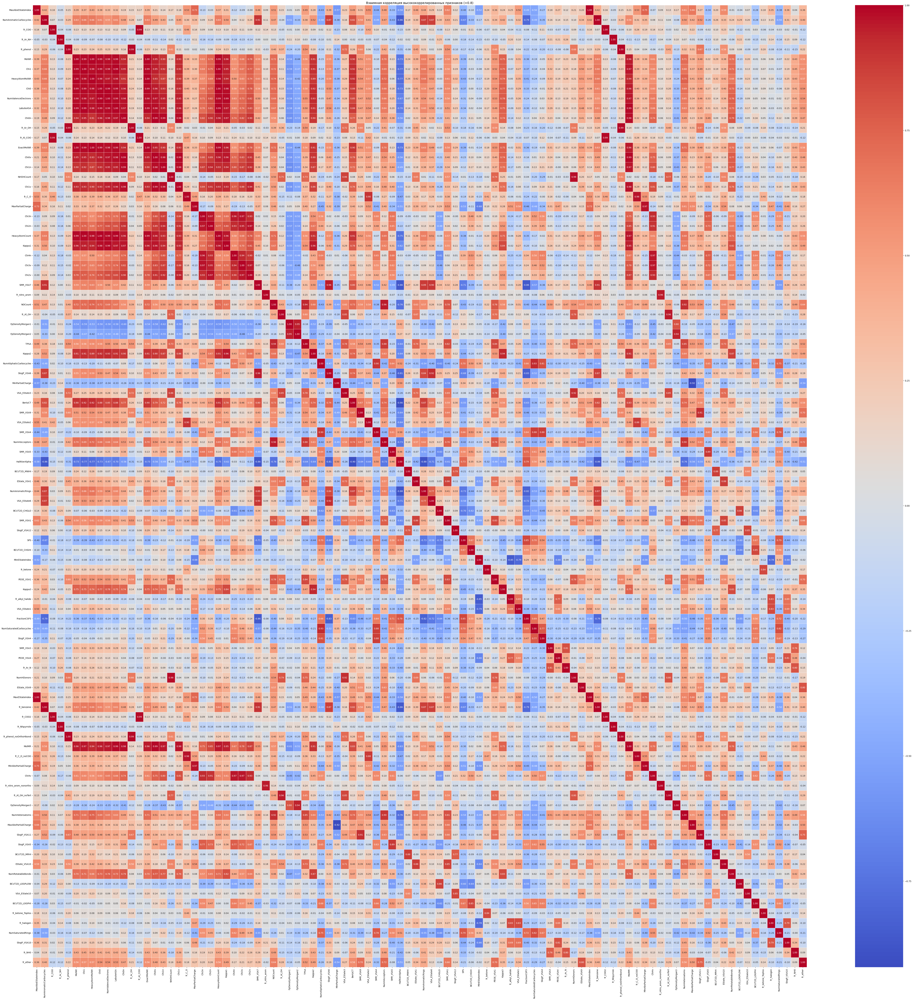

In [31]:
# Построение тепловой карты для этих признаков 
    
unique_highly_correlated_features = pd.unique(highly_correlated_df[['Feature1', 'Feature2']].values.ravel('K'))
subset_corr_matrix = corr_matrix_features.loc[unique_highly_correlated_features, unique_highly_correlated_features]
plt.figure(figsize=(len(unique_highly_correlated_features)*0.8, len(unique_highly_correlated_features)*0.8))
sns.heatmap(subset_corr_matrix,
                    annot=True,        # Показывать значения корреляции на карте
                    cmap='coolwarm',   # Цветовая схема
                    fmt=".2f",         # Формат чисел (2 знака после запятой)
                    linewidths=.5)     # Линии между ячейками
plt.title(f'Взаимная корреляция высококоррелированных признаков (>{correlation_threshold})', fontsize=14)
plt.show()

Общие выводы по высококоррелированным парам признаков
Наблюдается наличие сильной мультиколлинеарности в наборе данных. Можно выделить следующие подгруппы:

1. Почти идентичные дескрипторы (корреляция ~1.0):
Скорее всего эти пары, по сути, измеряют одно и то же или очень близкие аспекты молекулы. Оставлять оба признака может навредить модели.

- MaxAbsEStateIndex и MaxEStateIndex (1.000000)
- NumAromaticCarbocycles и fr_benzene (1.000000)
- fr_COO и fr_COO2 (1.000000)
- fr_Ar_NH и fr_Nhpyrrole (1.000000)
- fr_phenol и fr_phenol_noOrthoHbond (1.000000)
- MolWt и ExactMolWt (0.999999)
- fr_Al_COO и fr_COO/fr_COO2 (0.990155)
- fr_Ar_OH и fr_phenol/fr_phenol_noOrthoHbond (0.990749)
- fr_C_O и fr_C_O_noCOO (0.975764)
- fr_nitro_arom и fr_nitro_arom_nonortho (0.956926)
- fr_Al_OH и fr_Al_OH_noTert (0.956017)
- NumAromaticCarbocycles и NumAromaticRings (0.869929) (очевидно, разные названия для одного и того же или очень похожих вещей)
- fr_alkyl_halide и fr_halogen (0.830212)
- NumSaturatedCarbocycles и NumSaturatedRings (0.821282) (аналогично)
- fr_ketone и fr_ketone_Topliss (0.836820)
- NumAliphaticRings и NumSaturatedRings (0.925126) (очень похожие)
- fr_Ar_N и fr_NH0 (0.803638)
- SMR_VSA7 и SlogP_VSA6 (0.958641)
- SMR_VSA9 и SlogP_VSA11 (0.913042)
- SMR_VSA7 и NumAromaticRings / fr_benzene (0.908529)
- VSA_EState6 и SlogP_VSA6 / fr_benzene / NumAromaticCarbocycles (0.923543 / 0.869556 / 0.865569)
- SMR_VSA1 и EState_VSA1 / EState_VSA10 / TPSA / NumHeteroatoms (0.858307 / 0.851732 / 0.824634 / 0.808648)
- BCUT2D_CHGHI и BCUT2D_LOGPHI (0.848368)
- SlogP_VSA12 и VSA_EState10 (0.849256)
- SMR_VSA3 и fr_Ar_N (0.813492)
- PEOE_VSA4 и SlogP_VSA10 (0.806437)
- SlogP_VSA4 и NumAliphaticCarbocycles (0.814350)
 
2. Дескрипторы разных классов, отражающие общий размер/сложность молекулы (корреляция 0.9+):
Многие дескрипторы коррелируют с общим размером и сложностью молекулы. Они не являются полностью идентичными, но их высокая корреляция говорит о сильной линейной зависимости.

MolWt/ExactMolWt/HeavyAtomMolWt и HeavyAtomCount/Chi0/Chi1/LabuteASA/NumValenceElectrons/MolMR/Kappa1/Kappa2

- MolWt и HeavyAtomMolWt (0.996878)
- HeavyAtomMolWt и ExactMolWt (0.996847)
- Chi1 и HeavyAtomCount (0.998734)
- Chi0 и HeavyAtomCount (0.995964)
- NumValenceElectrons и Chi0 (0.994898)
- LabuteASA и HeavyAtomCount (0.994409)
- Chi1 и LabuteASA (0.992876)
- Chi0 и Chi1 (0.990919)
- NumValenceElectrons и HeavyAtomCount (0.990598)
- NumValenceElectrons и LabuteASA (0.990597)
- Chi0 и LabuteASA (0.989748)
- ExactMolWt и HeavyAtomCount (0.989420)
- MolWt и HeavyAtomCount (0.989254)
- ExactMolWt и LabuteASA (0.988579)
- MolWt и LabuteASA (0.988498)
- ExactMolWt и Chi1 (0.987263)
- MolWt и Chi1 (0.987115)
- ExactMolWt и Chi0 (0.986789)
- NumValenceElectrons и Kappa1 (0.986699)
- MolWt и Chi0 (0.986581)
- LabuteASA и MolMR (0.986306)
- NumValenceElectrons и Chi1 (0.984915)
- HeavyAtomMolWt и HeavyAtomCount (0.982829)
- HeavyAtomMolWt и Chi1 (0.982170)
- ExactMolWt и NumValenceElectrons (0.981348)
- MolWt и NumValenceElectrons (0.981130)
- Chi0 и Kappa1 (0.979940)
- HeavyAtomMolWt и Chi0 (0.977878)
- HeavyAtomMolWt и LabuteASA (0.976832)
- Chi1v и MolMR (0.976779)
- HeavyAtomCount и MolMR (0.968205)
- NumValenceElectrons и MolMR (0.968161)
- Chi1 и MolMR (0.967771)
- Kappa1 и LabuteASA (0.967754)
- Chi0n и Kappa1 (0.966629)
- HeavyAtomMolWt и NumValenceElectrons (0.966198)
- Kappa1 и HeavyAtomCount (0.964430)
- Chi0v и Kappa1 (0.963898)
- Chi0 и MolMR (0.960985)
- Chi1v и LabuteASA (0.960336)
- ExactMolWt и Kappa1 (0.959802)
- MolWt и Kappa1 (0.959568)
- Chi0v и HeavyAtomCount (0.959283)
- ExactMolWt и MolMR (0.956955)
- MolWt и MolMR (0.956905)
- Chi0n и HeavyAtomCount (0.955243)
- Chi1 и Kappa1 (0.954894)
- Chi1n и LabuteASA (0.951038)
- Kappa1 и MolMR (0.950222)
- HeavyAtomMolWt и Kappa1 (0.940211)
- HeavyAtomMolWt и MolMR (0.937093)
- Chi1n и Kappa1 (0.936778)
- Chi1v и Kappa1 (0.933855)
- Chi1v и HeavyAtomCount (0.931725)
- HeavyAtomMolWt и Chi0v (0.928593)
- Chi1n и HeavyAtomCount (0.927762)
- HeavyAtomMolWt и BertzCT (0.924227)
- BertzCT и Chi1 (0.915517)
- Kappa2 и LabuteASA (0.914744)
- Kappa2 и HeavyAtomCount (0.913267)
- Chi1 и Kappa2 (0.913060)
- ExactMolWt и Kappa2 (0.907491)
- MolWt и Kappa2 (0.907294)
- BertzCT и HeavyAtomCount (0.907112)
- Kappa2 и MolMR (0.905301)
- MolWt и BertzCT (0.901983)
- ExactMolWt и BertzCT (0.901982)
- BertzCT и Chi0 (0.884414)
- BertzCT и LabuteASA (0.881102)
- HeavyAtomMolWt и Chi1n (0.870915) и др.

3. Индексы формы (Kappa) и другие топологические дескрипторы:
Ожидаемо, что разные индексы, описывающие форму или размер, будут сильно коррелировать.

Различные Kappa индексы между собой (Kappa1, Kappa2, Kappa3)
- Kappa1 и Kappa2 (0.956134)
- Kappa2 и Kappa3 (0.935728)
- Kappa1 и Kappa3 (0.842092)
- Kappa индексы с NumRotatableBonds, LabuteASA, HeavyAtomCount.
- Kappa2 и NumRotatableBonds (0.867436)
- Kappa3 и NumRotatableBonds (0.830802)
- Kappa1 и NumRotatableBonds (0.816251)
  
4. Дескрипторы зарядов/липофильности (EState_VSA, PEOE_VSA, SlogP_VSA, SMR_VSA, BCUT2D_CHG, Min/MaxPartialCharge):
Эти дескрипторы, скорее всего, пытаются количественно оценить схожие физико-химические свойства молекулы (распределение заряда, липофильность поверхности), поэтому их высокая корреляция логична.

Многие VSA-дескрипторы, основанные на разных принципах, сильно коррелируют.
- SMR_VSA5 и SlogP_VSA5 (0.888509)
- BCUT2D_MWHI и BCUT2D_MRHI (0.878629)
- EState_VSA1 и EState_VSA10 (0.877429)
- SMR_VSA4 и SlogP_VSA4 (0.875105)
- BCUT2D_CHGLO и BCUT2D_LOGPLOW (0.863843)
- SMR_VSA1 и EState_VSA1 (0.858307)
- SMR_VSA1 и EState_VSA10 (0.851732)
- SlogP_VSA12 и VSA_EState10 (0.849256)
- BCUT2D_CHGHI и BCUT2D_LOGPHI (0.848368)
- PEOE_VSA1 и SMR_VSA1 (0.827719)
- VSA_EState1 и fr_halogen (0.829340)
  
Дескрипторы, связанные с зарядами и липофильностью, также показывают сильные связи.
- MinPartialCharge и MaxAbsPartialCharge (-0.922306)
- VSA_EState3 и NHOHCount (0.860910)
- VSA_EState3 и fr_Al_OH (0.852304)
- VSA_EState3 и fr_Al_OH_noTert (0.848447)
- MinEStateIndex и fr_alkyl_halide (-0.847839)
- SlogP_VSA6 и FractionCSP3 (-0.828766)
- PEOE_VSA1 и TPSA (0.835398)
- SMR_VSA1 и TPSA (0.824634)
- SlogP_VSA4 и NumAliphaticCarbocycles (0.814350)
- SMR_VSA3 и fr_Ar_N (0.813492)
- PEOE_VSA4 и SlogP_VSA10 (0.806437)
- EState_VSA9 и fr_ether (0.800610)
- 
5. Некоторые фрагментные дескрипторы (fr_...) с другими дескрипторами:
Фрагментные дескрипторы (наличие или отсутствие групп) могут быть очень сильно коррелированы с другими дескрипторами, которые суммируют свойства атомов или их окружения.

- fr_benzene с NumAromaticCarbocycles, SMR_VSA7, VSA_EState6, SlogP_VSA6.
- NumAromaticRings и fr_benzene (0.869929)
- VSA_EState6 и NumAromaticCarbocycles (0.869556)
- VSA_EState6 и fr_benzene (0.869556)
- SlogP_VSA6 и NumAromaticCarbocycles (0.865569)
- SlogP_VSA6 и fr_benzene (0.865569)
- SlogP_VSA6 и NumAromaticRings (0.838497)
- BertzCT и NumAromaticRings (0.866548)
- SMR_VSA7 и NumAromaticRings (0.886889)
- HallKierAlpha и NumAromaticRings (-0.882608)
- HallKierAlpha и NumAromaticCarbocycles (-0.860970)
- HallKierAlpha и fr_benzene (-0.860970)
- SMR_VSA7 и FractionCSP3 (-0.861741)
- FractionCSP3 и NumAromaticRings (-0.823093)
- SPS и FractionCSP3 (0.848694)
- fr_Ar_N с SMR_VSA3.
- fr_C_O и VSA_EState2 (0.903422)
- f-r_C_O_noCOO и VSA_EState2 (0.880762)


Дополнительно проведем  кореляцию Спирмена, которая измеряет монотонную зависимость, то есть насколько хорошо связь между двумя переменными может быть описана монотонной функцией - которая либо всегда возрастает, либо всегда убывает. Потом сравним полученные результаты. 

In [34]:
# Создание корреляционной матрицы для признаков с использованием метода Спирмена
corr_matrix_features_spearman = features_df.corr(method='spearman')

# Поиск всех высококоррелированных пар признаков по Спирмену
highly_correlated_pairs_spearman = []

# Итерируем по верхней треугольной части матрицы (без диагонали)
for i in range(len(corr_matrix_features_spearman.columns)):
    for j in range(i + 1, len(corr_matrix_features_spearman.columns)):
        feature1 = corr_matrix_features_spearman.columns[i]
        feature2 = corr_matrix_features_spearman.columns[j]
        correlation_value = corr_matrix_features_spearman.iloc[i, j]

        # Если абсолютное значение корреляции выше порога
        if abs(correlation_value) > correlation_threshold:
            highly_correlated_pairs_spearman.append({
                'Feature1': feature1,
                'Feature2': feature2,
                'Correlation': correlation_value
            })

highly_correlated_df_spearman = pd.DataFrame(highly_correlated_pairs_spearman)

# Сортируем по абсолютному значению корреляции для лучшей читаемости
highly_correlated_df_spearman['Abs_Correlation'] = highly_correlated_df_spearman['Correlation'].abs()
highly_correlated_df_spearman = highly_correlated_df_spearman.sort_values(by='Abs_Correlation', ascending=False).drop(columns='Abs_Correlation')

In [35]:
print(f"\n--- Высококоррелированные пары признаков (абсолютная корреляция Спирмена > {correlation_threshold}) ---")
print(highly_correlated_df_spearman.to_string(index=False)) # to_string() для полного вывода


--- Высококоррелированные пары признаков (абсолютная корреляция Спирмена > 0.8) ---
               Feature1                Feature2  Correlation
      MaxAbsEStateIndex          MaxEStateIndex     1.000000
 NumAromaticCarbocycles              fr_benzene     1.000000
                 fr_COO                 fr_COO2     1.000000
               fr_Ar_NH            fr_Nhpyrrole     1.000000
              fr_phenol  fr_phenol_noOrthoHbond     1.000000
                  MolWt              ExactMolWt     0.999985
                   Chi1          HeavyAtomCount     0.997750
                  MolWt          HeavyAtomMolWt     0.995728
         HeavyAtomMolWt              ExactMolWt     0.995635
                   Chi1                     Ipc     0.993977
                   Chi0          HeavyAtomCount     0.993765
    NumValenceElectrons                    Chi0     0.991418
              LabuteASA          HeavyAtomCount     0.990203
              fr_Al_COO                  fr_COO     0.990155


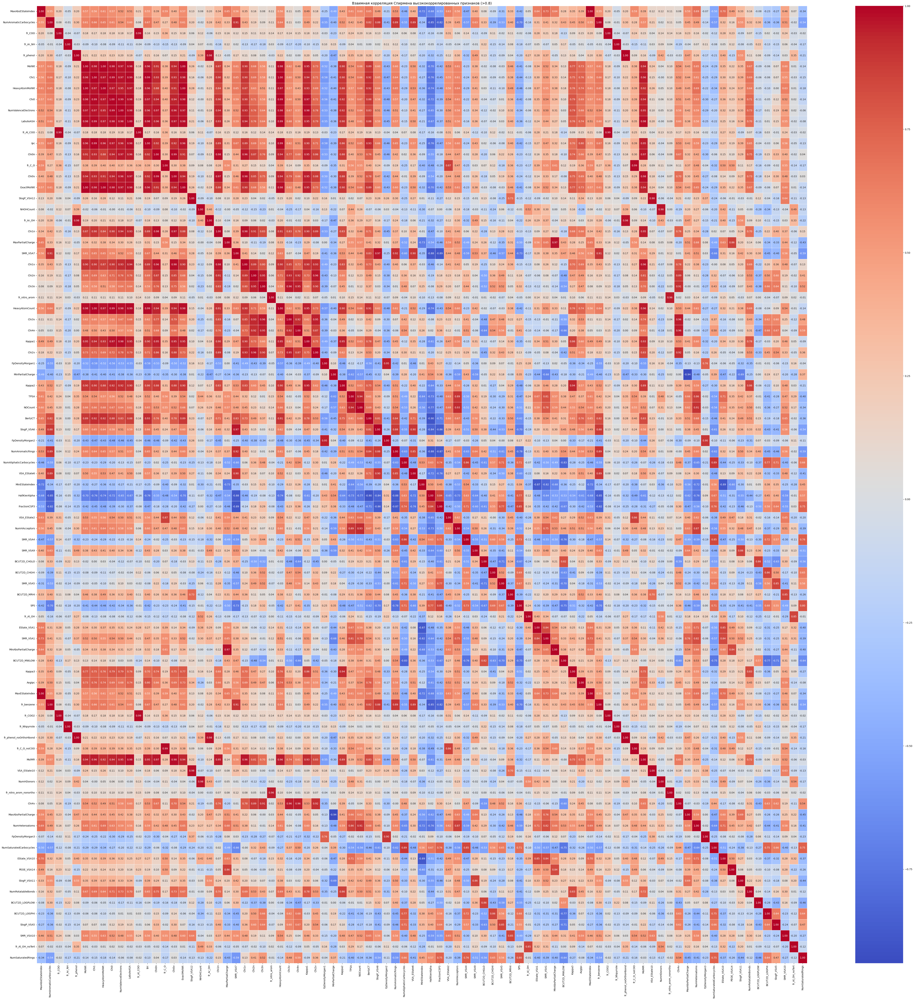

In [36]:
# Построение тепловой карты для этих признаков по Спирмену
unique_highly_correlated_features_spearman = pd.unique(highly_correlated_df_spearman[['Feature1', 'Feature2']].values.ravel('K'))

if len(unique_highly_correlated_features_spearman) > 0:
    subset_corr_matrix_spearman = corr_matrix_features_spearman.loc[unique_highly_correlated_features_spearman, unique_highly_correlated_features_spearman]
    plt.figure(figsize=(len(unique_highly_correlated_features_spearman)*0.8, len(unique_highly_correlated_features_spearman)*0.8))
    sns.heatmap(subset_corr_matrix_spearman,
                        annot=True,
                        cmap='coolwarm',
                        fmt=".2f",
                        linewidths=.5)
    plt.title(f'Взаимная корреляция Спирмена высококоррелированных признаков (>{correlation_threshold})', fontsize=14)
    plt.show()
else:
    print("Не найдено высококоррелированных пар по Спирмену.")

In [37]:
# Найдем общие признаки для корреляции Пирсона и Спирмена
# Для удобства сравнения создадим уникальный ключ для каждой пары (отсортированный, чтобы избежать проблем с порядком)
highly_correlated_df['pair_key'] = highly_correlated_df.apply(lambda row: tuple(sorted([row['Feature1'], row['Feature2']])), axis=1)
highly_correlated_df_spearman['pair_key'] = highly_correlated_df_spearman.apply(lambda row: tuple(sorted([row['Feature1'], row['Feature2']])), axis=1)

# Получаем множества ключей для быстрого поиска
pearson_keys = set(highly_correlated_df['pair_key'])
spearman_keys = set(highly_correlated_df_spearman['pair_key'])

# 1. Пары, присутствующие в обоих списках
common_keys = pearson_keys.intersection(spearman_keys)

if common_keys:
    print("Пары признаков, присутствующие в обоих списках корреляции (Пирсона и Спирмена)")
    

    # Создаем DataFrame только для общих пар, объединяя данные из обоих списков
    common_pairs_data = []
    for p_key in common_keys:
        pearson_row = highly_correlated_df[highly_correlated_df['pair_key'] == p_key].iloc[0]
        spearman_row = highly_correlated_df_spearman[highly_correlated_df_spearman['pair_key'] == p_key].iloc[0]
        
        common_pairs_data.append({
            'Feature1': pearson_row['Feature1'],
            'Feature2': pearson_row['Feature2'],
            'Pearson_Correlation': pearson_row['Correlation'],
            'Spearman_Correlation': spearman_row['Correlation'],
            'Spearman_Abs_Correlation': abs(spearman_row['Correlation'])
        })

    common_df = pd.DataFrame(common_pairs_data)
    # Сортируем по абсолютному значению корреляции Спирмена
    common_df = common_df.sort_values(by='Spearman_Abs_Correlation', ascending=False).drop(columns='Spearman_Abs_Correlation')
    print(common_df.to_string(index=False))
else:
    print("\Не найдено высококоррелированных пар, присутствующих в обоих списках ---")

Пары признаков, присутствующие в обоих списках корреляции (Пирсона и Спирмена)
               Feature1                Feature2  Pearson_Correlation  Spearman_Correlation
 NumAromaticCarbocycles              fr_benzene             1.000000              1.000000
      MaxAbsEStateIndex          MaxEStateIndex             1.000000              1.000000
              fr_phenol  fr_phenol_noOrthoHbond             1.000000              1.000000
                 fr_COO                 fr_COO2             1.000000              1.000000
               fr_Ar_NH            fr_Nhpyrrole             1.000000              1.000000
                  MolWt              ExactMolWt             0.999999              0.999985
                   Chi1          HeavyAtomCount             0.998734              0.997750
                  MolWt          HeavyAtomMolWt             0.996878              0.995728
         HeavyAtomMolWt              ExactMolWt             0.996847              0.995635
           

In [38]:
# Пары, присутствующие только в списке Спирмена
only_spearman_keys = spearman_keys.difference(pearson_keys)

if only_spearman_keys:
    print("\nПары признаков, присутствующие ТОЛЬКО в списке корреляции Спирмена")
   

    # Фильтруем DataFrame Спирмена, оставляя только уникальные пары
    only_spearman_df = highly_correlated_df_spearman[highly_correlated_df_spearman['pair_key'].isin(only_spearman_keys)].copy()
    
    # Сортируем по абсолютному значению корреляции Спирмена
    only_spearman_df['Abs_Correlation_Spearman'] = only_spearman_df['Correlation'].abs()
    only_spearman_df = only_spearman_df.sort_values(by='Abs_Correlation_Spearman', ascending=False).drop(columns=['pair_key', 'Abs_Correlation_Spearman'])
    print(only_spearman_df.to_string(index=False))
else:
    print("\nНе найдено высококоррелированных пар, присутствующих только в списке Спирмена")


Пары признаков, присутствующие ТОЛЬКО в списке корреляции Спирмена
           Feature1                Feature2  Correlation
               Chi1                     Ipc     0.993977
                Ipc          HeavyAtomCount     0.988379
                Ipc               LabuteASA     0.979426
               Chi0                     Ipc     0.967537
         ExactMolWt                     Ipc     0.964836
              MolWt                     Ipc     0.964514
     HeavyAtomMolWt                     Ipc     0.963150
NumValenceElectrons                     Ipc     0.955536
                Ipc                   MolMR     0.950226
            BertzCT                     Ipc     0.928233
              Chi0v                     Ipc     0.922551
              Chi0n                     Ipc     0.916358
                Ipc                  Kappa1     0.903382
              Chi1v                     Ipc     0.893638
              Chi1n                     Ipc     0.893237
     MinEStateIndex 

In [39]:
# Пары, присутствующие только в списке Пирсона (для полноты картины)
only_pearson_keys = pearson_keys.difference(spearman_keys)

if only_pearson_keys:
    print("\Пары признаков, присутствующие ТОЛЬКО в списке корреляции Пирсона ")
    
    only_pearson_df = highly_correlated_df[highly_correlated_df['pair_key'].isin(only_pearson_keys)].copy()
    only_pearson_df['Abs_Correlation_Pearson'] = only_pearson_df['Correlation'].abs()
    only_pearson_df = only_pearson_df.sort_values(by='Abs_Correlation_Pearson', ascending=False).drop(columns=['pair_key', 'Abs_Correlation_Pearson'])
    print(only_pearson_df.to_string(index=False))
else:
    print("\nНе найдено высококоррелированных пар, присутствующих только в списке Пирсона")

\Пары признаков, присутствующие ТОЛЬКО в списке корреляции Пирсона 
               Feature1                Feature2  Correlation
            VSA_EState3              NumHDonors     0.918466
            BCUT2D_MWHI             BCUT2D_MRHI     0.878629
               SMR_VSA4              SlogP_VSA4     0.875105
            VSA_EState3               NHOHCount     0.860910
            VSA_EState3                fr_Al_OH     0.852304
            VSA_EState3         fr_Al_OH_noTert     0.848447
         MinEStateIndex         fr_alkyl_halide    -0.847839
              fr_ketone       fr_ketone_Topliss     0.836820
                  Chi1v                   Chi3n     0.836142
              PEOE_VSA1                    TPSA     0.835398
        fr_alkyl_halide              fr_halogen     0.830212
                  Chi2v               LabuteASA     0.829630
                  Chi0v                   Chi3v     0.829488
            VSA_EState1              fr_halogen     0.829340
              PEO

***ДАЛЬНЕЙШИЙ ПЛАН ИССЛЕДОВАНИЯ***
Учитывая полученные данные по кореляции:
- удалим один из признаков с высокой корреляцией >=0.9, при этом будем учитывать, те признаки которые корелируют с целевыми переменными. если они корелируют то для удаления выберем другой признак. Удалять будем сначала по кореляции Пирсона потом по Спирмена.
- делее необходимо построим график распределния целевых переменных, чтобы понять как распределены переменные, так как при общем анализе увидели очень большой разброс, потом произведем предобработку.
- применим Lasso для дальнейшего отбора признаков для каждой вашей целевой переменной (IC50, CC50, SI) отдельно. Это поможет вам понять, какие признаки важны для каждой из них и какие можно отбросить, аналогично отберем признаки с помощью Random Forest.

In [41]:
# Определяем целевые и признаковые столбцы
target_cols = ['IC50, mM', 'CC50, mM', 'SI']
feature_cols = [col for col in data_imputed.columns if col not in target_cols]

# Вычисляем важность признаков на основе максимальной корреляции с целевыми переменными
feature_importance = {}
for feature in feature_cols:
    max_corr = 0
    for target in target_cols:
        # Временно создаем DataFrame (для безопасности данных)
        temp_df = data_imputed[[feature, target]]
        # Вычисляем корреляцию Пирсона
        pearson_corr = temp_df[feature].corr(temp_df[target], method='pearson')
        # Вычисляем корреляцию Спирмена
        spearman_corr = temp_df[feature].corr(temp_df[target], method='spearman')
        # Берем максимальное абсолютное значение корреляции
        max_corr = max(max_corr, abs(pearson_corr), abs(spearman_corr))
    feature_importance[feature] = max_corr

# Инициализируем очищенный DataFrame и множество признаков для удаления
features_df_cleaned = data_imputed[feature_cols].copy()
features_to_drop = set()
correlation_threshold = 0.9

# Функция для определения, какой признак удалить на основе важности
def decide_which_to_drop(f1, f2, importance_dict):
    # Проверяем, что признаки еще существуют в DataFrame и не помечены к удалению
    if f1 not in features_df_cleaned.columns or f2 not in features_df_cleaned.columns:
        return None
    if f1 in features_to_drop or f2 in features_to_drop:
        return None
    # Удаляем признак с меньшей важностью
    return f2 if importance_dict.get(f1, 0) >= importance_dict.get(f2, 0) else f1

# Сильно скоррелированные признаки (корреляция Пирсона)
print(f"\nУдаляем признаки с корреляцией Пирсона >= {correlation_threshold}")
for _, row in highly_correlated_df.iterrows():
    f1, f2, corr = row['Feature1'], row['Feature2'], row['Correlation']
    if abs(corr) >= correlation_threshold:
        feature_to_remove = decide_which_to_drop(f1, f2, feature_importance)
        if feature_to_remove:
            features_to_drop.add(feature_to_remove)
            print(f"  Удаляем (Пирсон): '{feature_to_remove}' (из пары '{f1}', '{f2}', Корр: {corr:.2f})")

# Применяем удаление признаков
features_df_cleaned = features_df_cleaned.drop(columns=list(features_to_drop), errors='ignore')
print(f"Количество признаков после удаления по Пирсону: {features_df_cleaned.shape[1]}")
print(f"Удаленные признаки (Пирсон): {list(features_to_drop)}")

# Удаляем сильно скоррелированные признаки (корреляция Спирмена)
print(f"\nУдаляем признаки с корреляцией Спирмена >= {correlation_threshold}")
for _, row in highly_correlated_df_spearman.iterrows():
    f1, f2, corr = row['Feature1'], row['Feature2'], row['Correlation']
    if abs(corr) >= correlation_threshold:
        feature_to_remove = decide_which_to_drop(f1, f2, feature_importance)
        if feature_to_remove:
            features_to_drop.add(feature_to_remove)
            print(f"  Удаляем (Спирмен): '{feature_to_remove}' (из пары '{f1}', '{f2}', Корр: {corr:.2f})")

# Применяем удаление признаков (уже после добавления новых признаков для удаления по Спирмену)
features_df_cleaned = features_df_cleaned.drop(columns=list(features_to_drop), errors='ignore')

# Выводим окончательные результаты
print(f"\nВсего удаленных признаков: {len(features_to_drop)}")
print(f"Итоговое количество признаков: {features_df_cleaned.shape[1]}")
print("\nПервые 5 строк очищенного DataFrame признаков:")
print(features_df_cleaned.head())

C:\Users\admin\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\admin\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\admin\anaconda3\Lib\site-packages\pandas\core\nanops.py:1632: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  return spearmanr(a, b)[0]
C:\Users\admin\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\admin\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\admin\anaconda3\Lib\site-packages\pandas\core\nanops.py:1632: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  return spearmanr(a, b)[0]
C:\Users\a


Удаляем признаки с корреляцией Пирсона >= 0.9
  Удаляем (Пирсон): 'MaxEStateIndex' (из пары 'MaxAbsEStateIndex', 'MaxEStateIndex', Корр: 1.00)
  Удаляем (Пирсон): 'fr_benzene' (из пары 'NumAromaticCarbocycles', 'fr_benzene', Корр: 1.00)
  Удаляем (Пирсон): 'fr_COO2' (из пары 'fr_COO', 'fr_COO2', Корр: 1.00)
  Удаляем (Пирсон): 'fr_Nhpyrrole' (из пары 'fr_Ar_NH', 'fr_Nhpyrrole', Корр: 1.00)
  Удаляем (Пирсон): 'fr_phenol_noOrthoHbond' (из пары 'fr_phenol', 'fr_phenol_noOrthoHbond', Корр: 1.00)
  Удаляем (Пирсон): 'ExactMolWt' (из пары 'MolWt', 'ExactMolWt', Корр: 1.00)
  Удаляем (Пирсон): 'Chi1' (из пары 'Chi1', 'HeavyAtomCount', Корр: 1.00)
  Удаляем (Пирсон): 'HeavyAtomMolWt' (из пары 'MolWt', 'HeavyAtomMolWt', Корр: 1.00)
  Удаляем (Пирсон): 'HeavyAtomCount' (из пары 'Chi0', 'HeavyAtomCount', Корр: 1.00)
  Удаляем (Пирсон): 'NumValenceElectrons' (из пары 'NumValenceElectrons', 'Chi0', Корр: 0.99)
  Удаляем (Пирсон): 'Chi0n' (из пары 'Chi0n', 'Chi0v', Корр: 0.99)
  Удаляем (Пирсон): 

In [42]:
# Пример проверки признаков с низкой вариативностью (как сообщил вывод что возможно есть константы)
threshold_std = 0.001 # Или другое небольшое значение
low_variance_features = [col for col in feature_cols if data_imputed[col].std() < threshold_std]
print(f"Признаки с очень низкой вариативностью, которые могут вызывать предупреждения: {low_variance_features}")

Признаки с очень низкой вариативностью, которые могут вызывать предупреждения: ['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_N_O', 'fr_SH', 'fr_azide', 'fr_barbitur', 'fr_benzodiazepine', 'fr_diazo', 'fr_dihydropyridine', 'fr_isocyan', 'fr_isothiocyan', 'fr_lactam', 'fr_nitroso', 'fr_phos_acid', 'fr_phos_ester', 'fr_prisulfonamd', 'fr_thiocyan']


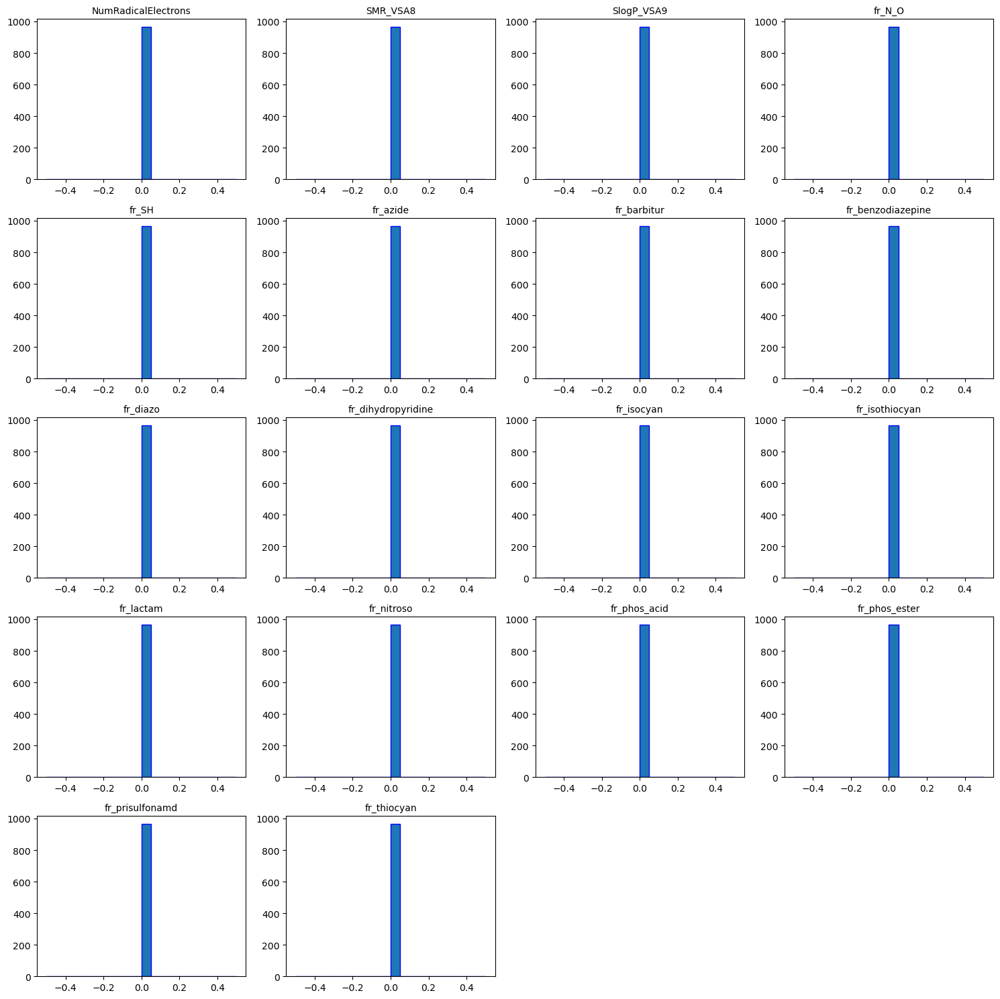

In [43]:
# Список признаков
features_const = ['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_N_O', 'fr_SH', 
            'fr_azide', 'fr_barbitur', 'fr_benzodiazepine', 'fr_diazo', 
            'fr_dihydropyridine', 'fr_isocyan', 'fr_isothiocyan', 'fr_lactam', 
            'fr_nitroso', 'fr_phos_acid', 'fr_phos_ester', 'fr_prisulfonamd', 'fr_thiocyan']

# Строим гистограммы
fig, axes = plt.subplots(5, 4, figsize=(15, 15))
axes = axes.flatten()
for i, feature in enumerate(features_const):
    axes[i].hist(features_df_cleaned[feature].dropna(), bins=20, edgecolor='blue')
    axes[i].set_title(feature, fontsize=10)
for j in range(len(features_const), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [44]:
unique_counts = {feature: features_df_cleaned[feature].nunique() for feature in features_const}

# Вывод результатов
for feature, count in unique_counts.items():
    print(f"{feature}: {count} уникальных значений")

NumRadicalElectrons: 1 уникальных значений
SMR_VSA8: 1 уникальных значений
SlogP_VSA9: 1 уникальных значений
fr_N_O: 1 уникальных значений
fr_SH: 1 уникальных значений
fr_azide: 1 уникальных значений
fr_barbitur: 1 уникальных значений
fr_benzodiazepine: 1 уникальных значений
fr_diazo: 1 уникальных значений
fr_dihydropyridine: 1 уникальных значений
fr_isocyan: 1 уникальных значений
fr_isothiocyan: 1 уникальных значений
fr_lactam: 1 уникальных значений
fr_nitroso: 1 уникальных значений
fr_phos_acid: 1 уникальных значений
fr_phos_ester: 1 уникальных значений
fr_prisulfonamd: 1 уникальных значений
fr_thiocyan: 1 уникальных значений


Перечисленные признаки не критичны из-за отсутствия вариативности - поэтому удалим их.

In [46]:
features_df_cleaned.drop(columns=features_const, inplace=True)

In [47]:
print(f"Осталось признаков: {features_df_cleaned.shape[1]}")

Осталось признаков: 150


In [48]:
features_df_cleaned

,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MaxPartialCharge,MinPartialCharge,FpDensityMorgan1,FpDensityMorgan3,BCUT2D_MWHI,...,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea
0,5.094096,0.387225,0.387225,0.417362,42.928571,0.038844,-0.293526,0.642857,1.321429,14.822266,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0
1,3.961417,0.533868,0.533868,0.462473,45.214286,0.012887,-0.313407,0.607143,1.285714,14.975110,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0
2,2.627117,0.543231,0.543231,0.260923,42.187500,0.094802,-0.325573,0.562500,1.156250,15.353938,...,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0
3,5.097360,0.390603,0.390603,0.377846,41.862069,0.038844,-0.293526,0.620690,1.310345,14.821216,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0
4,5.150510,0.270476,0.270476,0.429038,36.514286,0.062897,-0.257239,0.600000,1.257143,14.831112,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,12.934891,0.048029,-0.476142,0.382752,49.133333,0.317890,-0.468587,1.133333,2.533333,16.586886,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
997,13.635345,0.030329,-0.699355,0.369425,44.542857,0.327562,-0.467493,1.085714,2.457143,16.586914,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
998,13.991690,0.026535,-0.650790,0.284923,41.973684,0.327887,-0.467485,1.157895,2.552632,32.166365,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
999,13.830180,0.146522,-1.408652,0.381559,39.000000,0.312509,-0.468755,0.756757,1.864865,16.540061,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [49]:
# Создадим объединенный датафрейм
# Создаем df_clr путем объединения features_df_cleaned и целевых столбцов из data_imputed
df_clr = pd.concat([features_df_cleaned, data_imputed[target_cols]], axis=1)

In [50]:
print(f"Размер df_clr: {df_clr.shape}")
print("Первые 5 строк df_clr (признаки и целевые переменные):")
df_clr.head()

Размер df_clr: (967, 153)
Первые 5 строк df_clr (признаки и целевые переменные):


,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MaxPartialCharge,MinPartialCharge,FpDensityMorgan1,FpDensityMorgan3,BCUT2D_MWHI,...,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea,"IC50, mM","CC50, mM",SI
0,5.094096,0.387225,0.387225,0.417362,42.928571,0.038844,-0.293526,0.642857,1.321429,14.822266,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,6.239374,175.482382,28.125000
1,3.961417,0.533868,0.533868,0.462473,45.214286,0.012887,-0.313407,0.607143,1.285714,14.975110,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.771831,5.402819,7.000000
2,2.627117,0.543231,0.543231,0.260923,42.187500,0.094802,-0.325573,0.562500,1.156250,15.353938,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,223.808778,161.142320,0.720000
3,5.097360,0.390603,0.390603,0.377846,41.862069,0.038844,-0.293526,0.620690,1.310345,14.821216,...,0.0,0.0,0.0,0.0,0.0,4.0,0.0,1.705624,107.855654,63.235294
4,5.150510,0.270476,0.270476,0.429038,36.514286,0.062897,-0.257239,0.600000,1.257143,14.831112,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,107.131532,139.270991,1.300000


In [51]:
def visualize_dataframe_columns(df, columns_to_plot, plots_per_row=3, max_categories=20):
    """
    Визуализация столбцов DataFrame с автоматическим выбором типа графика.
        df: DataFrame
        columns_to_plot: list - список названий столбцов для визуализации
        plots_per_row: int - количество графиков в одной строке
        max_categories: int - максимальное количество категорий для отображения
    """
    # Фильтруем только существующие столбцы
    valid_columns = [col for col in columns_to_plot if col in df.columns]
    if not valid_columns:
        print("Нет валидных столбцов для визуализации!")
        return
    
    # Создаем сетку графиков
    n_cols = min(plots_per_row, len(valid_columns))
    n_rows = int(np.ceil(len(valid_columns) / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
    if n_rows == 1 and n_cols == 1:
        axes = np.array([axes])  # Для случая с одним графиком
    
    axes = axes.flatten()  # Преобразуем в плоский массив
    
    for i, col in enumerate(valid_columns):
        ax = axes[i]
        
        # Определяем тип данных столбца
        if pd.api.types.is_numeric_dtype(df[col]):
            # Числовой столбец - гистограмма
            df[col].hist(ax=ax, bins=30, color='skyblue', edgecolor='black')
            ax.set_title(f'{col}\n(median={df[col].median():.2f})')
            
            # Добавляем линию медианы
            ax.axvline(df[col].median(), color='red', linestyle='--', linewidth=1)
        else:
            # Категориальный столбец - bar plot (топ значений)
            value_counts = df[col].value_counts().head(max_categories)
            value_counts.plot(kind='bar', ax=ax, color='lightgreen')
            ax.set_title(f'Top {max_categories} {col}')
            ax.tick_params(axis='x', rotation=45)
        
        ax.grid(False)
    
    # Скрываем пустые оси
    for j in range(len(valid_columns), len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

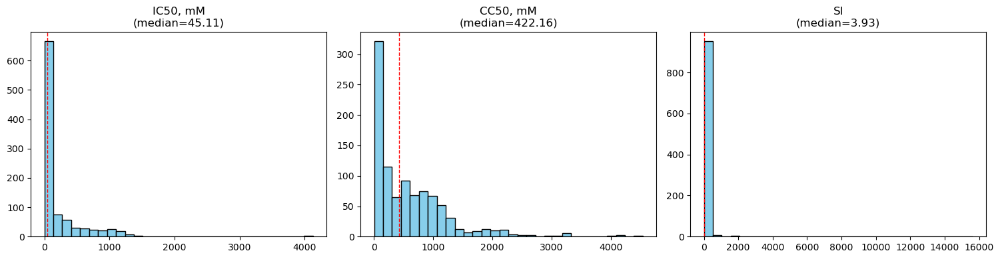

In [52]:
# Построим распределение целевыйх переменных
columns_to_plot=['IC50, mM', 'CC50, mM', 'SI'] # Список названий столбцов (строк), которые необходимо визуализировать.
visualize_dataframe_columns(df_clr, columns_to_plot)

In [53]:
# Распределение скошенное, логарифмируем целевые переменные
# Список целевых переменных для преобразования
target_columns = ['IC50, mM', 'CC50, mM', 'SI']

for col in target_columns:
    # Проверяем наличие нулей (или очень близких к нулю значений)
    zero_count = (df_clr[col] <= 0).sum()
    if zero_count > 0:
        print(f"\nОбнаружено {zero_count} нулевых или отрицательных значений в '{col}'. Будет добавлена константа {epsilon}.")
        # Добавляем epsilon только к значениям, которые <= 0, чтобы не искажать другие данные
        df_clr[f'log_{col}'] = np.log10(df_clr[col].apply(lambda x: x if x > 0 else epsilon))
    else:
        print(f"\nНулевых или отрицательных значений в '{col}' не обнаружено. Логарифмирование будет применено напрямую.")
        df_clr[f'log_{col}'] = np.log10(df_clr[col])


Нулевых или отрицательных значений в 'IC50, mM' не обнаружено. Логарифмирование будет применено напрямую.

Нулевых или отрицательных значений в 'CC50, mM' не обнаружено. Логарифмирование будет применено напрямую.

Нулевых или отрицательных значений в 'SI' не обнаружено. Логарифмирование будет применено напрямую.


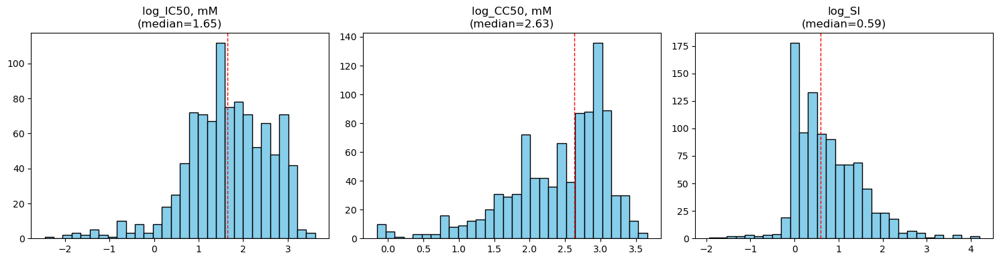

In [54]:
# Построим распределение целевыйх переменных
columns_to_plot=['log_IC50, mM', 'log_CC50, mM', 'log_SI'] # Список названий столбцов (строк), которые необходимо визуализировать.
visualize_dataframe_columns(df_clr, columns_to_plot)

Удалим не логарифмированные целевые переменные

In [56]:
df_clr.drop(['IC50, mM', 'CC50, mM', 'SI'], axis=1, inplace=True)
df_clr

,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MaxPartialCharge,MinPartialCharge,FpDensityMorgan1,FpDensityMorgan3,BCUT2D_MWHI,...,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea,"log_IC50, mM","log_CC50, mM",log_SI
0,5.094096,0.387225,0.387225,0.417362,42.928571,0.038844,-0.293526,0.642857,1.321429,14.822266,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.795141,2.244234,1.449093
1,3.961417,0.533868,0.533868,0.462473,45.214286,0.012887,-0.313407,0.607143,1.285714,14.975110,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,-0.112478,0.732620,0.845098
2,2.627117,0.543231,0.543231,0.260923,42.187500,0.094802,-0.325573,0.562500,1.156250,15.353938,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,2.349877,2.207210,-0.142668
3,5.097360,0.390603,0.390603,0.377846,41.862069,0.038844,-0.293526,0.620690,1.310345,14.821216,...,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.231883,2.032843,1.800960
4,5.150510,0.270476,0.270476,0.429038,36.514286,0.062897,-0.257239,0.600000,1.257143,14.831112,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.029917,2.143861,0.113943
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,12.934891,0.048029,-0.476142,0.382752,49.133333,0.317890,-0.468587,1.133333,2.533333,16.586886,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.491363,1.544064,0.052701
997,13.635345,0.030329,-0.699355,0.369425,44.542857,0.327562,-0.467493,1.085714,2.457143,16.586914,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.505149,1.531471,0.026322
998,13.991690,0.026535,-0.650790,0.284923,41.973684,0.327887,-0.467485,1.157895,2.552632,32.166365,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.491360,1.531472,0.040112
999,13.830180,0.146522,-1.408652,0.381559,39.000000,0.312509,-0.468755,0.756757,1.864865,16.540061,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.505136,1.518509,0.013373


Далее отберем признаки наиболее подходящие для регрессии, для этого воспользуемся Lasso и Random forest(что бы проверить на наличие неленейных связей)

In [58]:
# Создаем DataFrame для Lasso
df_ic50_lasso = df_clr.drop(['log_CC50, mM', 'log_SI'], axis=1)  # Только log_IC50
df_cc50_lasso = df_clr.drop(['log_IC50, mM', 'log_SI'], axis=1)  # Только log_CC50
df_si_lasso = df_clr.drop(['log_IC50, mM', 'log_CC50, mM'], axis=1)  # Только log_SI

In [59]:
df_ic50_lasso

,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MaxPartialCharge,MinPartialCharge,FpDensityMorgan1,FpDensityMorgan3,BCUT2D_MWHI,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea,"log_IC50, mM"
0,5.094096,0.387225,0.387225,0.417362,42.928571,0.038844,-0.293526,0.642857,1.321429,14.822266,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.795141
1,3.961417,0.533868,0.533868,0.462473,45.214286,0.012887,-0.313407,0.607143,1.285714,14.975110,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,-0.112478
2,2.627117,0.543231,0.543231,0.260923,42.187500,0.094802,-0.325573,0.562500,1.156250,15.353938,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,2.349877
3,5.097360,0.390603,0.390603,0.377846,41.862069,0.038844,-0.293526,0.620690,1.310345,14.821216,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.231883
4,5.150510,0.270476,0.270476,0.429038,36.514286,0.062897,-0.257239,0.600000,1.257143,14.831112,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.029917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,12.934891,0.048029,-0.476142,0.382752,49.133333,0.317890,-0.468587,1.133333,2.533333,16.586886,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.491363
997,13.635345,0.030329,-0.699355,0.369425,44.542857,0.327562,-0.467493,1.085714,2.457143,16.586914,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.505149
998,13.991690,0.026535,-0.650790,0.284923,41.973684,0.327887,-0.467485,1.157895,2.552632,32.166365,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.491360
999,13.830180,0.146522,-1.408652,0.381559,39.000000,0.312509,-0.468755,0.756757,1.864865,16.540061,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.505136


In [60]:
# Функция для выполнения Lasso и вывода результатов 
def run_lasso_selection(df, target_col_name):
    print(f"\n===== Обработка для целевой переменной: {target_col_name} =====")

    # Разделение на признаки (X) и целевую переменную (y)
    X = df.drop(columns=[target_col_name])
    y = df[target_col_name]

    # Разделение на обучающую и тестовую выборки
    # random_state для воспроизводимости
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    print(f"Размер обучающей выборки (X_train): {X_train.shape}")
    print(f"Размер тестовой выборки (X_test): {X_test.shape}")

    # Стандартизация признаков
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Применение LassoCV для автоматического выбора лучшего alpha
    # cv=5 - 5-кратную кросс-валидацию
    # random_state для воспроизводимости кросс-валидации
    print("Выполнение LassoCV для поиска оптимального alpha...")
    lasso_model = LassoCV(cv=5, random_state=42, n_jobs=-1, max_iter=100000).fit(X_train_scaled, y_train)

    print(f"Оптимальное значение alpha (коэффициента регуляризации): {lasso_model.alpha_:.4f}")

    # Получение коэффициентов модели
    lasso_coefficients = pd.Series(lasso_model.coef_, index=X.columns)

    # Отбор признаков: те, у которых коэффициент не равен нулю
    selected_features = lasso_coefficients[lasso_coefficients != 0].index.tolist()
    num_selected_features = len(selected_features)

    print(f"\nКоличество отобранных признаков: {num_selected_features} из {X.shape[1]}")
    print(f"Отобранные признаки для {target_col_name}:")
    for feature in selected_features:
        print(f"- {feature}")
        
    # Оценка производительности модели на тестовой выборке
    y_pred = lasso_model.predict(X_test_scaled)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"\nМетрики производительности на тестовой выборке:")
    print(f"Mean Squared Error (MSE): {mse:.4f}")
    print(f"R-squared (R2): {r2:.4f}")
    # print(f"y_pred: {y_pred}") # оставил на всякий случай

    return selected_features, lasso_model, scaler

In [61]:
#Запуск Lasso для каждой целевой переменной
# Lasso для IC50
selected_features_ic50, lasso_model_ic50, scaler_ic50 = run_lasso_selection(df_ic50_lasso, 'log_IC50, mM')


===== Обработка для целевой переменной: log_IC50, mM =====
Размер обучающей выборки (X_train): (773, 150)
Размер тестовой выборки (X_test): (194, 150)
Выполнение LassoCV для поиска оптимального alpha...
Оптимальное значение alpha (коэффициента регуляризации): 0.0065

Количество отобранных признаков: 86 из 150
Отобранные признаки для log_IC50, mM:
- MaxAbsEStateIndex
- MinAbsEStateIndex
- MinEStateIndex
- qed
- MaxPartialCharge
- MinPartialCharge
- FpDensityMorgan3
- BCUT2D_MWHI
- BCUT2D_MWLOW
- BCUT2D_CHGLO
- BCUT2D_LOGPHI
- BCUT2D_LOGPLOW
- BCUT2D_MRHI
- BCUT2D_MRLOW
- Kappa3
- PEOE_VSA11
- PEOE_VSA12
- PEOE_VSA13
- PEOE_VSA3
- PEOE_VSA5
- PEOE_VSA6
- PEOE_VSA7
- PEOE_VSA8
- SMR_VSA10
- SMR_VSA2
- SMR_VSA5
- SMR_VSA6
- SlogP_VSA3
- SlogP_VSA4
- SlogP_VSA7
- EState_VSA1
- EState_VSA11
- EState_VSA2
- EState_VSA3
- EState_VSA5
- EState_VSA6
- EState_VSA7
- VSA_EState5
- VSA_EState6
- VSA_EState9
- NHOHCount
- NumAliphaticRings
- NumAromaticHeterocycles
- NumSaturatedHeterocycles
- NumS

In [62]:
# Lasso для CC50
selected_features_cc50, lasso_model_cc50, scaler_cc50 = run_lasso_selection(df_cc50_lasso, 'log_CC50, mM')


===== Обработка для целевой переменной: log_CC50, mM =====
Размер обучающей выборки (X_train): (773, 150)
Размер тестовой выборки (X_test): (194, 150)
Выполнение LassoCV для поиска оптимального alpha...
Оптимальное значение alpha (коэффициента регуляризации): 0.0025

Количество отобранных признаков: 92 из 150
Отобранные признаки для log_CC50, mM:
- MaxAbsEStateIndex
- qed
- SPS
- MaxPartialCharge
- MinPartialCharge
- FpDensityMorgan1
- FpDensityMorgan3
- BCUT2D_MWHI
- BCUT2D_CHGLO
- BCUT2D_LOGPHI
- BCUT2D_MRLOW
- Kappa3
- PEOE_VSA12
- PEOE_VSA13
- PEOE_VSA14
- PEOE_VSA2
- PEOE_VSA4
- PEOE_VSA5
- PEOE_VSA7
- PEOE_VSA8
- PEOE_VSA9
- SMR_VSA10
- SMR_VSA3
- SMR_VSA6
- SlogP_VSA10
- SlogP_VSA12
- SlogP_VSA3
- SlogP_VSA4
- SlogP_VSA7
- EState_VSA1
- EState_VSA11
- EState_VSA2
- EState_VSA3
- EState_VSA5
- EState_VSA7
- EState_VSA8
- VSA_EState4
- VSA_EState5
- VSA_EState8
- VSA_EState9
- NHOHCount
- NumAliphaticCarbocycles
- NumAliphaticRings
- NumAromaticHeterocycles
- NumSaturatedRings
- 

In [63]:
# Lasso для SI
selected_features_si, lasso_model_si, scaler_si = run_lasso_selection(df_si_lasso, 'log_SI')


===== Обработка для целевой переменной: log_SI =====
Размер обучающей выборки (X_train): (773, 150)
Размер тестовой выборки (X_test): (194, 150)
Выполнение LassoCV для поиска оптимального alpha...
Оптимальное значение alpha (коэффициента регуляризации): 0.0113

Количество отобранных признаков: 60 из 150
Отобранные признаки для log_SI:
- MinEStateIndex
- qed
- MinPartialCharge
- FpDensityMorgan1
- BCUT2D_MWLOW
- BCUT2D_LOGPHI
- BalabanJ
- Kappa3
- PEOE_VSA14
- PEOE_VSA3
- PEOE_VSA7
- PEOE_VSA9
- SMR_VSA6
- SlogP_VSA1
- SlogP_VSA3
- SlogP_VSA4
- SlogP_VSA7
- EState_VSA1
- EState_VSA11
- EState_VSA2
- EState_VSA5
- EState_VSA6
- VSA_EState1
- VSA_EState6
- VSA_EState9
- FractionCSP3
- NumAromaticHeterocycles
- NumSaturatedHeterocycles
- RingCount
- fr_Al_COO
- fr_Al_OH_noTert
- fr_ArN
- fr_Ar_NH
- fr_C_S
- fr_HOCCN
- fr_Imine
- fr_NH1
- fr_NH2
- fr_Ndealkylation1
- fr_Ndealkylation2
- fr_aldehyde
- fr_allylic_oxid
- fr_amidine
- fr_aniline
- fr_aryl_methyl
- fr_bicyclic
- fr_furan
- fr_i

In [64]:
# Находим пересечение всех трёх списков
common_features_all = set(selected_features_ic50) & set(selected_features_cc50) & set(selected_features_si)

# Преобразуем обратно в список для удобства
common_features_list = list(common_features_all)

# Выводим результат
print("Количество общих признаков во всех трёх моделях:", len(common_features_list))
print("\nСписок общих признаков:")
for feature in common_features_list:
    print(f"- {feature}")

Количество общих признаков во всех трёх моделях: 35

Список общих признаков:
- SlogP_VSA7
- Kappa3
- fr_furan
- fr_imide
- BCUT2D_LOGPHI
- fr_methoxy
- fr_Ndealkylation2
- VSA_EState9
- EState_VSA2
- MinPartialCharge
- fr_Imine
- SlogP_VSA4
- fr_C_S
- PEOE_VSA7
- fr_bicyclic
- SlogP_VSA3
- fr_oxime
- fr_amidine
- EState_VSA5
- fr_Ar_NH
- fr_NH2
- fr_Al_COO
- fr_Al_OH_noTert
- fr_aldehyde
- EState_VSA11
- qed
- fr_ArN
- fr_thiazole
- NumAromaticHeterocycles
- fr_allylic_oxid
- fr_oxazole
- EState_VSA1
- fr_imidazole
- SMR_VSA6
- fr_NH1


### Общие выводы по отбору признаков с помощью Lasso
Применение Lasso-регрессии позволило существенно сократить количество признаков для каждой целевой переменной: до 86 признаков для IC50, 92 для CC50 и 60 для SI. Важно отметить, что на данном этапе метрики производительности (MSE, R2) могут быть не идеально удовлетворительными. Это служит отправной точкой для дальнейшей оптимизации моделей, поскольку основной задачей Lasso на этом этапе было сокращение размерности и идентификация наиболее значимых признаков.

Наиболее ценными для всех трех целевых переменных оказались 35 общих признаков, которые Lasso-регрессия стабильно отбирала как значимые вне зависимости от конкретной активности. Эти признаки составляют пересечение всех трех моделей.

Список общих признаков (пересечение всех трех моделей)
Ниже представлен список из 35 общих признаков с кратким описанием их значения:

* NumAromaticHeterocycles: Количество ароматических гетероциклических колец. Важен для структурной классификации и взаимодействия с биомолекулами.
* fr_oxazole: Фрагментный дескриптор, указывающий на наличие оксазольного кольца.
* fr_ArN: Фрагментный дескриптор, указывающий на наличие ароматического азота.
* fr_Imine: Фрагментный дескриптор, указывающий на наличие иминной группы.
* BCUT2D_LOGPHI: Дескриптор, характеризующий электронные свойства молекулы, основанный на собственных значениях матрицы связности.
* fr_aldehyde: Фрагментный дескриптор, указывающий на наличие альдегидной группы.
* SMR_VSA6: Дескриптор, основанный на площади поверхности и атомных свойствах, связанный с зарядом и полярностью.
* fr_imide: Фрагментный дескриптор, указывающий на наличие имидной группы.
* Kappa3: Дескриптор формы молекулы, характеризующий её компактность. Может быть важен для понимания пространственной организации молекулы, которая влияет на связывание с мишенью.
* fr_Ar_NH: Фрагментный дескриптор, указывающий на наличие ароматического амина (-NH-).
* EState_VSA1: Дескриптор, связанный с электронной структурой и площадью поверхности.
* PEOE_VSA7: Дескриптор частичного заряда и площади поверхности, важный для электростатических взаимодействий.
* fr_Al_COO: Фрагментный дескриптор, указывающий на наличие алифатической карбоксильной группы.
* fr_allylic_oxid: Фрагментный дескриптор, указывающий на наличие структуры, склонной к аллильному окислению.
* MinPartialCharge: Минимальный парциальный заряд в молекуле. Важен для электростатических взаимодействий.
* EState_VSA5: Дескриптор, связанный с электронной структурой и площадью поверхности.
* fr_bicyclic: Фрагментный дескриптор, указывающий на наличие бициклической структуры.
* fr_methoxy: Фрагментный дескриптор, указывающий на наличие метокси-группы.
* EState_VSA11: Дескриптор, связанный с электронной структурой и площадью поверхности.
* fr_amidine: Фрагментный дескриптор, указывающий на наличие амидиновой группы.
* SlogP_VSA3: Дескриптор, связанный с гидрофобностью и площадью поверхности, основанный на SlogP.
* fr_Ndealkylation2: Фрагментный дескриптор, указывающий на наличие структуры, чувствительной к N-деалкилированию.
* fr_oxime: Фрагментный дескриптор, указывающий на наличие оксимной группы.
* fr_C_S: Фрагментный дескриптор, указывающий на наличие связи углерод-сера.
* SlogP_VSA7: Дескриптор, связанный с гидрофобностью и площадью поверхности, основанный на SlogP.
* fr_furan: Фрагментный дескриптор, указывающий на наличие фуранового кольца.
* fr_imidazole: Фрагментный дескриптор, указывающий на наличие имидазольного кольца.
* fr_thiazole: Фрагментный дескриптор, указывающий на наличие тиазольного кольца.
* VSA_EState9: Дескриптор, основанный на площади поверхности и электронной структуре (E-state).
* fr_Al_OH_noTert: Фрагментный дескриптор, указывающий на наличие алифатической гидроксильной группы (не третичной).
* fr_NH1: Фрагментный дескриптор, указывающий на наличие вторичного амина.
* fr_NH2: Фрагментный дескриптор, указывающий на наличие первичного амина.
* EState_VSA2: Дескриптор, связанный с электронной структурой и площадью поверхности.
* SlogP_VSA4: Дескриптор, связанный с гидрофобностью и площадью поверхности, основанный на SlogP.
* qed: Количественная оценка лекарственного потенциала молекулы (quantitative estimate of drug-likeness). Является интегральной оценкой лекарственного потенциала молекулы.
### Заключение
В этом списке общих признаков по-прежнему преобладают фрагментные дескрипторы (fr_...), которые описывают наличие определенных функциональных групп в молекуле. Их стабильный отбор указывает на то, что наличие или отсутствие конкретных химических фрагментов часто сильно влияет на биологическую активность (IC50, CC50, SI). Также присутствуют дескрипторы, связанные с формой молекулы (Kappa3), электронными свойствами и зарядами (MinPartialCharge, VSA_EState, EState_VSA), а также интегральной оценкой лекарственного потенциала (qed).

Эти 35 признаков первые кандидаты для дальнейшего углубленного анализа и построения моделей, так как они были выбраны Lasso как наиболее важные для прогнозирования всех трех целевых переменных.

Начинаем построение графиков для 35 признаков, отобранных Lasso...


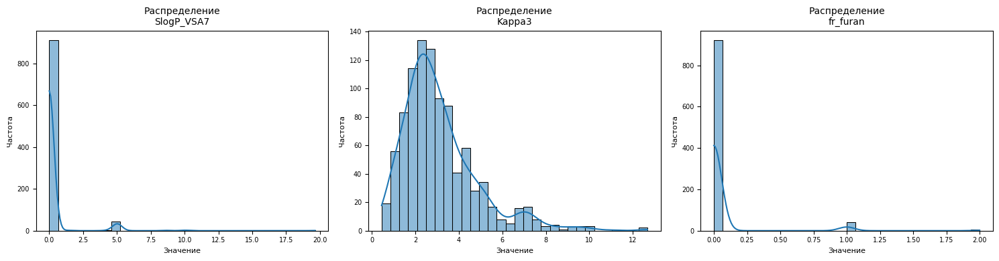

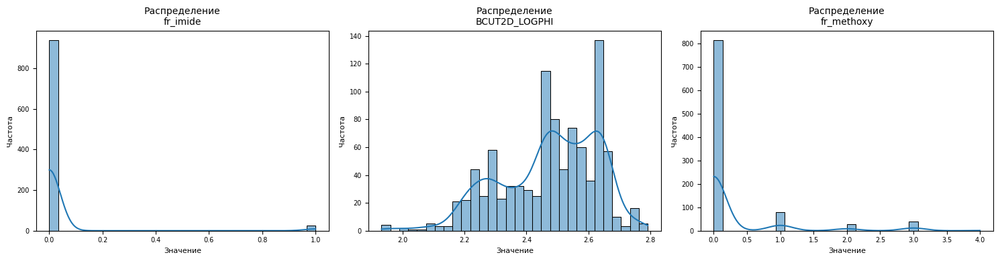

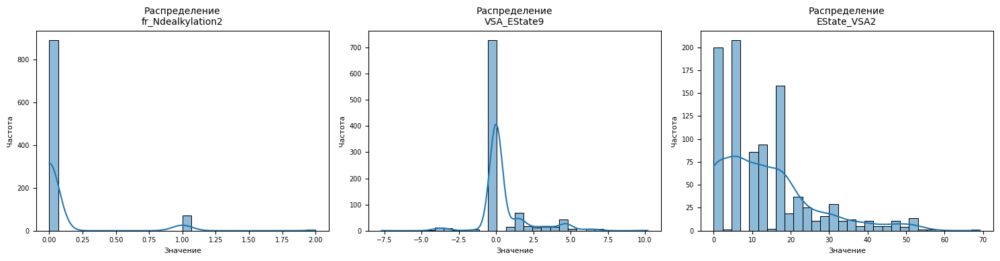

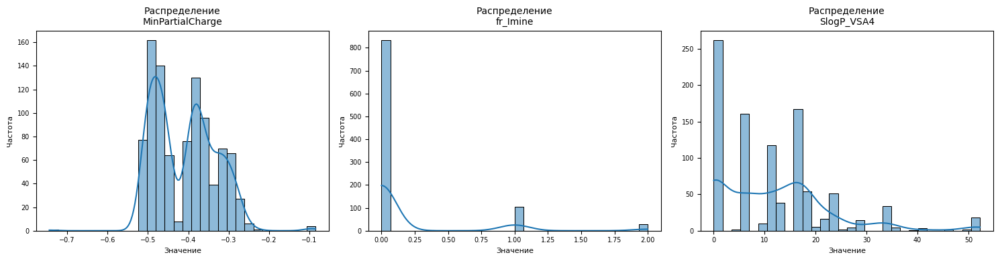

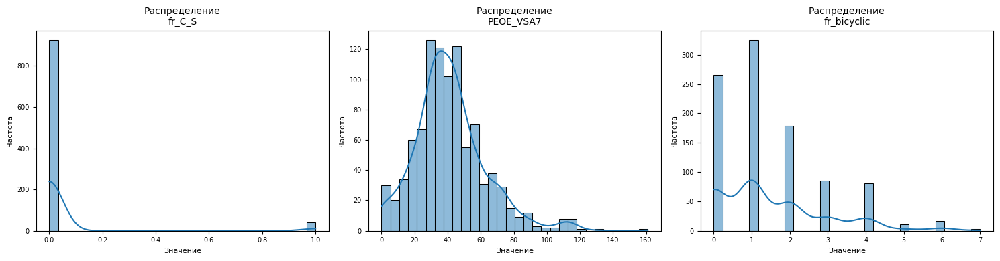

...

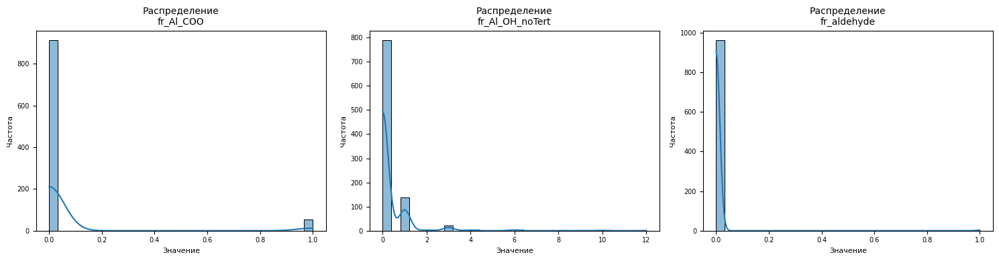

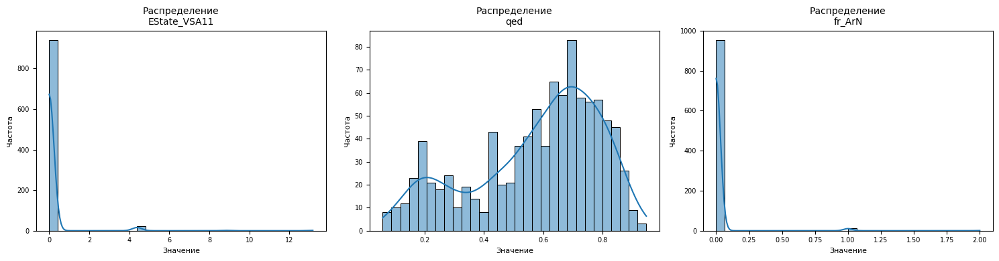

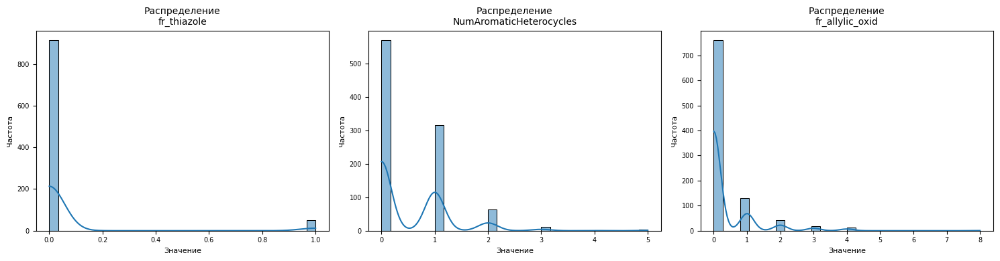

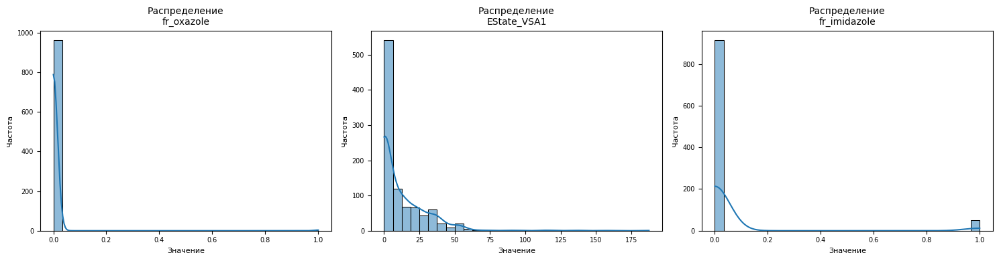

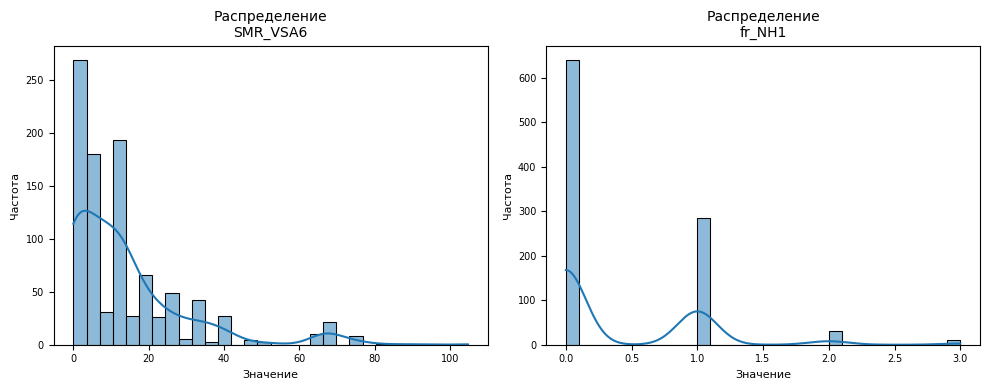

Построение графиков завершено.


In [66]:
# Визуализируем распределение получееных признаков
print(f"Начинаем построение графиков для {len(common_features_list)} признаков, отобранных Lasso...")

n_charts_per_row = 3  # Количество графиков в одной строке

# Итерируем по списку признаков, беря по 'n_charts_per_row' за раз
for i in range(0, len(common_features_list), n_charts_per_row):
    # Выбираем "кусок" (chunk) признаков для текущей строки графиков
    chunk = common_features_list[i:i + n_charts_per_row]

    # Создаем фигуру и оси для текущего "куска"
    # Количество столбцов на графике равно len(chunk), чтобы точно соответствовать признакам
    fig, axes = plt.subplots(1, len(chunk), figsize=(5 * len(chunk), 4)) # Увеличиваем ширину для читаемости

    # Если chunk содержит только один признак, axes не будет массивом, поэтому оборачиваем его
    if len(chunk) == 1:
        axes = [axes]

    # Построение гистограммы для каждого признака в текущем "куске"
    for j, col_name in enumerate(chunk):
        # Проверяем, существует ли столбец в DataFrame перед попыткой построения
        if col_name in df_clr.columns:
            sns.histplot(df_clr[col_name].dropna(), kde=True, bins=30, ax=axes[j])
            axes[j].set_title(f'Распределение\n{col_name}', fontsize=10) # Уменьшаем шрифт заголовка
            axes[j].set_xlabel('Значение', fontsize=8)
            axes[j].set_ylabel('Частота', fontsize=8)
            axes[j].tick_params(axis='both', which='major', labelsize=7) # Уменьшаем шрифт меток осей
        else:
            # Если по какой-то причине признака нет в df_clr, выводим предупреждение
            axes[j].set_title(f'Признак "{col_name}" не найден', fontsize=10, color='red')
            axes[j].set_xticks([])
            axes[j].set_yticks([])

    plt.tight_layout() # Автоматическая корректировка макета для предотвращения наложений
    plt.show() # Показываем текущую порцию графиков

print("Построение графиков завершено.")

Распределение в отобранных признаков, стоит предобработать. но так как в данных судя по всему есть не ленейная связь - попробуем использовать деревья решений. Эти данные пока оставим как есть.

In [68]:
# Деревьях решений

def run_random_forest_feature_selection(df, target_col_name, n_estimators=100, top_n_features=50):
    """
    Выполняет Random Forest регрессию, оценивает важность признаков
    и выводит метрики производительности.
        df (pd.DataFrame): DataFrame, содержащий признаки и целевую переменную.
        target_col_name (str): Название целевой переменной.
        n_estimators (int): Количество деревьев в лесу (по умолчанию 100).
        top_n_features (int): Количество лучших признаков для вывода и визуализации.
    """
    print(f"\n===== Обработка для целевой переменной: {target_col_name} =====")

    # Разделение на признаки (X) и целевую переменную (y)
    X = df.drop(columns=[target_col_name])
    y = df[target_col_name]

    # Разделение на обучающую и тестовую выборки
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    print(f"Размер обучающей выборки (X_train): {X_train.shape}")
    print(f"Размер тестовой выборки (X_test): {X_test.shape}")

    # Создание и обучение модели Random Forest Regressor
    # n_jobs=-1 использует все доступные ядра процессора
    # random_state для воспроизводимости
    print(f"Обучение RandomForestRegressor с n_estimators={n_estimators}...")
    rf_model = RandomForestRegressor(n_estimators=n_estimators, random_state=42, n_jobs=-1, oob_score=True)
    rf_model.fit(X_train, y_train)

    # Оценка производительности модели на тестовой выборке
    y_pred = rf_model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"\nМетрики производительности на тестовой выборке:")
    print(f"Mean Squared Error (MSE): {mse:.4f}")
    print(f"R-squared (R2): {r2:.4f}")
    print(f"OOB (Out-of-Bag) Score: {rf_model.oob_score_:.4f}") # OOB score - это внутренняя кросс-валидация RF

    # Получение важности признаков
    feature_importances = pd.Series(rf_model.feature_importances_, index=X.columns)
    sorted_importances = feature_importances.sort_values(ascending=False)

    print(f"\nТоп {top_n_features} наиболее важных признаков для {target_col_name}:")
    print(sorted_importances.head(top_n_features))

    # Визуализация топ N признаков
    plt.figure(figsize=(12, 8))
    sns.barplot(x=sorted_importances.head(top_n_features).values, y=sorted_importances.head(top_n_features).index)
    plt.title(f'Топ {top_n_features} важных признаков для {target_col_name} (Random Forest)')
    plt.xlabel('Важность признака (Gini Importance)')
    plt.ylabel('Признак')
    plt.tight_layout()
    plt.show()

    return sorted_importances, {'mse': mse, 'r2': r2, 'oob_score': rf_model.oob_score_}


===== Обработка для целевой переменной: log_IC50, mM =====
Размер обучающей выборки (X_train): (773, 150)
Размер тестовой выборки (X_test): (194, 150)
Обучение RandomForestRegressor с n_estimators=100...

Метрики производительности на тестовой выборке:
Mean Squared Error (MSE): 0.4978
R-squared (R2): 0.3921
OOB (Out-of-Bag) Score: 0.4591

Топ 50 наиболее важных признаков для log_IC50, mM:
VSA_EState6          0.119974
VSA_EState8          0.107425
VSA_EState4          0.041272
AvgIpc               0.039753
BCUT2D_MRLOW         0.032846
MolLogP              0.028738
MinEStateIndex       0.025522
BCUT2D_MWLOW         0.025128
NHOHCount            0.017148
PEOE_VSA7            0.016868
FpDensityMorgan3     0.016246
EState_VSA5          0.016147
MinPartialCharge     0.016055
VSA_EState7          0.015148
VSA_EState5          0.014892
BCUT2D_LOGPLOW       0.014863
Kappa3               0.014436
FpDensityMorgan1     0.014068
qed                  0.013986
MinAbsEStateIndex    0.013951
EState_

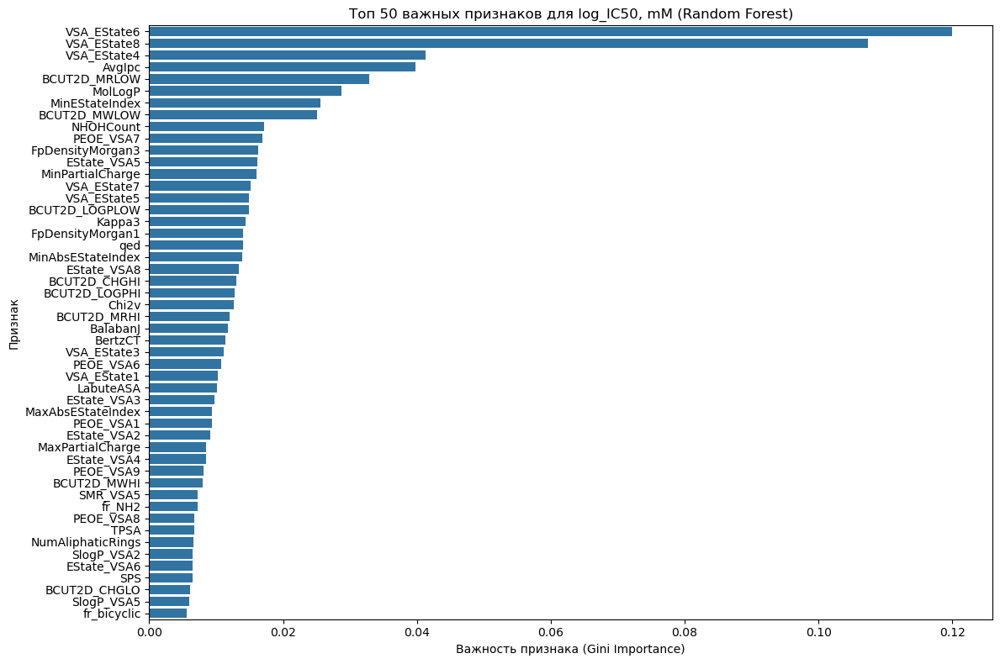

In [69]:
# Для log_IC50, mM
rf_importances_ic50, rf_metrics_ic50 = run_random_forest_feature_selection(df_ic50_lasso, 'log_IC50, mM', top_n_features=50)


===== Обработка для целевой переменной: log_CC50, mM =====
Размер обучающей выборки (X_train): (773, 150)
Размер тестовой выборки (X_test): (194, 150)
Обучение RandomForestRegressor с n_estimators=100...

Метрики производительности на тестовой выборке:
Mean Squared Error (MSE): 0.3002
R-squared (R2): 0.4491
OOB (Out-of-Bag) Score: 0.4143

Топ 50 наиболее важных признаков для log_CC50, mM:
BCUT2D_MWLOW         0.066700
NHOHCount            0.058626
Kappa3               0.043853
VSA_EState6          0.038399
LabuteASA            0.036418
BCUT2D_MRLOW         0.034559
SPS                  0.030275
PEOE_VSA7            0.026207
VSA_EState8          0.024330
BalabanJ             0.023137
MolLogP              0.021060
BertzCT              0.019670
PEOE_VSA6            0.019128
BCUT2D_LOGPHI        0.018447
AvgIpc               0.017444
VSA_EState4          0.014797
MinAbsEStateIndex    0.013621
BCUT2D_CHGLO         0.013355
BCUT2D_MRHI          0.013010
EState_VSA3          0.012434
FpDensi

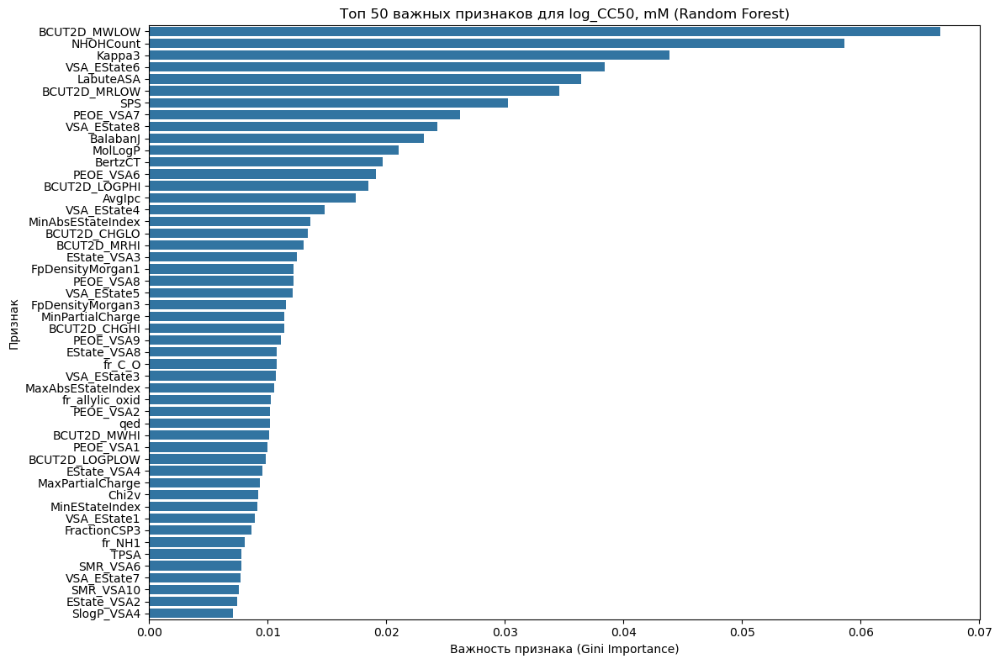

In [70]:
# Для log_CC50, mM
rf_importances_cc50, rf_metrics_cc50 = run_random_forest_feature_selection(df_cc50_lasso, 'log_CC50, mM', top_n_features=50)


===== Обработка для целевой переменной: log_SI =====
Размер обучающей выборки (X_train): (773, 150)
Размер тестовой выборки (X_test): (194, 150)
Обучение RandomForestRegressor с n_estimators=100...

Метрики производительности на тестовой выборке:
Mean Squared Error (MSE): 0.5067
R-squared (R2): 0.1098
OOB (Out-of-Bag) Score: 0.2871

Топ 50 наиболее важных признаков для log_SI:
VSA_EState6          0.085270
BCUT2D_LOGPHI        0.051340
FractionCSP3         0.036104
BCUT2D_MRLOW         0.032215
VSA_EState8          0.031703
qed                  0.031399
AvgIpc               0.024690
BertzCT              0.024382
BalabanJ             0.021664
VSA_EState4          0.021330
SlogP_VSA5           0.021260
MaxAbsEStateIndex    0.019496
BCUT2D_CHGHI         0.018163
Kappa3               0.017481
BCUT2D_CHGLO         0.017056
MinEStateIndex       0.016717
VSA_EState7          0.016224
MinAbsEStateIndex    0.015760
RingCount            0.015581
MolLogP              0.015402
PEOE_VSA7          

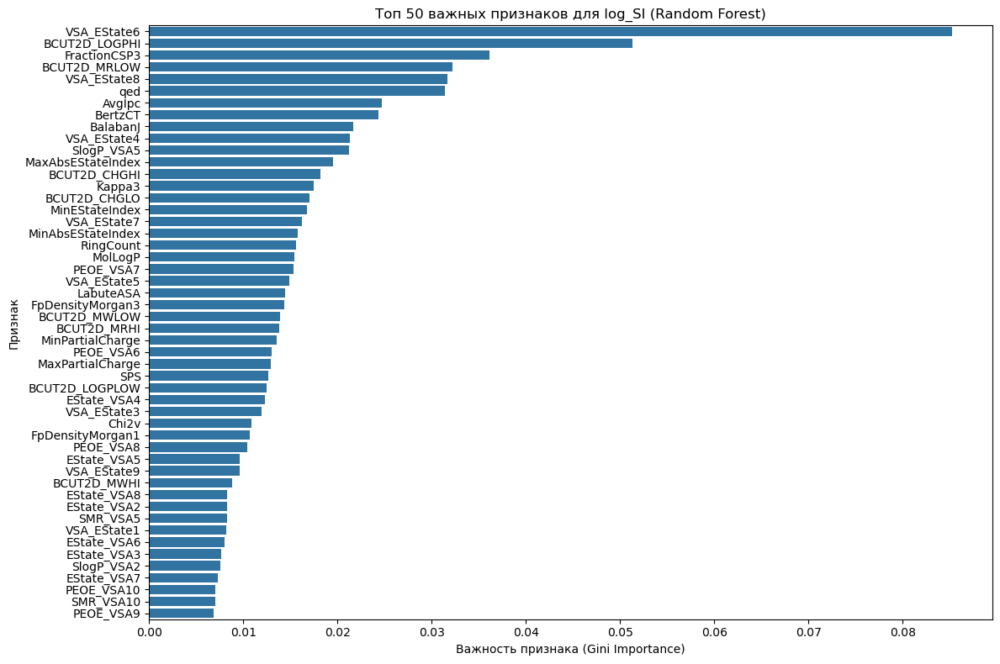

In [71]:
# Для log_SI
rf_importances_si, rf_metrics_si = run_random_forest_feature_selection(df_si_lasso, 'log_SI', top_n_features=50)

In [72]:
# Извлекаем топ-50 признаков для каждой модели (только имена)
top50_ic50 = rf_importances_ic50.head(50).index.tolist()  # Для IC50
top50_cc50 = rf_importances_cc50.head(50).index.tolist()  # Для CC50
top50_si = rf_importances_si.head(50).index.tolist()      # Для SI

In [73]:
# Находим пересечение всех трёх топ-50
common_top50 = set(top50_ic50) & set(top50_cc50) & set(top50_si)
common_top50_list = sorted(common_top50)  # Сортируем для удобства

# Выводим результат
print(f"Количество общих признаков в топ-50 всех трёх моделей: {len(common_top50_list)}")
print("\nСписок общих признаков:")
for feature in common_top50_list:
    print(f"- {feature}")

Количество общих признаков в топ-50 всех трёх моделей: 39

Список общих признаков:
- AvgIpc
- BCUT2D_CHGHI
- BCUT2D_CHGLO
- BCUT2D_LOGPHI
- BCUT2D_LOGPLOW
- BCUT2D_MRHI
- BCUT2D_MRLOW
- BCUT2D_MWHI
- BCUT2D_MWLOW
- BalabanJ
- BertzCT
- Chi2v
- EState_VSA2
- EState_VSA3
- EState_VSA4
- EState_VSA8
- FpDensityMorgan1
- FpDensityMorgan3
- Kappa3
- LabuteASA
- MaxAbsEStateIndex
- MaxPartialCharge
- MinAbsEStateIndex
- MinEStateIndex
- MinPartialCharge
- MolLogP
- PEOE_VSA6
- PEOE_VSA7
- PEOE_VSA8
- PEOE_VSA9
- SPS
- VSA_EState1
- VSA_EState3
- VSA_EState4
- VSA_EState5
- VSA_EState6
- VSA_EState7
- VSA_EState8
- qed


### Вывод: 
Применение модели Random Forest демонстрирует заметное улучшение метрики R-squared (R2) по сравнению с Lasso-регрессией для всех трех целевых переменных:

Это улучшение R2 явно указывает на то, что Random Forest улавливает большую долю дисперсии в данных, чем линейная модель Lasso. Это, в свою очередь, подтверждает наличие нелинейных зависимостей между признаками и целевыми переменными.

Различия в отобранных признаках
Список наиболее важных признаков, отобранных Random Forest, отличается от списка признаков, выбранных Lasso-регрессией. Это ожидаемо, поскольку Lasso фокусируется на линейных взаимосвязях и обнуляет коэффициенты наименее значимых признаков. В то время как Random Forest оценивает важность признаков на основе их вклада в снижение неопределенности в деревьях, что позволяет выявлять как линейные, так и нелинейные зависимости.

Общие важные признаки (пересечение топ-50 списков Random Forest для всех трех целевых переменных)
Было выявлено 39 общих признаков, которые вошли в топ-50 для всех трех моделей. Эти признаки являются наиболее стабильно значимыми для прогнозирования IC50, CC50 и SI:

* AvgIpc: Средний индекс информации о плотности. Отражает степень разветвленности и сложности молекулярной структуры.
* BCUT2D_CHGHI: BCUT-дескриптор, связанный с зарядом (высокое значение). Характеризует распределение заряда в молекуле.
* BCUT2D_CHGLO: BCUT-дескриптор, связанный с зарядом (низкое значение). Дополняет информацию о распределении заряда.
* BCUT2D_LOGPHI: BCUT-дескриптор, связанный с логарифмом коэффициента распределения (высокое значение). Отражает липофильность молекулы.
* BCUT2D_LOGPLOW: BCUT-дескриптор, связанный с логарифмом коэффициента распределения (низкое значение). Дополняет информацию о липофильности.
* BCUT2D_MRHI: BCUT-дескриптор, связанный с молярной рефрактивностью (высокое значение). Показывает объем и поляризуемость молекулы.
* BCUT2D_MRLOW: BCUT-дескриптор, связанный с молярной рефрактивностью (низкое значение). Дополняет информацию об объеме и поляризуемости.
* BCUT2D_MWHI: BCUT-дескриптор, связанный с молекулярным весом (высокое значение).
* BCUT2D_MWLOW: BCUT-дескриптор, связанный с молекулярным весом (низкое значение).
* BalabanJ: Топологический индекс Бальбана. Характеризует степень связности и цикличности молекулы.
* BertzCT: Индекс связности Берца. Отражает структурную сложность и разнообразие окружения атомов.
* Chi2v: Индекс связности (второго порядка, валентно-корректированный). Описывает разветвленность и форму молекулы.
* EState_VSA2: VSA-дескриптор, связанный с электронной структурой и площадью поверхности.
* EState_VSA3: VSA-дескриптор, связанный с электронной структурой и площадью поверхности.
* EState_VSA4: VSA-дескриптор, связанный с электронной структурой и площадью поверхности.
* EState_VSA8: VSA-дескриптор, связанный с электронной структурой и площадью поверхности.
* FpDensityMorgan1: Дескриптор плотности отпечатков пальцев Morgan (радиус 1). Отражает структурную сложность и разнообразие окружения атомов в молекуле.
* FpDensityMorgan3: Дескриптор плотности отпечатков пальцев Morgan (радиус 3). Дает более широкий взгляд на локальное окружение атомов.
* Kappa3: Дескриптор формы молекулы, характеризующий её компактность. Может быть важен для понимания пространственной организации молекулы, которая влияет на связывание с мишенью.
* LabuteASA: Площадь доступной поверхности по Лабуте. Показатель размера и потенциала для межмолекулярных взаимодействий.
* MaxAbsEStateIndex: Максимальное абсолютное значение индекса E-state.
* MaxPartialCharge: Максимальный парциальный заряд в молекуле.
* MinAbsEStateIndex: Минимальное абсолютное значение индекса E-state.
* MinEStateIndex: Минимальное значение индекса E-state.
* MinPartialCharge: Минимальный парциальный заряд в молекуле. Важен для электростатических взаимодействий.
* MolLogP: Логарифм коэффициента распределения октанол-вода. Фундаментальный показатель липофильности.
* PEOE_VSA6: VSA-дескриптор, основанный на частичном заряде и площади поверхности.
* PEOE_VSA7: VSA-дескриптор, основанный на частичном заряде и площади поверхности.
* PEOE_VSA8: VSA-дескриптор, основанный на частичном заряде и площади поверхности.
* PEOE_VSA9: VSA-дескриптор, основанный на частичном заряде и площади поверхности.
* SPS: Индекс Сперлича. Характеризует степень разветвленности.
* VSA_EState1: VSA-дескриптор, связанный с электронной структурой и площадью поверхности.
* VSA_EState3: VSA-дескриптор, связанный с электронной структурой и площадью поверхности.
* VSA_EState4: VSA-дескриптор, связанный с электронной структурой и площадью поверхности.
* VSA_EState5: VSA-дескриптор, связанный с электронной структурой и площадью поверхности.
* VSA_EState6: VSA-дескриптор, связанный с электронной структурой и площадью поверхности.
* VSA_EState7: VSA-дескриптор, связанный с электронной структурой и площадью поверхности.
* VSA_EState8: VSA-дескриптор, связанный с электронной структурой и площадью поверхности.
* qed: Количественная оценка лекарственного потенциала молекулы (quantitative estimate of drug-likeness). Является интегральной оценкой лекарственного потенциала молекулы.
### Ключевые выводы по общим признакам
Список общих признаков, отобранных Random Forest, включает в себя широкий спектр физико-химических и топологических дескрипторов, в отличие от Lasso, где преобладали фрагментные. Это указывает на то, что для моделей Random Forest важны не только наличие конкретных функциональных групп, но и общие свойства молекулы, такие как:

Распределение заряда (BCUT2D_CHG, PEOE_VSA): Влияет на электростатические взаимодействия с мишенями.
Липофильность (BCUT2D_LOGP, MolLogP): Критична для проницаемости через мембраны и взаимодействия с гидрофобными участками.
Размер и форма (Kappa3, LabuteASA, BCUT2D_MR, BCUT2D_MW): Определяют, насколько хорошо молекула "вписывается" в активный центр белка.
Электронные свойства (EState_VSA, VSA_EState): Отражают реакционную способность и поляризуемость.
Топологическая сложность (BalabanJ, BertzCT, Chi2v, FpDensityMorgan): Характеризуют разветвленность и разнообразие связей.
Присутствие qed в списке подчеркивает его важность как интегрального показателя лекарственного потенциала. Эти 39 признаков являются наиболее  информативными для прогнозирования биологической активности в контексте данной задачи, поскольку они были последовательно выбраны Random Forest для всех трех целевых переменных.

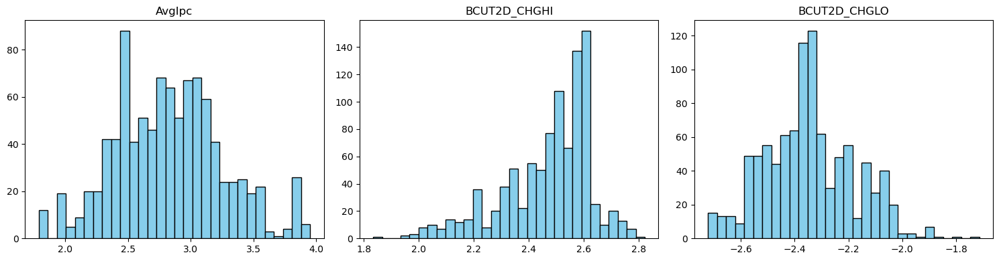

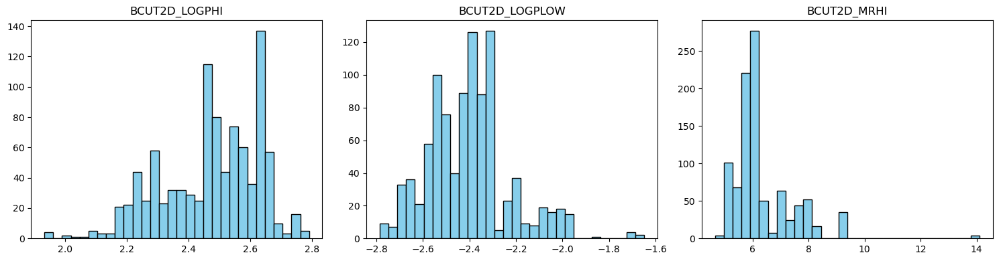

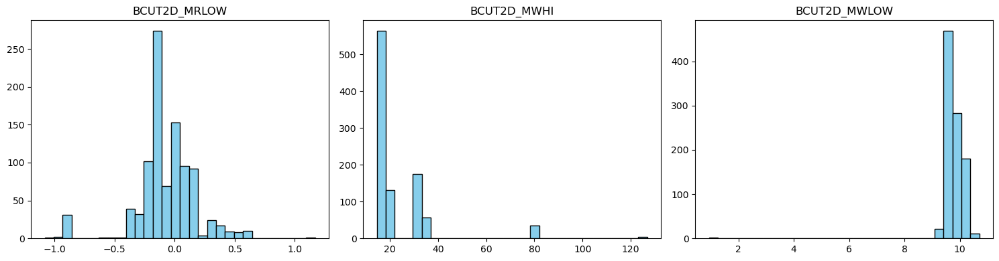

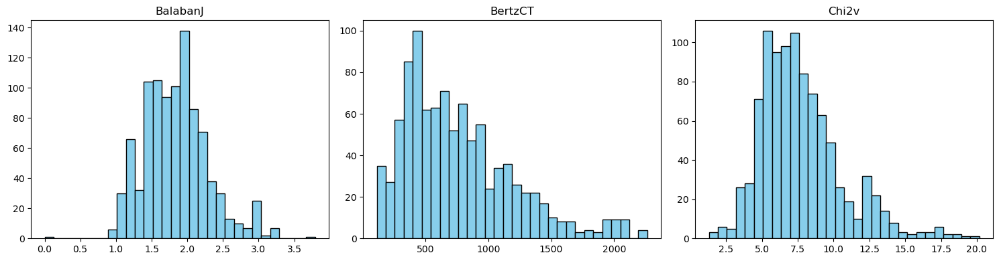

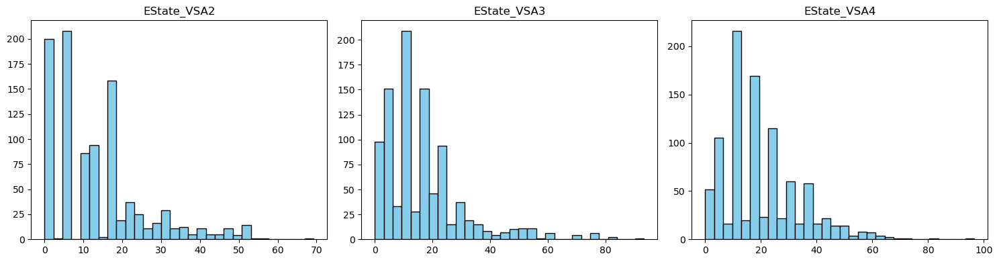

...

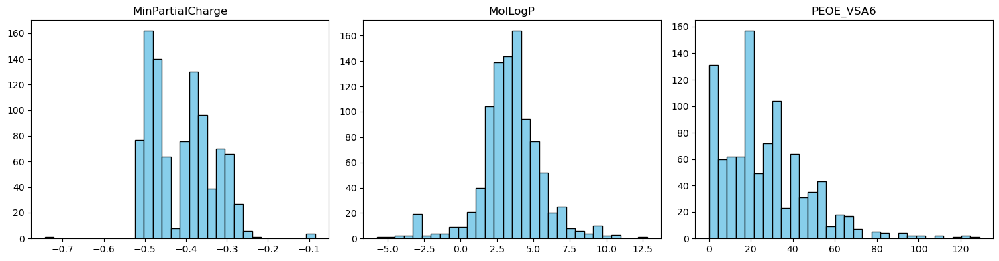

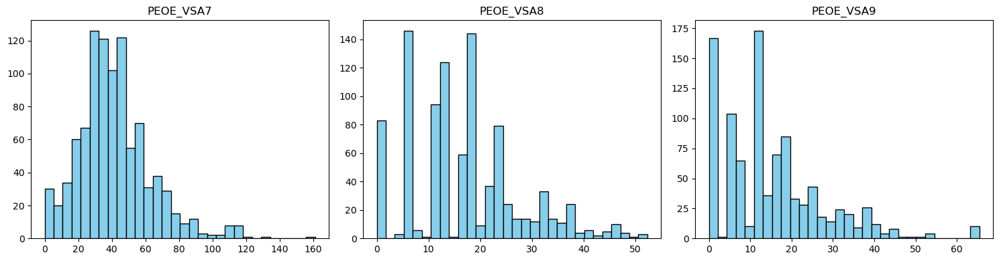

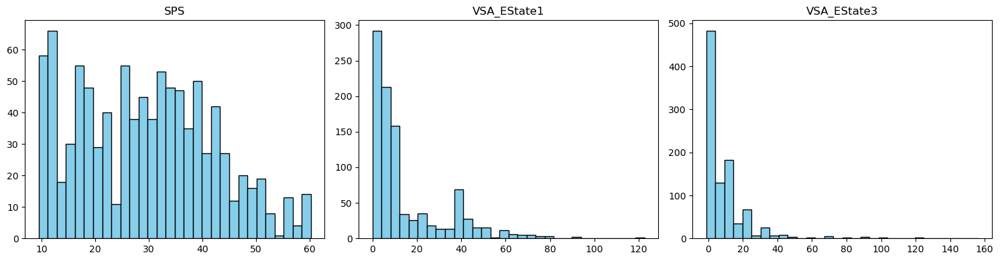

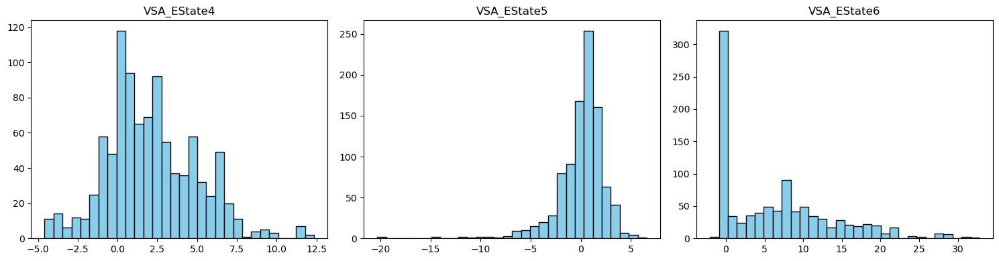

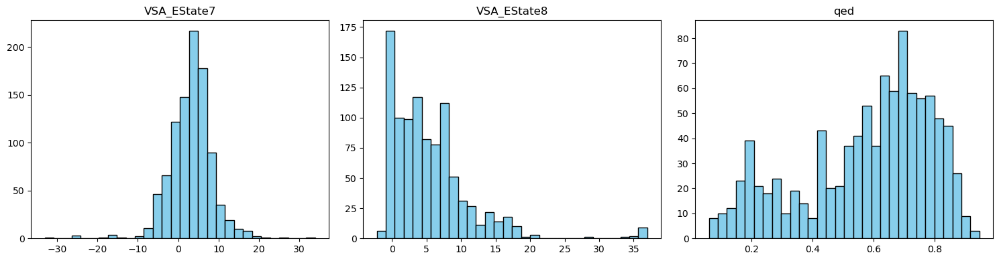

In [75]:
import matplotlib.pyplot as plt

n = 3  # Графиков за раз
for i in range(0, len(common_top50_list), n):
    chunk = common_top50_list[i:i+n]
    fig, axes = plt.subplots(1, len(chunk), figsize=(15, 4))
    
    for j, feature in enumerate(chunk):
        axes[j].hist(df_clr[feature], bins=30, color='skyblue', edgecolor='black')
        axes[j].set_title(feature)
    
    plt.tight_layout()
    plt.show()

In [76]:
combined_features_set = set(common_top50_list + common_features_list)

# Преобразуем обратно в список (порядок не гарантируется)
combined_features = list(combined_features_set)

# Сортируем список для удобства 
combined_features.sort()

print(f"Количество признаков, отобранных Lasso: {len(common_features_list)}")
print(f"Количество признаков, отобранных Random Forest (топ-50): {len(common_top50_list)}")
print(f"\nОбщее количество уникальных признаков после объединения: {len(combined_features)}")
print("\nОбъединенный список уникальных признаков:")
for feature in combined_features:
    print(f"- {feature}")

Количество признаков, отобранных Lasso: 35
Количество признаков, отобранных Random Forest (топ-50): 39

Общее количество уникальных признаков после объединения: 68

Объединенный список уникальных признаков:
- AvgIpc
- BCUT2D_CHGHI
- BCUT2D_CHGLO
- BCUT2D_LOGPHI
- BCUT2D_LOGPLOW
- BCUT2D_MRHI
- BCUT2D_MRLOW
- BCUT2D_MWHI
- BCUT2D_MWLOW
- BalabanJ
- BertzCT
- Chi2v
- EState_VSA1
- EState_VSA11
- EState_VSA2
- EState_VSA3
- EState_VSA4
- EState_VSA5
- EState_VSA8
- FpDensityMorgan1
- FpDensityMorgan3
- Kappa3
- LabuteASA
- MaxAbsEStateIndex
- MaxPartialCharge
- MinAbsEStateIndex
- MinEStateIndex
- MinPartialCharge
- MolLogP
- NumAromaticHeterocycles
- PEOE_VSA6
- PEOE_VSA7
- PEOE_VSA8
- PEOE_VSA9
- SMR_VSA6
- SPS
- SlogP_VSA3
- SlogP_VSA4
- SlogP_VSA7
- VSA_EState1
- VSA_EState3
- VSA_EState4
- VSA_EState5
- VSA_EState6
- VSA_EState7
- VSA_EState8
- VSA_EState9
- fr_Al_COO
- fr_Al_OH_noTert
- fr_ArN
- fr_Ar_NH
- fr_C_S
- fr_Imine
- fr_NH1
- fr_NH2
- fr_Ndealkylation2
- fr_aldehyde
- fr_al

Как видно по графикам, некоторые переменные у нас распределены неравномерно, преобразуем их. Так как удаление выбросов или их дальнейшее преобразование может в целом кардинально поменять работу модели, а также усложнить интерпретацию то попробуем преобразовать эти переменные с помощью Yeo-Johnson

In [78]:
df_clr

,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MaxPartialCharge,MinPartialCharge,FpDensityMorgan1,FpDensityMorgan3,BCUT2D_MWHI,...,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea,"log_IC50, mM","log_CC50, mM",log_SI
0,5.094096,0.387225,0.387225,0.417362,42.928571,0.038844,-0.293526,0.642857,1.321429,14.822266,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.795141,2.244234,1.449093
1,3.961417,0.533868,0.533868,0.462473,45.214286,0.012887,-0.313407,0.607143,1.285714,14.975110,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,-0.112478,0.732620,0.845098
2,2.627117,0.543231,0.543231,0.260923,42.187500,0.094802,-0.325573,0.562500,1.156250,15.353938,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,2.349877,2.207210,-0.142668
3,5.097360,0.390603,0.390603,0.377846,41.862069,0.038844,-0.293526,0.620690,1.310345,14.821216,...,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.231883,2.032843,1.800960
4,5.150510,0.270476,0.270476,0.429038,36.514286,0.062897,-0.257239,0.600000,1.257143,14.831112,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.029917,2.143861,0.113943
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,12.934891,0.048029,-0.476142,0.382752,49.133333,0.317890,-0.468587,1.133333,2.533333,16.586886,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.491363,1.544064,0.052701
997,13.635345,0.030329,-0.699355,0.369425,44.542857,0.327562,-0.467493,1.085714,2.457143,16.586914,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.505149,1.531471,0.026322
998,13.991690,0.026535,-0.650790,0.284923,41.973684,0.327887,-0.467485,1.157895,2.552632,32.166365,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.491360,1.531472,0.040112
999,13.830180,0.146522,-1.408652,0.381559,39.000000,0.312509,-0.468755,0.756757,1.864865,16.540061,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.505136,1.518509,0.013373


In [79]:
# Список отобранных признаков для преобразования Yeo-Johnson
features_to_transform_yj = combined_features

print("Начинаем преобразование признаков с помощью Yeo-Johnson")

# Инициализируем PowerTransformer с методом 'yeo-johnson'
pt = PowerTransformer(method='yeo-johnson', standardize=False)

# Применяем преобразование к выбранным признакам и сохраняем их в новые столбцы в df_clr
for col in features_to_transform_yj:
    # PowerTransformer ожидает 2D-массив, поэтому используем df_clr[[col]]
    # Создаем новый столбец с префиксом 'yj_'
    df_clr[f'yj_{col}'] = pt.fit_transform(df_clr[[col]])

print("Преобразование Yeo-Johnson завершено. Новые столбцы с префиксом 'yj_' добавлены в df_clr.")

Начинаем преобразование признаков с помощью Yeo-Johnson
Преобразование Yeo-Johnson завершено. Новые столбцы с префиксом 'yj_' добавлены в df_clr.


In [80]:
df_clr

,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MaxPartialCharge,MinPartialCharge,FpDensityMorgan1,FpDensityMorgan3,BCUT2D_MWHI,...,yj_fr_amidine,yj_fr_bicyclic,yj_fr_furan,yj_fr_imidazole,yj_fr_imide,yj_fr_methoxy,yj_fr_oxazole,yj_fr_oxime,yj_fr_thiazole,yj_qed
0,5.094096,0.387225,0.387225,0.417362,42.928571,0.038844,-0.293526,0.642857,1.321429,14.822266,...,-0.0,1.518382,-0.0,-0.0,-0.0,-0.000000,-0.0,-0.0,-0.0,0.670105
1,3.961417,0.533868,0.533868,0.462473,45.214286,0.012887,-0.313407,0.607143,1.285714,14.975110,...,-0.0,1.518382,-0.0,-0.0,-0.0,-0.000000,-0.0,-0.0,-0.0,0.778728
2,2.627117,0.543231,0.543231,0.260923,42.187500,0.094802,-0.325573,0.562500,1.156250,15.353938,...,-0.0,1.518382,-0.0,-0.0,-0.0,-0.000000,-0.0,-0.0,-0.0,0.353277
3,5.097360,0.390603,0.390603,0.377846,41.862069,0.038844,-0.293526,0.620690,1.310345,14.821216,...,-0.0,1.518382,-0.0,-0.0,-0.0,-0.000000,-0.0,-0.0,-0.0,0.581556
4,5.150510,0.270476,0.270476,0.429038,36.514286,0.062897,-0.257239,0.600000,1.257143,14.831112,...,-0.0,1.518382,-0.0,-0.0,-0.0,-0.000000,-0.0,-0.0,-0.0,0.697438
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,12.934891,0.048029,-0.476142,0.382752,49.133333,0.317890,-0.468587,1.133333,2.533333,16.586886,...,-0.0,0.675882,-0.0,-0.0,-0.0,0.155415,-0.0,-0.0,-0.0,0.592224
997,13.635345,0.030329,-0.699355,0.369425,44.542857,0.327562,-0.467493,1.085714,2.457143,16.586914,...,-0.0,0.675882,-0.0,-0.0,-0.0,0.155415,-0.0,-0.0,-0.0,0.563459
998,13.991690,0.026535,-0.650790,0.284923,41.973684,0.327887,-0.467485,1.157895,2.552632,32.166365,...,-0.0,0.675882,-0.0,-0.0,-0.0,0.155415,-0.0,-0.0,-0.0,0.396211
999,13.830180,0.146522,-1.408652,0.381559,39.000000,0.312509,-0.468755,0.756757,1.864865,16.540061,...,-0.0,1.318376,-0.0,-0.0,-0.0,0.157330,-0.0,-0.0,-0.0,0.589622


Начинаем построение графиков для 68 преобразованных признаков...


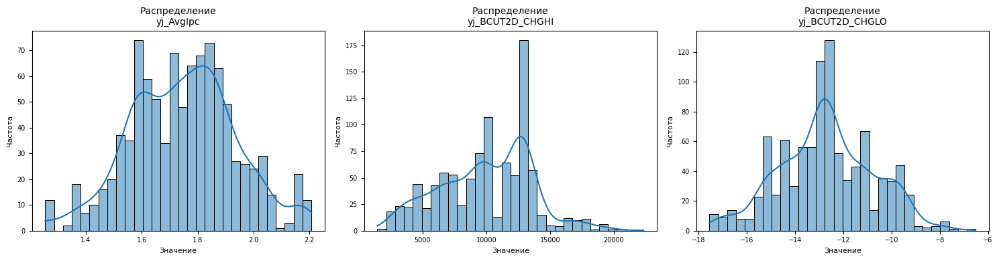

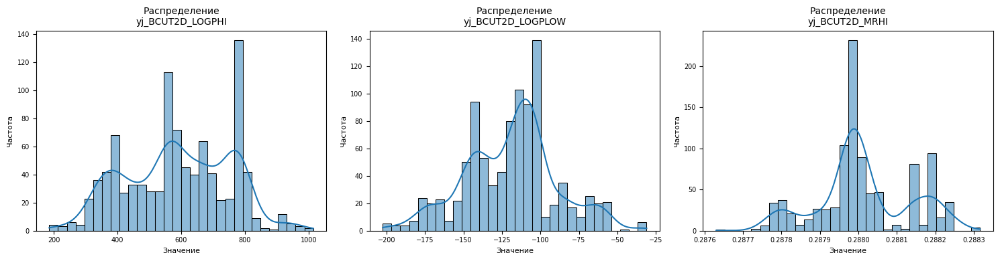

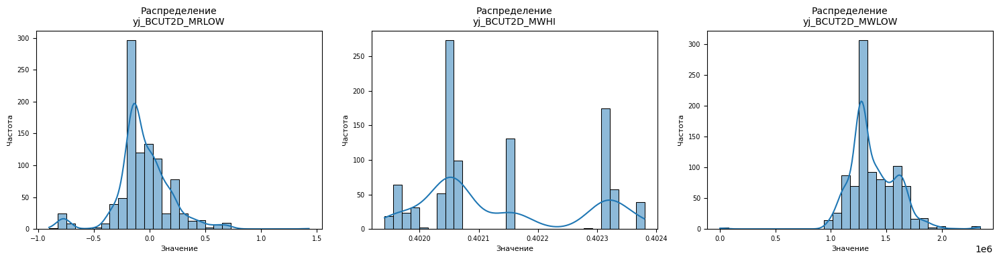

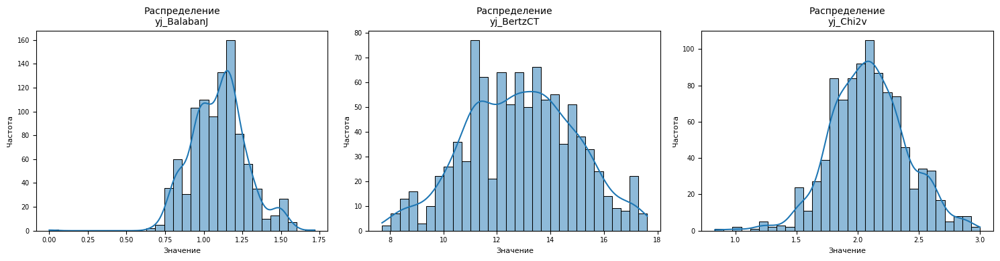

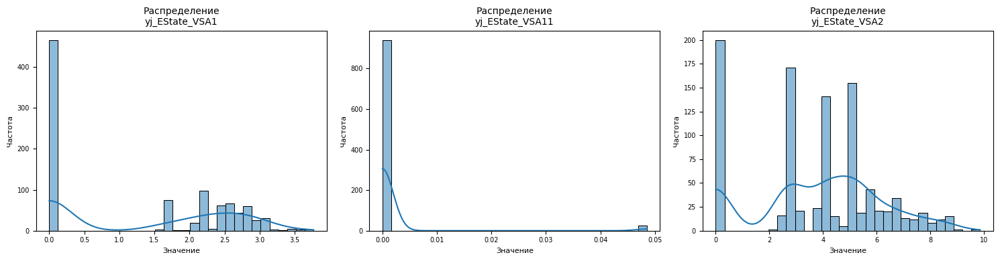

...

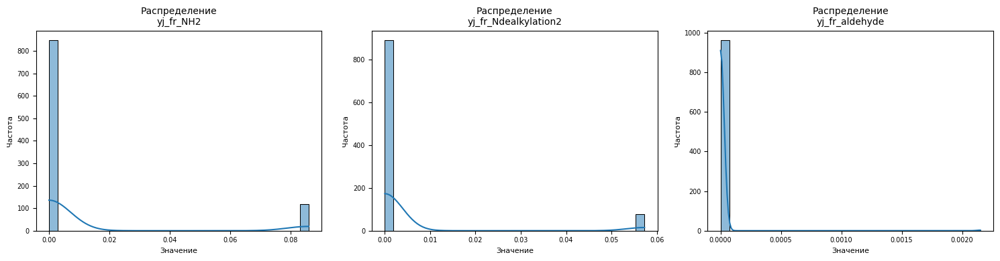

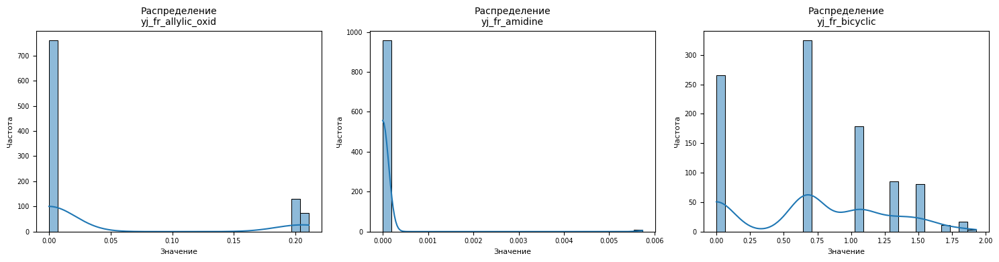

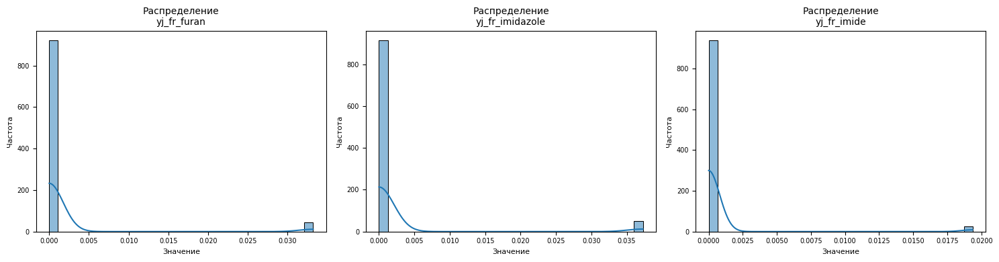

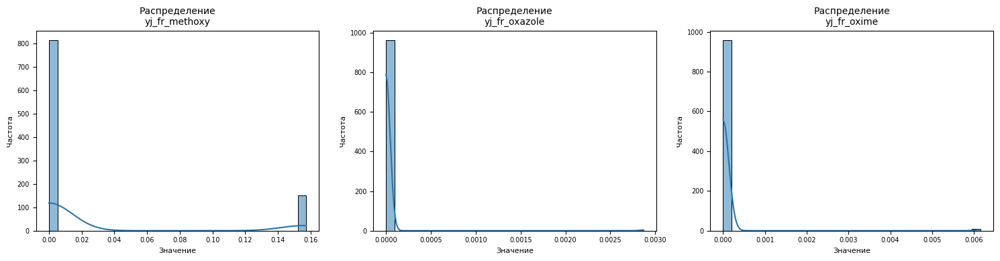

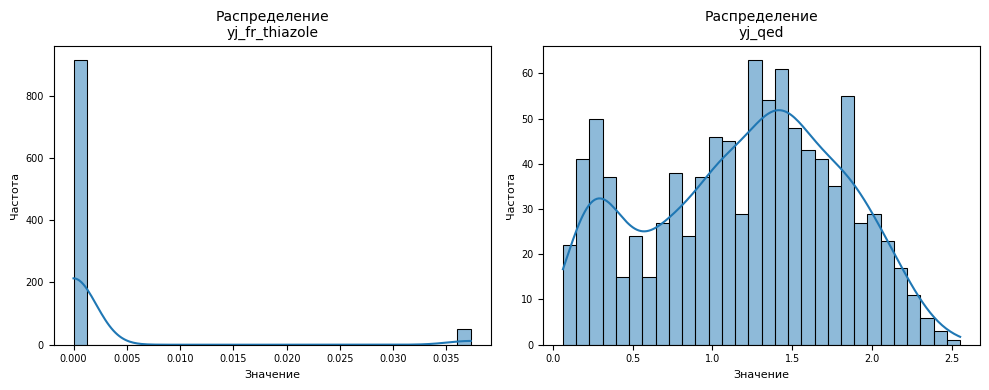

Построение графиков завершено.


In [81]:
# Визуализируем полученные признаки
# Создадим список имен преобразованных колонок
# Он будет содержать 'yj_AvgIpc', 'yj_BCUT2D_CHGHI' и т.д.
transformed_cols_to_plot = [f'yj_{col}' for col in combined_features]
print(f"Начинаем построение графиков для {len(transformed_cols_to_plot)} преобразованных признаков...")

n_charts_per_row = 3  # Количество графиков в одной строке

# Итерируем по списку преобразованных признаков, беря по 'n_charts_per_row' за раз
for i in range(0, len(transformed_cols_to_plot), n_charts_per_row):
    # Выбираем "кусок" (chunk) признаков для текущей строки графиков
    chunk = transformed_cols_to_plot[i:i + n_charts_per_row]

    # Создаем фигуру и оси для текущего "куска"
    # Количество столбцов на графике равно len(chunk), чтобы точно соответствовать признакам
    fig, axes = plt.subplots(1, len(chunk), figsize=(5 * len(chunk), 4)) # Увеличиваем ширину для читаемости

    # Если chunk содержит только один признак, axes не будет массивом, поэтому оборачиваем его
    if len(chunk) == 1:
        axes = [axes]

    # Построение гистограммы для каждого признака в текущем "куске"
    for j, col_name in enumerate(chunk):
        sns.histplot(df_clr[col_name].dropna(), kde=True, bins=30, ax=axes[j])
        axes[j].set_title(f'Распределение\n{col_name}', fontsize=10) #  шрифт заголовка
        axes[j].set_xlabel('Значение', fontsize=8)
        axes[j].set_ylabel('Частота', fontsize=8)
        axes[j].tick_params(axis='both', which='major', labelsize=7) #  шрифт меток осей

    plt.tight_layout() # Автоматическая корректировка макета для предотвращения наложений
    plt.show() # Показываем текущую порцию графиков

print("Построение графиков завершено.")

Как видим, уже лучше. перейдем к окончательному отбору признаков

In [83]:
# Выведем названия столбцов 
column_names = df_clr.columns.tolist()

print(column_names)

['MaxAbsEStateIndex', 'MinAbsEStateIndex', 'MinEStateIndex', 'qed', 'SPS', 'MaxPartialCharge', 'MinPartialCharge', 'FpDensityMorgan1', 'FpDensityMorgan3', 'BCUT2D_MWHI', 'BCUT2D_MWLOW', 'BCUT2D_CHGHI', 'BCUT2D_CHGLO', 'BCUT2D_LOGPHI', 'BCUT2D_LOGPLOW', 'BCUT2D_MRHI', 'BCUT2D_MRLOW', 'AvgIpc', 'BalabanJ', 'BertzCT', 'Chi2v', 'Kappa3', 'LabuteASA', 'PEOE_VSA1', 'PEOE_VSA10', 'PEOE_VSA11', 'PEOE_VSA12', 'PEOE_VSA13', 'PEOE_VSA14', 'PEOE_VSA2', 'PEOE_VSA3', 'PEOE_VSA4', 'PEOE_VSA5', 'PEOE_VSA6', 'PEOE_VSA7', 'PEOE_VSA8', 'PEOE_VSA9', 'SMR_VSA1', 'SMR_VSA10', 'SMR_VSA2', 'SMR_VSA3', 'SMR_VSA4', 'SMR_VSA5', 'SMR_VSA6', 'SlogP_VSA1', 'SlogP_VSA10', 'SlogP_VSA11', 'SlogP_VSA12', 'SlogP_VSA2', 'SlogP_VSA3', 'SlogP_VSA4', 'SlogP_VSA5', 'SlogP_VSA7', 'SlogP_VSA8', 'TPSA', 'EState_VSA1', 'EState_VSA10', 'EState_VSA11', 'EState_VSA2', 'EState_VSA3', 'EState_VSA4', 'EState_VSA5', 'EState_VSA6', 'EState_VSA7', 'EState_VSA8', 'EState_VSA9', 'VSA_EState1', 'VSA_EState3', 'VSA_EState4', 'VSA_EState5', '

***Создадим конечный дата фрейм и приступим к построению моделей.*** 

In [85]:
# Перопределяем целевые переменные
target_cols = ['log_IC50, mM', 'log_CC50, mM', 'log_SI']

# Список для хранения названий столбцов, которые мы хотим сохранить
columns_to_keep = []

for col in column_names:
    # Оставляем целевые переменные
    if col in target_cols:
        columns_to_keep.append(col)
        continue

    # Оставляем только те признаки, которые начинаются с 'yj_'
    if col.startswith('yj_'):
        columns_to_keep.append(col)

# Создаем новый DataFrame, содержащий только нужные столбцы
df_final_for_models = df_clr[columns_to_keep].copy() # для избежания 

In [86]:
print(f"\nИсходное количество столбцов: {len(column_names)}") # Используем len(column_names) для исходного
print(f"Количество столбцов, которые были сохранены: {len(columns_to_keep)}")
print(f"Новое количество столбцов после фильтрации: {df_final_for_models.shape[1]}")

df_final_for_models


Исходное количество столбцов: 221
Количество столбцов, которые были сохранены: 71
Новое количество столбцов после фильтрации: 71


,"log_IC50, mM","log_CC50, mM",log_SI,yj_AvgIpc,yj_BCUT2D_CHGHI,yj_BCUT2D_CHGLO,yj_BCUT2D_LOGPHI,yj_BCUT2D_LOGPLOW,yj_BCUT2D_MRHI,yj_BCUT2D_MRLOW,...,yj_fr_amidine,yj_fr_bicyclic,yj_fr_furan,yj_fr_imidazole,yj_fr_imide,yj_fr_methoxy,yj_fr_oxazole,yj_fr_oxime,yj_fr_thiazole,yj_qed
0,0.795141,2.244234,1.449093,1.891539,12945.927537,-12.564708,781.457472,-102.169788,0.287992,0.201542,...,-0.0,1.518382,-0.0,-0.0,-0.0,-0.000000,-0.0,-0.0,-0.0,0.670105
1,-0.112478,0.732620,0.845098,1.891539,13396.387198,-13.179289,801.006823,-123.543751,0.287806,0.123479,...,-0.0,1.518382,-0.0,-0.0,-0.0,-0.000000,-0.0,-0.0,-0.0,0.778728
2,2.349877,2.207210,-0.142668,1.918170,15229.677128,-14.202252,831.415044,-147.917520,0.287800,-0.788074,...,-0.0,1.518382,-0.0,-0.0,-0.0,-0.000000,-0.0,-0.0,-0.0,0.353277
3,0.231883,2.032843,1.800960,1.903458,12945.814960,-12.562394,781.473002,-102.137745,0.287992,0.201574,...,-0.0,1.518382,-0.0,-0.0,-0.0,-0.000000,-0.0,-0.0,-0.0,0.581556
4,2.029917,2.143861,0.113943,1.967958,13010.104973,-12.552134,786.825887,-101.632901,0.287996,0.201765,...,-0.0,1.518382,-0.0,-0.0,-0.0,-0.000000,-0.0,-0.0,-0.0,0.697438
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,1.491363,1.544064,0.052701,1.838409,17701.105583,-16.896756,925.382459,-166.520306,0.287999,-0.188520,...,-0.0,0.675882,-0.0,-0.0,-0.0,0.155415,-0.0,-0.0,-0.0,0.592224
997,1.505149,1.531471,0.026322,1.883411,17671.042184,-16.926987,924.857517,-168.664563,0.287999,-0.180419,...,-0.0,0.675882,-0.0,-0.0,-0.0,0.155415,-0.0,-0.0,-0.0,0.563459
998,1.491360,1.531472,0.040112,1.913769,17682.965684,-16.927846,925.165254,-168.854953,0.288198,-0.180477,...,-0.0,0.675882,-0.0,-0.0,-0.0,0.155415,-0.0,-0.0,-0.0,0.396211
999,1.505136,1.518509,0.013373,1.779923,17869.469809,-16.541360,869.512757,-174.272764,0.287993,-0.215082,...,-0.0,1.318376,-0.0,-0.0,-0.0,0.157330,-0.0,-0.0,-0.0,0.589622


In [87]:
# Сохраняем DataFrame в файл
output_filename = "данные для моделей.csv"
df_final_for_models.to_csv(output_filename, index=False)
print(f"\nDataFrame сохранен в файл: '{output_filename}'")



DataFrame сохранен в файл: 'данные для моделей.csv'
